In [91]:
from functools import partial 
from collections import defaultdict 
from mpl_toolkits.mplot3d import axes3d #Used for the 3d bifurcation plot
from matplotlib.ticker import MultipleLocator
from lmfit import minimize, Parameters, Parameter, report_fit
from math import pow
from datetime import datetime

from scipy.stats import kde
from scipy.integrate import odeint
from scipy.optimize import fsolve 
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.optimize import basinhopping
from scipy.optimize import Bounds

from pymcmcstat.MCMC import MCMC
from pymcmcstat.plotting import MCMCPlotting
from pymcmcstat.ParallelMCMC import ParallelMCMC
from pymcmcstat.chain import ChainProcessing as CP
from pymcmcstat.chain import ChainStatistics as CS
from pymcmcstat import mcmcplot as mcp

import numpy as np # Numerical computing library
import matplotlib.pyplot as plt # Plotting library
import scipy.integrate #Integration library
import matplotlib.patches as mpatches #used to write custom legends
import math
import os
import sys
import glob
import matplotlib
import numpy as np
import pandas as pd
import xlrd
import matplotlib as mpl
import scipy.io as sio
import pymcmcstat
import scipy
import seaborn as sns
import statistics
import scipy.stats as st
import pymc3

%matplotlib inline
%precision 4

plt.style.use('ggplot')

mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

np.seterr(over='ignore');

#https://covid19-dashboard.ages.at/dashboard_Hosp.html #Prevalence #https://www.sora.at/nc/news-presse/news/news-einzelansicht/news/covid-19-praevalenz-1006.html #http://www.statistik.at/web_de/presse/123051.html

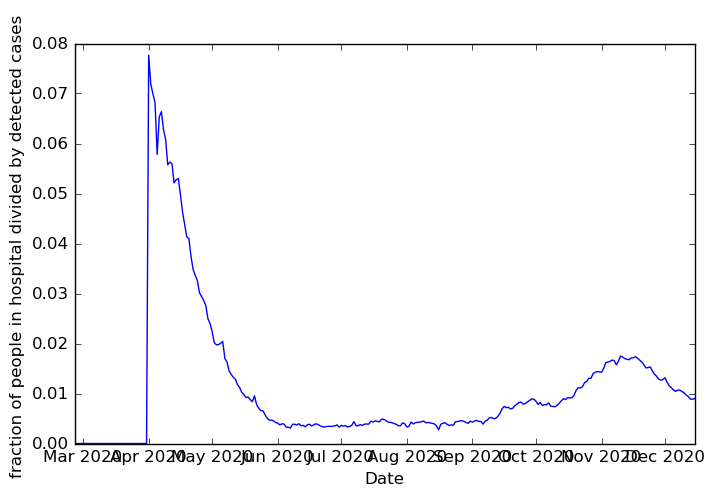

In [92]:
df=pd.read_excel('Data_Austria.xlsx',header=0,
index_col=False)
df.head()
df['date']

plt.figure(figsize=(8, 5),facecolor="white")
plt.xlabel('Date')
plt.ylabel('fraction of people in hospital divided by detected cases ')
plt.plot(df['date'],df['COVIDsoinsnormaux']/df['new_cases_cum'])

NumberDaysData = len(df['date'])

In [93]:
#Prevelance
N=8901064 #population
calculatedhavingcorona=0.33/100*N
print(calculatedhavingcorona)
havinguntildetectedcases=12115 #4th April
p1=havinguntildetectedcases/calculatedhavingcorona
print(p1)

29373.5112
0.4124464357533123


In [94]:
#model
def ODE_system(rho,alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,
               v,t):   
    y=np.zeros((16))
    
    y[0]=beta*(v[5]+v[3])*v[0]*-rho #S
    y[1]=rho*beta*v[0]*(v[5]+v[3]) - alpha*v[1]#E
    y[2]= tau5*v[8]*p5+tau6*v[10]*p6+p7*tau7*v[11]#R
    y[3]=alpha*p1*v[1]-tau1*v[3]#II
    y[4]= tau1*v[3]-v[4]*(1-p2)*tau2-p2*v[4]*tau2#Q
    y[5]=(1-p1)*alpha*v[1]-v[5]*tau8#NII
    y[6]=  (1-p6)*v[10]*tau6+(1-p5)*v[8]*tau5+(1-p4)*tau4*v[9]#
    y[7]=  p2*v[4]*tau2-p3*v[7]*tau3-(1-p3)*v[7]*tau3#H
    y[8]= p3*v[7]*tau3-p5*v[8]*tau5-(1-p5)*v[8]*tau5#Hl
    y[9]=  (1-p3)*v[7]*tau3-tau4*v[9]*p4-(1-p4)*v[9]*tau4#ICU
    y[10]=  tau4*v[9]*p4-v[10]*tau6*p6-v[10]*tau6*(1-p6)#AICU
    y[11]=v[4]*(1-p2)*tau2-tau7*(1-p7)*v[11]-p7*tau7*v[11]#NI
    y[12]=v[5]*tau8-tau9*(1-p9)*v[12]-p9*tau9*v[12]#NI1
    y[13]=p9*v[12]*tau9#R1
    y[14]=(1-p9)*tau9*v[12]#D1
    y[15]=(1-p7)*v[11]*tau7#
    
    if (t>=112): 
        y[0]=beta*(v[5]+v[3])*v[0]*-rho #S
        y[1]=rho*beta*v[0]*(v[5]+v[3]) - alpha*v[1]#E
        y[2]= tau5prim*v[8]*p5prim+tau6prim*v[10]*p6prim+p7prim*tau7prim*v[11]#R
        y[3]=alpha*p1*v[1]-tau1*v[3]#II
        y[4]= tau1*v[3]-v[4]*(1-p2prim)*tau2-p2prim*v[4]*tau2#Q
        y[5]=(1-p1)*alpha*v[1]-v[5]*tau8prim#NII
        y[6]=  (1-p6prim)*v[10]*tau6prim+(1-p5prim)*v[8]*tau5prim+(1-p4prim)*tau4prim*v[9]#
        y[7]=  p2prim*v[4]*tau2-p3prim*v[7]*tau3prim-(1-p3prim)*v[7]*tau3prim#H
        y[8]= p3prim*v[7]*tau3prim-p5prim*v[8]*tau5prim-(1-p5prim)*v[8]*tau5prim#Hl
        y[9]=  (1-p3prim)*v[7]*tau3prim-tau4prim*v[9]*p4prim-(1-p4prim)*v[9]*tau4prim#ICU
        y[10]=  tau4prim*v[9]*p4prim-v[10]*tau6prim*p6prim-v[10]*tau6prim*(1-p6prim)#AICU
        y[11]=v[4]*(1-p2prim)*tau2-tau7prim*(1-p7prim)*v[11]-p7prim*tau7prim*v[11]#NI
        y[12]=v[5]*tau8prim-tau9prim*(1-p9prim)*v[12]-p9prim*tau9prim*v[12]#NI1
        y[13]=p9prim*v[12]*tau9prim#R1
        y[14]=(1-p9prim)*tau9prim*v[12]#D1
        y[15]=(1-p7prim)*v[11]*tau7prim#
    return y

In [95]:
def rhoAsFunctionforAustria(time,ListOfRhos):
    
    rho0 = ListOfRhos[0]
    rho1 = ListOfRhos[1]
    rho2 = ListOfRhos[2]
    rho3 = ListOfRhos[3]
    rho4 = ListOfRhos[4]
    rho5 = ListOfRhos[5]
    rho6 = ListOfRhos[6]
    rho7 = ListOfRhos[7]
    rho8 = ListOfRhos[8]
    rho9 = ListOfRhos[9]
    rho10 = ListOfRhos[10]
    rho11 = ListOfRhos[11]
    rho12 = ListOfRhos[12]
    rho13 = ListOfRhos[13]
    rho14 = ListOfRhos[14]
    rho15 = ListOfRhos[15]
    rho16 = ListOfRhos[16]
         
    ListOfRhosOUTPUT = []
    for t in time:
        if (t<25):
            rho=1
        elif (t>=25)and (t<39):
            rho=rho1
        elif (t>=39)and (t<54):
            rho=rho2
        elif (t>=54)and (t<71):
            rho=rho3
        elif (t>=71)and (t<85):  
            rho=rho4
        elif (t>=85)and(t<99):
            rho=rho5
        elif (t>=99) and (t<116):
            rho=rho6
        elif (t>=116) and (t<142):
            rho=rho7
        elif(t>=142) and (t<152):
            rho=rho8
        elif(t>=152)and (t<175):
            rho=rho9
        elif(t>=175) and (t<207):
            rho=rho10
        elif(t>=207) and (t<214):
            rho=rho11  
        elif(t>=214) and (t<246):
            rho=rho12
        elif(t>=246) and (t<257):
            rho=rho13
        elif(t>=257) and(t<271) :
            rho=rho14
        elif(t>=271)and(t<291):
            rho=rho15
        elif(t>=291)and(t<NumberDaysData):
            rho=rho16
        
        elif t >= NumberDaysData:
            if len(ListOfRhos) < 18:
                rho=rho16
            elif len(ListOfRhos) >= 18:
                rho=ListOfRhos[17]
            
        ListOfRhosOUTPUT.append(rho)
    return np.array(ListOfRhosOUTPUT)


In [96]:
# rho values
rho1=0.52
rho2=0.155
rho3=0.22
rho4=0.27
rho5=0.31 
rho6=0.33 
rho7=0.38
rho8=0.36
rho9=0.32
rho10=0.385
rho11=0.415
rho12=0.405
rho13=0.395
rho14=0.385
rho15=0.27
rho16=0.34

ListOfRhos=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
ListOfRhos_ManualFit_1stWave=ListOfRhos


In [97]:
# Some Plotting Variables shared by all Plots

LenghtOfForecast = 136 # 60 # This hold for all plots: by how many days you wish to show simulation, after end of data?
endofplot = NumberDaysData + LenghtOfForecast

MyListOfDates = ['21 February']
for Day in np.arange(22,30,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January'
    MyListOfDates.append(ThisDate)
MyListOfDates=np.array(MyListOfDates)

#only10thindex=np.arange(0,endofplot+1,15)
only10thindex=np.arange(0,endofplot+1,30)

times=np.arange(0,endofplot+1,1)

plt.style.use('ggplot')
mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

FileFormatOfFigures = '.pdf' # Could be also '.pdf'

In [98]:
MyListOfDates[endofplot]

'1 May'

Results_Austria folder already exists.


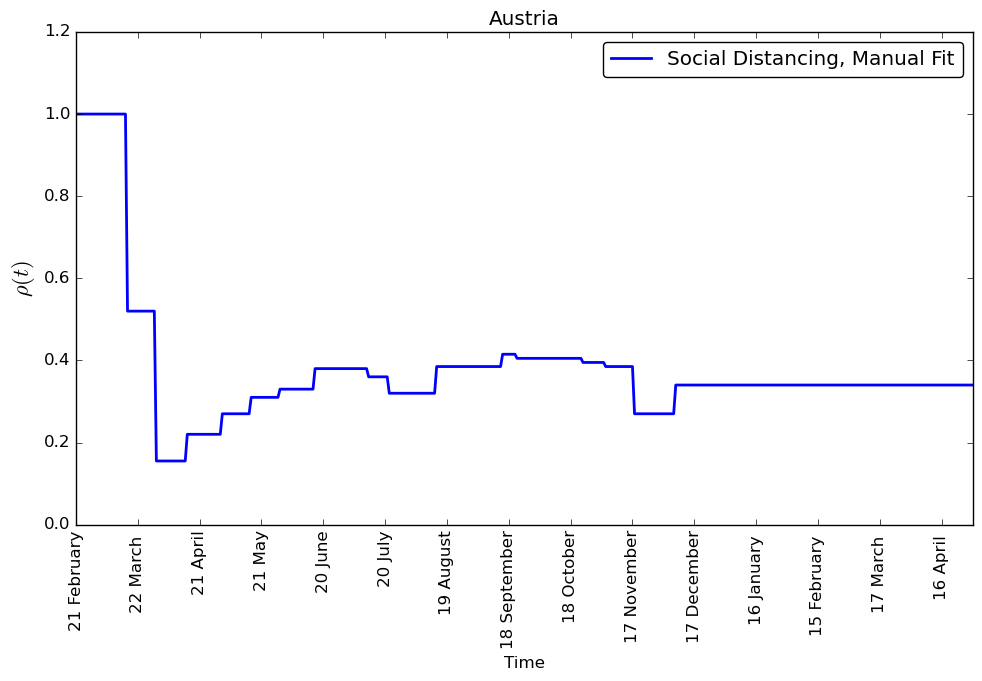

In [99]:
# Put here the values of rho coming from fits
#social interaction over time
plt.figure(facecolor="white",figsize=(10,7))
times=np.arange(0,endofplot+1,1)
plt.plot(times,rhoAsFunctionforAustria(times,ListOfRhos),'-',color='blue',label='Social Distancing, Manual Fit',lw=2)
plt.title('Austria')
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xlabel("Time")
plt.ylabel(r"$\rho(t) $",size = 16)
plt.ylim(0,1.2)
plt.xlim(0,endofplot)
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.tight_layout()

MYDIR = ("Results_Austria")
CHECK_FOLDER = os.path.isdir(MYDIR)
# If folder doesn't exist, then create it.
if not CHECK_FOLDER:
    os.makedirs(MYDIR)
    print("created folder : ", MYDIR)
else:
    print(MYDIR, "folder already exists.")
    
plt.savefig('./Results_Austria/Rho_SEIR-ICU_AUSTRIA'+ FileFormatOfFigures)

In [100]:
def model_SEIRICUHOS(v,t,ListOfRhos,ListOfParameters):
    
    alpha=ListOfParameters[0] 
    beta=ListOfParameters[1]
    p1=ListOfParameters[2]
    p2=ListOfParameters[3]
    p3=ListOfParameters[4]
    p4=ListOfParameters[5]
    p5=ListOfParameters[6]
    p6=ListOfParameters[7]
    p7=ListOfParameters[8]
    p9=ListOfParameters[9]
    tau1 = ListOfParameters[10]
    tau2 = ListOfParameters[11]
    tau3 = ListOfParameters[12]
    tau4 = ListOfParameters[13]
    tau5 = ListOfParameters[14]
    tau6 = ListOfParameters[15]
    tau7 = ListOfParameters[16]
    tau8 = ListOfParameters[17]
    tau9 = ListOfParameters[18]
    p2prim=ListOfParameters[19]
    p3prim=ListOfParameters[20]
    p4prim=ListOfParameters[21]
    p5prim=ListOfParameters[22]
    p6prim=ListOfParameters[23]
    p7prim=ListOfParameters[24]
    p9prim=ListOfParameters[25]
    tau3prim=ListOfParameters[26]
    tau4prim=ListOfParameters[27]
    tau5prim=ListOfParameters[28]
    tau6prim=ListOfParameters[29]
    tau7prim=ListOfParameters[30]
    tau8prim=ListOfParameters[31]
    tau9prim=ListOfParameters[32]
    
    rho=rhoAsFunctionforAustria([t],ListOfRhos)
    y=ODE_system(rho[0],alpha, beta, 
               p1,p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
            p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,
                 v,t)
    return y

In [101]:
#parameters list
tau1=0.6808
tau2=0.5979
tau3=0.5246
    
p3=0.72
p2=0.162
p4old=0.76
p5old=0.89
p6old=0.89
    
alpha=0.4433
beta=1.287
    
p7=0.99

tau7=0.1084
tau6sur=1/10.
tau6die=1/6.
tau5sur=1/10.
tau5die=1/7.
tau4sur=1/11.
tau4die=1/8.
tau8=1/(1/tau1+1/tau2)
p9=p7
tau9=tau7

x4=tau4sur*p4old
y4=tau4die*(1-p4old)

tau4=x4+y4
p4=x4/(x4+y4)

x5=tau5sur*p5old
y5=tau5die*(1-p5old)

tau5=x5+y5
p5=x5/(x5+y5)

x6=tau6sur*p6old
y6=tau6die*(1-p6old)

tau6=x6+y6
p6=x6/(x6+y6)


tau3prim=0.5246
    
p3prim=0.82
p2prim=0.065
p4oldprim=0.87
p5oldprim=0.92
p6oldprim=0.92
    
p7prim=0.992

tau7prim=0.1084
tau6surprim=0.0832
tau6dieprim=0.1127
tau5surprim=1/8.
tau5dieprim=0.1124
tau4surprim=1/11.
tau4dieprim=0.1207
tau8prim=1/(1/tau1+1/tau2)
p9prim=p7prim
tau9prim=tau7prim

x4prim=tau4surprim*p4oldprim
y4prim=tau4dieprim*(1-p4oldprim)

tau4prim=x4prim+y4prim
p4prim=x4prim/(x4prim+y4prim)

x5prim=tau5surprim*p5oldprim
y5prim=tau5dieprim*(1-p5oldprim)

tau5prim=x5prim+y5prim
p5prim=x5prim/(x5prim+y5prim)

x6prim=tau6surprim*p6oldprim
y6prim=tau6dieprim*(1-p6oldprim)

tau6prim=x6prim+y6prim
p6prim=x6prim/(x6prim+y6prim)


ListOfParametersfirstwave=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                    tau7prim,tau8prim,tau9prim])


In [102]:
# Run the model

N=8901064
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
t_max = 1000
dt = 1
t = np.linspace(0, t_max, int(t_max/dt) + 1)
resultsseir=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos,ListOfParametersfirstwave))


In [103]:
# Define Function To Compute the Seven Days Moving Average

def ComputeSevenDaysMovingAverage(InputRawData):

    WeeklyAveragedData = [
        InputRawData[0]/1,
        sum(InputRawData[0:2])/3,
        sum(InputRawData[0:4])/5]
    
    Final = len(InputRawData)
    for i in np.arange(3,Final-3,1):
        WeeklyAveragedData.append(sum(InputRawData[i-3:i+3+1])/7)
        
    WeeklyAveragedData.append(sum(InputRawData[Final-5::])/5)
    WeeklyAveragedData.append(sum(InputRawData[Final-3::])/3)
    WeeklyAveragedData.append(InputRawData[Final-1]/1)
    
    WeeklyAveragedData = np.array(WeeklyAveragedData)
    
    return WeeklyAveragedData

In [104]:
Rho_BestScenario = min(ListOfRhos)
Rho_WorstScenario = ListOfRhos[13] # max(ListOfRhos[1:-1])

List_Rho_BestScenario = list(ListOfRhos) + [Rho_BestScenario]
List_Rho_WorstScenario = list(ListOfRhos) + [Rho_WorstScenario]

resultsseir_Best=odeint(model_SEIRICUHOS,P2,t,(List_Rho_BestScenario,ListOfParametersfirstwave))
resultsseir_Worst=odeint(model_SEIRICUHOS,P2,t,(List_Rho_WorstScenario,ListOfParametersfirstwave))


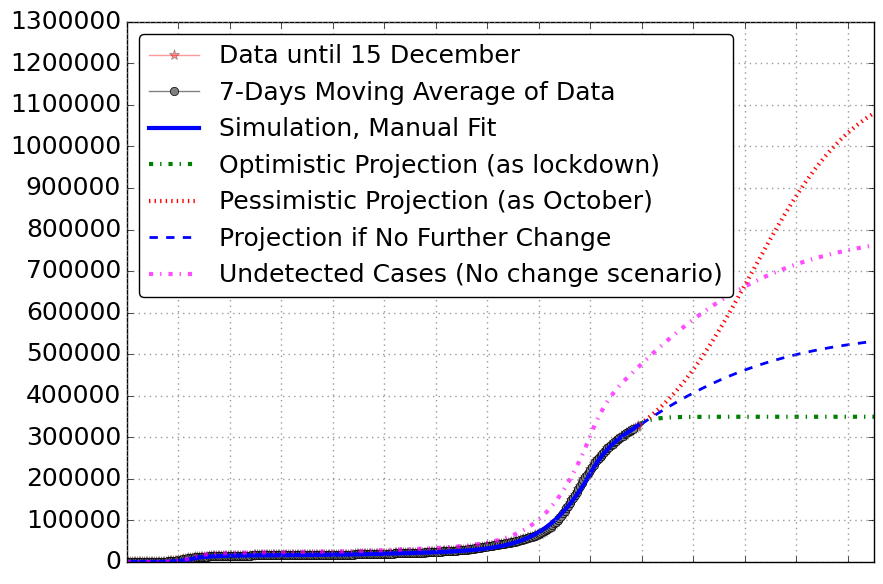

In [105]:
#cumulitive number of cases
plt.figure(figsize=(9, 6),facecolor="white")

DI=df['new_cases_cum']
SevenDaysMovingAverage_TotalCases = ComputeSevenDaysMovingAverage(DI)
p =len(SevenDaysMovingAverage_TotalCases)
    
plt.plot(times[0:p],DI,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_TotalCases)-1]),alpha=0.4, markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_TotalCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11]+resultsseir[:,15])[0:NumberDaysData]*N, label="Simulation, Manual Fit", linewidth=3,color='blue')

Optimistic = resultsseir_Best[:,2]+resultsseir_Best[:,3]+resultsseir_Best[:,4]+resultsseir_Best[:,6]+resultsseir_Best[:,7]+resultsseir_Best[:,8]+resultsseir_Best[:,9]+resultsseir_Best[:,10]+resultsseir_Best[:,11]+resultsseir_Best[:,15]
Pessimistic = resultsseir_Worst[:,2]+resultsseir_Worst[:,3]+resultsseir_Worst[:,4]+resultsseir_Worst[:,6]+resultsseir_Worst[:,7]+resultsseir_Worst[:,8]+resultsseir_Worst[:,9]+resultsseir_Worst[:,10]+resultsseir_Worst[:,11]+resultsseir_Worst[:,15]
plt.plot(t[NumberDaysData:-1],Optimistic[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],Pessimistic[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11])*N,'--', label="Projection if No Further Change", linewidth=2,color='blue')

plt.plot(t,(resultsseir[:,12]+resultsseir[:,13]+resultsseir[:,14]+resultsseir[:,5])*N,'-.', label="Undetected Cases (No change scenario)", linewidth=3,color='magenta',alpha=0.7)

UpperY = 1300000 # 400000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY+1,100000),fontsize=18)

#plt.title("Austria")

#plt.legend(loc='upper left')
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Total Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY)
plt.legend(loc='upper left', fancybox=True, numpoints=1,fontsize=18)
plt.tight_layout()
plt.savefig('./Results_Austria/TotalCases_SEIR-ICU_AUSTRIA'+ FileFormatOfFigures)

In [106]:
list_of_tuples=list(zip(df['date'],SevenDaysMovingAverage_TotalCases))
df1=pd.DataFrame(list_of_tuples,columns=['Date','Cases'])
df1
df1.to_csv(r'dataframe_moving_average-AUSTRIA.csv', index = False)
# minimum of daily new cases 11 June (112)

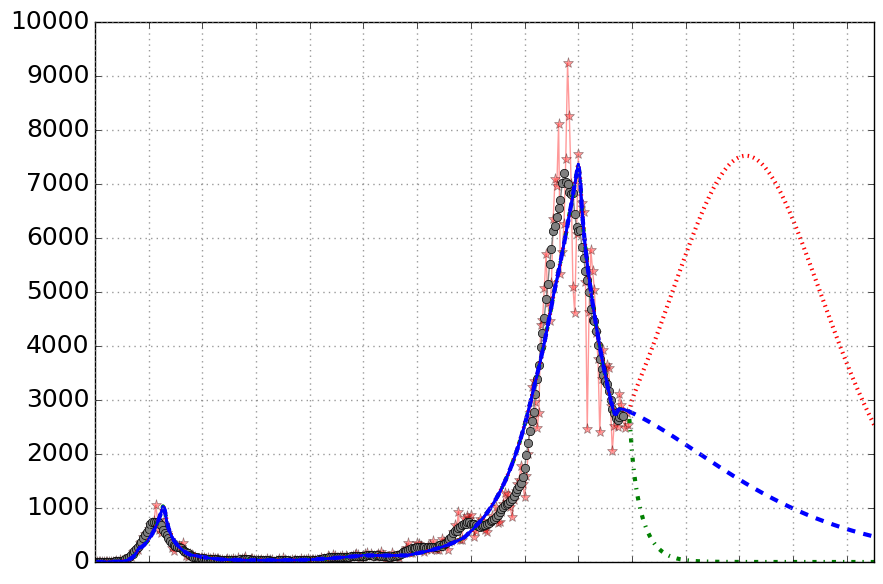

In [107]:
#daily new cases
plt.figure(figsize=(9, 6),facecolor="white")

DI1=df['new_cases']
SevenDaysMovingAverage_DailyCases = ComputeSevenDaysMovingAverage(DI1)
p =len(SevenDaysMovingAverage_DailyCases)
    
plt.plot(times[0:p],DI1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_DailyCases)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_DailyCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
yoo=(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11]+resultsseir[:,15])*N

yooOptimistic = Optimistic*N
yooPessimistic = Pessimistic*N

pp=len(yoo)

yuu=np.zeros(1001)
for ii in range(0,1000):
    yuu[ii]= yoo[ii+1]-yoo[ii]
plt.plot(np.arange(0,1001,1)[0:NumberDaysData],yuu[0:NumberDaysData],label="Simulation, Manual Fit", linewidth=2,color='blue')

yuuOptimistic=np.zeros(1001)
for ii in range(0,1000):
    yuuOptimistic[ii]= yooOptimistic[ii+1]-yooOptimistic[ii]
plt.plot(np.arange(0,1001,1)[0:pp+1],yuuOptimistic,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')

yuuPessimistic=np.zeros(1001)
for ii in range(0,1000):
    yuuPessimistic[ii]= yooPessimistic[ii+1]-yooPessimistic[ii]
plt.plot(np.arange(0,1001,1)[0:pp+1],yuuPessimistic,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')

plt.plot(np.arange(0,1001,1)[0:NumberDaysData],yuu[0:NumberDaysData], linewidth=2,color='blue')

plt.plot(np.arange(0,1001,1)[0:pp+1],yuu,'--', label="Projection if No Further Change", linewidth=3)

UpperY1 = 10000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY1+1,1000),fontsize=18)

#plt.title("Austria")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Daily New Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY1)

plt.tight_layout()
plt.savefig('./Results_Austria/DailyNewCases_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)

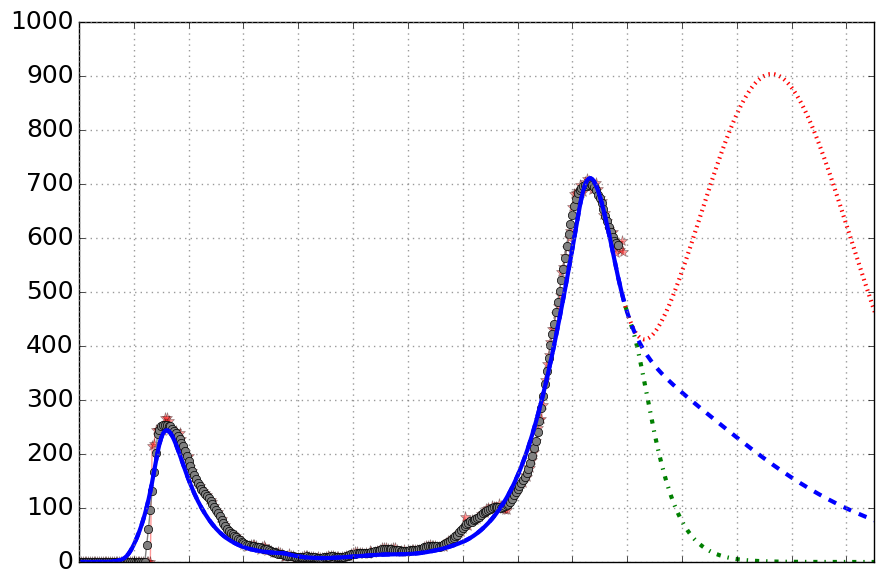

In [108]:
#ICU plot
plt.figure(figsize=(9, 6),facecolor="white")

icu1=df['COVIDensoinsintensifs']
SevenDaysMovingAverage_ICU = ComputeSevenDaysMovingAverage(icu1)
p =len(SevenDaysMovingAverage_ICU)
    
plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,9])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],resultsseir_Best[:,9][NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],resultsseir_Worst[:,9][NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,resultsseir[:,9]*N,'--', label="Projection if No Further Change", linewidth=3)

UpperY2 = 1000
plt.xticks(times[only10thindex], '')
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,UpperY2+1,100),fontsize=18)

#plt.title("Austria")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in ICU",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY2)

plt.tight_layout()
plt.savefig('./Results_Austria/ICU_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)

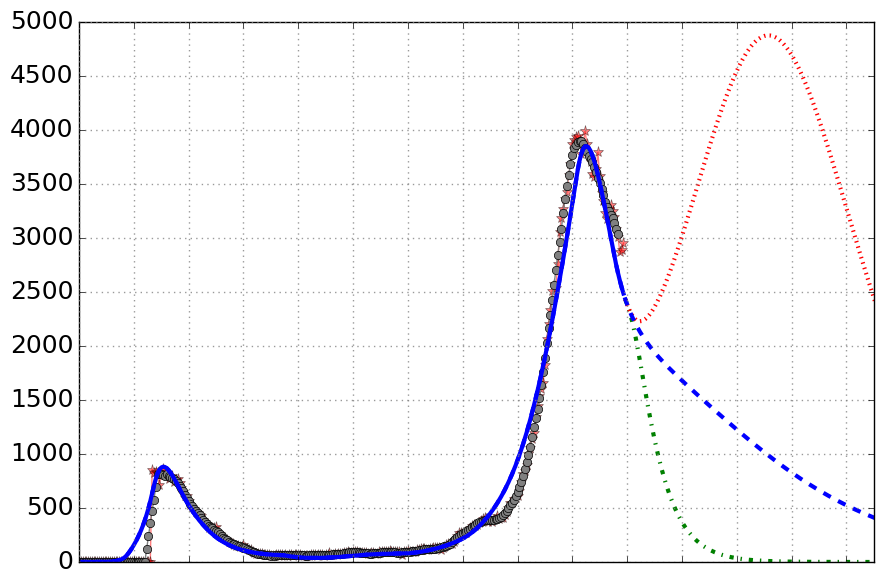

In [109]:
#normal care
plt.figure(figsize=(9, 6),facecolor="white")

H=df['COVIDsoinsnormaux']
SevenDaysMovingAverage_Hos = ComputeSevenDaysMovingAverage(H)
p =len(SevenDaysMovingAverage_Hos)
    
plt.plot(times[0:p],H,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_Hos)-1]),alpha=0.5,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_Hos[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,10])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_Best[:,7]+resultsseir_Best[:,8]+resultsseir_Best[:,10])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir_Worst[:,7]+resultsseir_Worst[:,8]+resultsseir_Worst[:,10])[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,10])*N,'--', label="Projection if No Further Change", linewidth=3)

UpperY3 = 5000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY3+1,500),fontsize=18)

#plt.title("Austria")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in Hospital",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/Hospital_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)

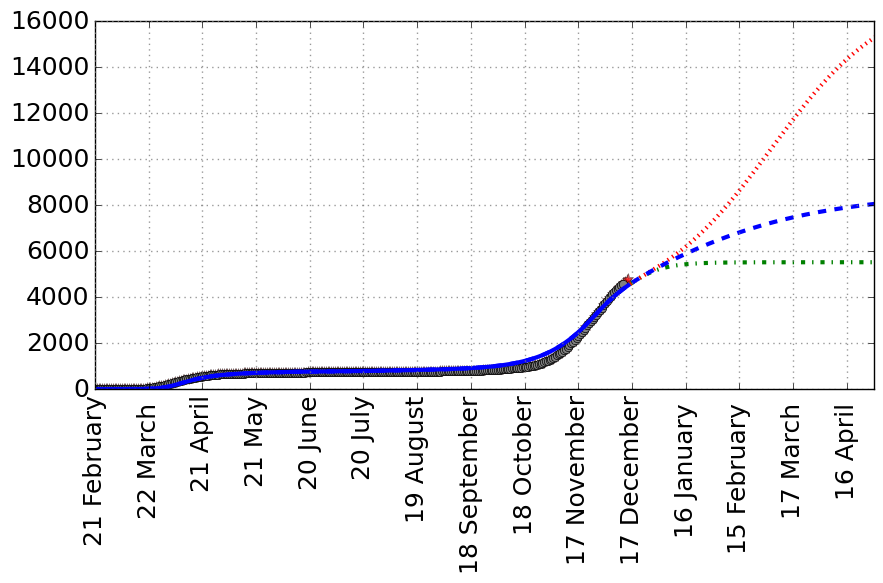

In [110]:
#dead
plt.figure(figsize=(9, 6),facecolor="white")

dead=df['dead-tot']
SevenDaysMovingAverage_dead = ComputeSevenDaysMovingAverage(dead)
p =len(SevenDaysMovingAverage_dead)

plt.plot(times[0:p],dead,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_dead)-1]),alpha=0.5,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_dead[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,6]+resultsseir[:,15])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_Best[:,6]+resultsseir_Best[:,15])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir_Worst[:,6]+resultsseir_Worst[:,15])[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,6]+resultsseir[:,15])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = 16000
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=18)
plt.yticks(np.arange(0,UpperY3+1,2000),fontsize=18)

#plt.title("Austria")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Dead People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/Dead_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)

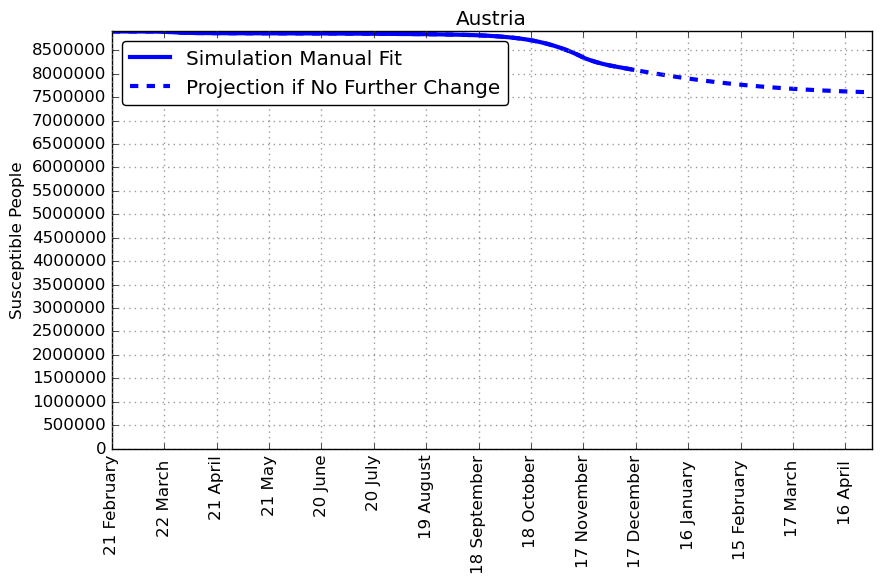

In [111]:
#susceptible
plt.figure(figsize=(9, 6),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir[:,0])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = N
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,UpperY3+1,500000))

plt.title("Austria")

plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
plt.ylabel("Susceptible People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/Susceptible_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)

In [112]:
list_of_tuples=list(zip(df['date'],SevenDaysMovingAverage_TotalCases,SevenDaysMovingAverage_ICU,SevenDaysMovingAverage_Hos,SevenDaysMovingAverage_dead))
df2=pd.DataFrame(list_of_tuples,columns=['Date','Cases','ICU','Hospital','Dead'])
df2.to_csv(r'dataframe_moving_average.csv', index = False)

In [113]:
data=np.vstack((df2['Cases'],df2['ICU']))
data2=np.vstack((df2['Hospital'],df2['Dead']))
data1=np.vstack((data,data2))

In [114]:
def R_eff(MyTimes,My_cases_sim,ListOfRhos):
    RhosList = rhoAsFunctionforAustria(MyTimes,ListOfRhos)
    R_eff=np.zeros(len(MyTimes))
    for i in range(0, len(MyTimes)):
        rho = RhosList[i]
        R_eff[i]= beta*rho*((1-p1)*1/tau8+p1/tau1)*(My_cases_sim[i])/N
    return R_eff

In [115]:
cases_sim=(resultsseir[:,0])*N
cases_sim_Optimistic=(resultsseir_Best[:,0])*N
cases_sim_Pessimistic=(resultsseir_Worst[:,0])*N

print(cases_sim)
print(cases_sim_Optimistic)
print(cases_sim_Pessimistic)

[8901063.     8901062.7712 8901062.2162 ... 7540072.4439 7540072.4119
 7540072.3804]
[8901063.     8901062.7712 8901062.2162 ... 8053697.158  8053697.158
 8053697.158 ]
[8901063.     8901062.7712 8901062.2162 ... 6063494.2215 6063494.2211
 6063494.2207]


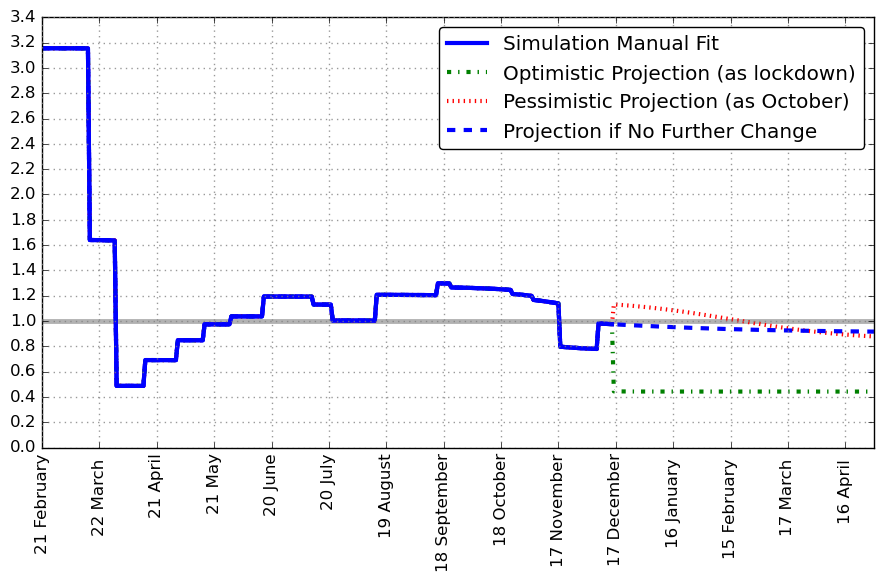

In [116]:
Reff = R_eff(times, cases_sim, ListOfRhos)
Reff_Opt = R_eff(times, cases_sim_Optimistic, List_Rho_BestScenario)
Reff_Pess = R_eff(times, cases_sim_Pessimistic, List_Rho_WorstScenario)

plt.figure(figsize=(9, 6),facecolor='white')

plt.axhline(y=1,color='gray',linewidth=3.5, alpha = 0.6)

plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-', label="Simulation Manual Fit", linewidth=3,color='blue')
plt.plot(times,Reff_Opt,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(times,Reff_Pess,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(times,Reff,'--', label="Projection if No Further Change", linewidth=3,color='blue')
plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-',linewidth=3,color='blue')

UpperY3 = 3.4

plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,UpperY3+1,0.2))

#plt.title('Austria')

plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel(“Time”)
#plt.ylabel(r'$R_{eff}(t)$',size=18)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/R_eff_AUSTRIA' + FileFormatOfFigures)

In [117]:
Reff[NumberDaysData]

0.9739

0.34


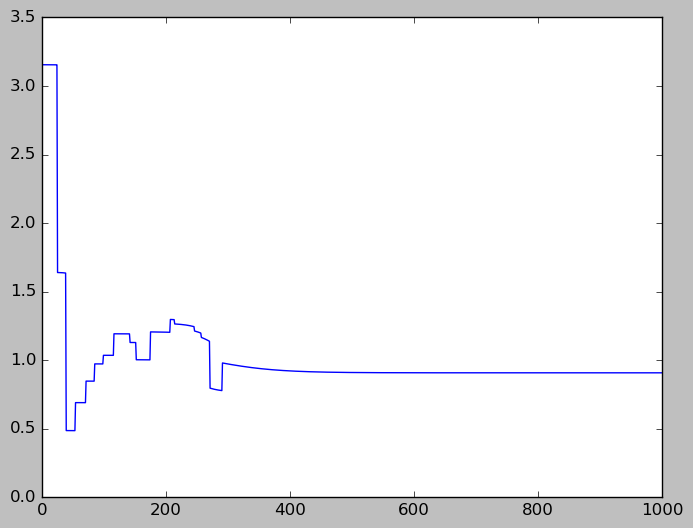

In [118]:
ListReffTODAY = []
TentativeRhosList = np.arange(0,1.01,0.01)
ListFullRefft = []
for ThisRho in TentativeRhosList:
    List_Rho_FindMaxRho_SuchThat_Refft_is_1 = list(ListOfRhos) + [ThisRho]
    resultsseir_FindRho=odeint(model_SEIRICUHOS,P2,t,(
        List_Rho_FindMaxRho_SuchThat_Refft_is_1,
        ListOfParametersfirstwave))
    cases_sim_FindRho = (resultsseir_FindRho[:,0])*N
    Reff_FindRho = R_eff(t, cases_sim_FindRho, List_Rho_FindMaxRho_SuchThat_Refft_is_1)
    ListReffTODAY.append(Reff_FindRho[NumberDaysData])
    ListFullRefft.append(Reff_FindRho)
#print(ListReffTODAY)
Index_MaxRhoSuchThatRsmallerEq1 = np.where(np.array(ListReffTODAY)<=1)[0][-1]
#print(Index_MaxRhoSuchThatRsmallerEq1)
print(TentativeRhosList[Index_MaxRhoSuchThatRsmallerEq1])
plt.plot(ListFullRefft[Index_MaxRhoSuchThatRsmallerEq1])

In [119]:
"""
#####################################################################
#####   NOW FIT FIRST WAVE WITH MANUAL AND THEN AUTOMATED FIT   #####
#####################################################################

"""

'\n#####################################################################\n#####   NOW FIT FIRST WAVE WITH MANUAL AND THEN AUTOMATED FIT   #####\n#####################################################################\n\n'

In [255]:
# HERE WE SHOULD ADD THE LAST RHO CHANGE AND THE APPROPRIATE SECOND WAVE PARAMS< EVEN IF NOT USED< FOR MORE CONSISTENCY

def gpp2_1stWave(u,t,theta):

    tt=len(SevenDaysMovingAverage_TotalCases)
    y=np.zeros((16))
    v=u
    
    rho1=theta[0]
    rho2=theta[1]
    rho3=theta[2]
    rho4=theta[3]
    rho5=theta[4]
    rho6=theta[5]
    tau1=theta[6]
    tau2=theta[7]
    tau3=theta[8]
    p3=theta[9]
    p2=theta[10]
    p4=theta[11]
    p5=theta[12]
    p6=theta[13]
    alpha=theta[14]
    beta=theta[15]
    p7=theta[16]
    tau7=theta[17]
    tau6=theta[18]

    tau5=theta[19]

    tau4=theta[20]
    tau8=1/(1/tau1+1/tau2)

    p9=p7
    tau9=tau7
    
    # PARAMETERS SECOND WAVE (needed only for when odeint needs further timepoints to solve numerically 
    # this system of ODEs, so even if evaluate it at t= 101=end first wave, it might require later timepoints)
        
    # Manula plus automated fit (scipy.optimize.minimize)
    rho7=0.38
    rho8=0.36
    rho9=0.32
    rho10=0.385          
    rho11=0.415
    rho12=0.405
    rho13=0.395
    rho14=0.385
    rho15=0.27
    rho16=0.34
    ListOfRhostrial=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
    
    tau3prim=0.5246

    p3prim=0.82
    p2prim=0.065
    p4oldprim=0.87
    p5oldprim=0.92
    p6oldprim=0.92

    p7prim=0.992

    tau7prim=0.1084
    tau6surprim=0.0832
    tau6dieprim=0.1127
    tau5surprim=1/8.
    tau5dieprim=0.1124
    tau4surprim=1/11.
    tau4dieprim=0.1207
    tau8prim=1/(1/tau1+1/tau2)
    p9prim=p7prim
    tau9prim=tau7prim

    x4prim=tau4surprim*p4oldprim
    y4prim=tau4dieprim*(1-p4oldprim)

    tau4prim=x4prim+y4prim
    p4prim=x4prim/(x4prim+y4prim)

    x5prim=tau5surprim*p5oldprim
    y5prim=tau5dieprim*(1-p5oldprim)

    tau5prim=x5prim+y5prim
    p5prim=x5prim/(x5prim+y5prim)

    x6prim=tau6surprim*p6oldprim
    y6prim=tau6dieprim*(1-p6oldprim)

    tau6prim=x6prim+y6prim
    p6prim=x6prim/(x6prim+y6prim)

    ListOfParametersfirstwave=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim])
    
    y=model_SEIRICUHOS(v,t,ListOfRhostrial,ListOfParametersfirstwave)
    return y

In [256]:
def errorxy12_1stWave(theta,data):
    RMS=np.zeros(102)
    P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
    tt=len(SevenDaysMovingAverage_TotalCases)    
    endfirstwave=112
    t2=np.linspace(0,endfirstwave-1,endfirstwave)
    y=data1

    resultsseir2=odeint(gpp2_1stWave,P2,t2,args=(theta,))
    
    # S, E, R ,I ,Q, A, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
    
    # detected -> dead + recovered + icu + hos + icu + qua
    cc=(resultsseir2[:,2]+resultsseir2[:,3]+resultsseir2[:,4]+resultsseir2[:,6]+resultsseir2[:,7]+resultsseir2[:,8]+resultsseir2[:,9]+resultsseir2[:,10]+resultsseir2[:,11]+resultsseir2[:,15])*N-y[0,0:endfirstwave]
    cci=((cc**2).sum(axis=0))
    
    # icu -> icu
    bi=((resultsseir2[:,9])*N- y[1,0:endfirstwave])
    bbi=((bi**2).sum(axis=0))
    
    # hospital -> hos + aicu
    ee=((resultsseir2[:,7]+resultsseir2[:,8]+resultsseir2[:,10])*N)-y[2,0:endfirstwave]
    eei=((ee**2).sum(axis=0))
    
    # dead 
    di=((resultsseir2[:,6]+resultsseir2[:,15])*N- y[3,0:endfirstwave])
    ddi=((di**2).sum(axis=0))

    RMS= cci + eei + bbi + ddi

    return RMS

In [47]:
"""
#####################################################################
#####   NOW FIT SECOND WAVE WITH MANUAL AND THEN AUTOMATED FIT  #####
#####################################################################
"""

'\n#####################################################################\n#####   NOW FIT SECOND WAVE WITH MANUAL AND THEN AUTOMATED FIT  #####\n#####################################################################\n'

In [48]:
def gpp2_2ndWave(u,t,theta,data):

    tt=len(SevenDaysMovingAverage_TotalCases)
    y=np.zeros((16))
    v=u

    # Manula plus automated fit (scipy.optimize.minimize)
    
    

    tau1=0.6808
    tau2=0.5979
    tau3=0.5246
    
    p3=0.72#0.7906
    p2=0.162#0.172#0.1534
    p4old=0.76#0.75#0.85#0.91
    p5old=0.89#0.88#0.9295
    p6old=0.89#0.88#0.9298
    
    alpha=0.4433
    beta=1.287
    
    p7=0.99#0.9876

    tau7=0.1084
    tau6sur=1/10.#0.0832
    tau6die=1/6.#0.1127
    tau5sur=1/10.#0.0579#1/9.#1/8. 
    tau5die=1/7.#0.1124
    tau4sur=1/11.#1/11.#1/11.#0.0444
    tau4die=1/8.#0.1207
    tau8=1/(1/tau1+1/tau2)
    p9=p7
    tau9=tau7

    x4=tau4sur*p4old
    y4=tau4die*(1-p4old)

    tau4=x4+y4
    p4=x4/(x4+y4)

    x5=tau5sur*p5old
    y5=tau5die*(1-p5old)

    tau5=x5+y5
    p5=x5/(x5+y5)

    x6=tau6sur*p6old
    y6=tau6die*(1-p6old)

    tau6=x6+y6
    p6=x6/(x6+y6)

    # PARAMETERS SECOND WAVE
    
    rho7=theta[0]
    rho8=theta[1]
    rho9=theta[2]
    rho10=theta[3]
    rho11=theta[4]
    rho12=theta[5]
    rho13=theta[6]
    rho14=theta[7]
    rho15=theta[8]
    rho16=theta[9]
    
    ListOfRhostrail2=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
    
    #tau1prim=tau1
    #tau2prim=tau2
    tau3prim=theta[10]
    
    p3prim=theta[11]
    p2prim=theta[12]
    p4prim=theta[13]
    p5prim=theta[14]
    p6prim=theta[15]
    p7prim=theta[16]
    
    tau7prim=theta[17]
    tau6prim=theta[18]
    #tau6dieprim=theta[18]
    tau5prim=theta[19]
    #tau5dieprim=theta[20]
    tau4prim=theta[20]
    #tau4dieprim=theta[22]
    
    tau8prim=1/(1/tau1+1/tau2)
    p9prim=p7prim
    tau9prim=tau7prim
    
    ListOfParameterssecondwave=np.array([alpha, beta, 
               p1,p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim])
    
    y=model_SEIRICUHOS(v,t,ListOfRhostrail2,ListOfParameterssecondwave)

    return y

In [49]:
def errorxy12_2ndWave(theta,data):
    
    P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
    tt=len(SevenDaysMovingAverage_TotalCases)
    endfirstwave=112
    RMS=np.zeros(tt-endfirstwave+1)
    #176 as the rest in nan
    t2=np.linspace(0,tt-1,tt)
    y=data1
   
    resultsseir2=odeint(gpp2_2ndWave,P2,t2,args=(theta,data1))
    
    cc=0
    bi=0
    ee=0
    di=0
    
    # S, E, R ,I ,Q, A, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
    
    cc=(resultsseir2[endfirstwave:tt,2]+resultsseir2[endfirstwave:tt,3]+resultsseir2[endfirstwave:tt,4]+resultsseir2[endfirstwave:tt,6]+resultsseir2[endfirstwave:tt,7]+resultsseir2[endfirstwave:tt,8]+resultsseir2[endfirstwave:tt,9]+resultsseir2[endfirstwave:tt,10]+resultsseir2[endfirstwave:tt,11]+resultsseir2[endfirstwave:tt,15])*N-y[0,endfirstwave:tt]
    cci=((cc**2).sum(axis=0))
    
    # icu -> icu
    bi=((resultsseir2[endfirstwave:tt,9])*N- y[1,endfirstwave:tt])
    bbi=((bi**2).sum(axis=0))
    
    # hospital -> hos + aicu
    ee=((resultsseir2[endfirstwave:tt,7]+resultsseir2[endfirstwave:tt,8]+resultsseir2[endfirstwave:tt,10])*N)-y[2,endfirstwave:tt]
    eei=((ee**2).sum(axis=0))
    
    # dead 
    di=((resultsseir2[endfirstwave:tt,6]+resultsseir2[endfirstwave:tt,15])*N- y[3,endfirstwave:tt])
    ddi=((di**2).sum(axis=0))

    RMS= cci + eei  + bbi + ddi
    
    return RMS

In [37]:
#####################################################################################
##### NOW WE ADD HERE MCMC FOR 1ST AND 2ND WAVE AND ALL WHAT'S NEEDED TO RUN IT #####
#####################################################################################

In [38]:
##############################
### PARALLEL MCMC 1st WAVE ###
##############################

# MAIN IMPROVEMENTS W.R.T. PREVIOUS SETUP:

# 1) REMOVE MYSTERIUS SECOND CHAIN
# 2) PARALLEL MCMC x 8 chains
# 3) ALL PARAMETER SPACE
# 4) RANDOM CI, different for every chain
# 5) KEEP ONLY ONE POINT EVERY 100
# 6) LONGER CHAINS 500000
# 7) COMPUTE CONVERGENCE STATISTICS

# X) ALL CHAINS STILL HAVE SAME RANDOM SEED, SHOULD MAKE IT DIFGFERENT FOR EVERY CHAIN (HOW?) OR IRRELEVANT?



In [80]:
errorxy12_2ndWave(0.5*np.ones(21),data)

535849655508025.6875

In [63]:
### FIRST WE CREATE SETUP FOR ONE CHAIN AS WE WERE DOING BEFORE ###

# initialize MCMC object
MyNew_mcstat = MCMC(rngseed=123456789)

# initialize data structure 
MyNew_mcstat.data.add_data_set(x=df2['Date'],y=data1)

# Set Boundaries of Parameter Space
MyNew_mcstat.parameters.add_model_parameter(name='rho1', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho2', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho3', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho4', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho5', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho6', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau1', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau2', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau3', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p3', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p2', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='p4', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p5', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p6', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='alpha', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='beta', minimum=0, maximum=2)
MyNew_mcstat.parameters.add_model_parameter(name='p7', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau7', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau6', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau6die', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau5', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau5die', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau4', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau4die', minimum=0, maximum=0.5)

# Define options
datestr = datetime.now().strftime('%Y%m%d_%H%M%S')
savedir = 'Saved_MCMC_Chains' + os.sep + str('{}_{}'.format(datestr, 'parallel_chains'))
MyNew_mcstat.simulation_options.define_simulation_options(nsimu=int(500e3), updatesigma=True, method='dram',
                                                         savedir=savedir, savesize=10000, save_to_json=True,
                                                          save_lightly=True, save_to_bin=True)
MyNew_mcstat.model_settings.define_model_settings(sos_function=errorxy12_1stWave)


In [64]:
My_Parallel_MCMC = ParallelMCMC()
My_Parallel_MCMC.setup_parallel_simulation(MyNew_mcstat, initial_values=None, num_cores=8, num_chain=8)

In [ ]:
# DO NOT RE-RUN THIS UNLESS YOU WISH A NEW MCMC CHAIN (CAN TAKE 8 HOURS WITH 500000 ITERATIONS)
My_Parallel_MCMC.run_parallel_simulation()

In [66]:
My_Parallel_MCMC.display_individual_chain_statistics()


****************************************
Displaying results for chain 0
Files: Saved_MCMC_Chains/20201220_004848_parallel_chains/chain_0


------------------------------
name      :       mean        std     MC_err        tau     geweke
rho1      :     0.4949     0.2525     0.0124   895.7597     0.9302
rho2      :     0.3259     0.2740     0.0165  1723.6577     0.4469
rho3      :     0.3414     0.2689     0.0183  1563.8568     0.5443
rho4      :     0.3767     0.2789     0.0168  1575.5134     0.7388
rho5      :     0.4189     0.2766     0.0102  1366.5378     0.8406
rho6      :     0.4647     0.2820     0.0139  1284.0178     0.8847
tau1      :     0.6172     0.2512     0.0161  1529.8655     0.5941
tau2      :     0.6260     0.2598     0.0215  2707.2967     0.5018
tau3      :     0.5099     0.2920     0.0148  1367.5767     0.9875
p3        :     0.7669     0.1397     0.0080  1350.6466     0.9306
p2        :     0.2250     0.1414     0.0073  1170.9720     0.7534
p4        :     0.7574   



------------------------------
name      :       mean        std     MC_err        tau     geweke
rho1      :     0.5121     0.2680     0.0113   816.7500     0.8653
rho2      :     0.3299     0.2716     0.0200  1492.5629     0.8753
rho3      :     0.3416     0.2697     0.0158   974.7889     0.5403
rho4      :     0.3890     0.2750     0.0135  1474.8185     0.7324
rho5      :     0.3890     0.2670     0.0175  1575.7434     0.4042
rho6      :     0.5014     0.2829     0.0143  1259.4175     0.7303
tau1      :     0.6331     0.2474     0.0128  1061.7976     0.7483
tau2      :     0.6085     0.2474     0.0120   906.2540     0.8626
tau3      :     0.5298     0.2864     0.0199  1452.6465     0.5458
p3        :     0.7592     0.1443     0.0063  1044.8462     0.9698
p2        :     0.2251     0.1442     0.0088  1183.7604     0.7328
p4        :     0.7515     0.1455     0.0098  1582.3050     0.9676
p5        :     0.7634     0.1431     0.0065   941.2957     0.9712
p6        :     0.7532     0.

In [67]:
# Loading saved MCMC Chains
DirectoryOfPreviousRunMCMC = 'Saved_MCMC_Chains/20201220_004848_parallel_chains_1stWave_Austria_15Dec'#20201121_123636_parallel_chains_1stWave'#20201113_233605_parallel_chains' #'Saved_MCMC_Chains/20201113_201228_parallel_chains_1stWave'
# FRA: 20201113_232939_parallel_chains' # 8 chains, 500k each, narrower p par space
pres = CP.load_parallel_simulation_results(DirectoryOfPreviousRunMCMC)
combined_chains, index = CP.generate_combined_chain_with_index(pres)
np.shape(combined_chains) # 8 chains x 500k/2 = 2 Millions points

(2000000, 21)

In [68]:
### RUN DIAGNOStiC TO ASSESS IN A QUANTITATIVE MANNER IF THE MULTIPLE EMCMC CHAINS CONVERGED ###

# Gelman-Rubin Diagnostic (https://github.com/prmiles/pymcmcstat_examples/blob/master/Running_Parallel_Chains.ipynb)

chains = CP.generate_chain_list(pres)
psrf = CS.gelman_rubin(chains=chains, display=True)

# In general, R closer to 1 indicates your chains have converged.

Parameter: $p_{0}$
  R = 1.0020598719159177
  B = 64.53395476324296
  W = 0.07034973782086493
  V = 0.07063985921834824
  neff = 2189.2307538723185
Parameter: $p_{1}$
  R = 1.0031795087989823
  B = 99.90813764027888
  W = 0.07054411880667455
  V = 0.07099342324958059
  neff = 1421.1739889536075
Parameter: $p_{2}$
  R = 1.0041228104135809
  B = 129.85811777624363
  W = 0.07068930755256056
  V = 0.07127338632532346
  neff = 1097.7116801913523
Parameter: $p_{3}$
  R = 1.0032258196625925
  B = 109.9472409454605
  W = 0.07651703105499046
  V = 0.0770114875711208
  neff = 1400.880766245375
Parameter: $p_{4}$
  R = 1.0021201566161264
  B = 69.58281903173909
  W = 0.07369659062126158
  V = 0.07400941852054192
  neff = 2127.232542469534
Parameter: $p_{5}$
  R = 1.0047359122447739
  B = 165.92896786840004
  W = 0.07861238562001381
  V = 0.07935875152587915
  neff = 956.5388436432557
Parameter: $p_{6}$
  R = 1.0133727361527847
  B = 370.6758184464929
  W = 0.06194379280238417
  V = 0.063611586210

In [69]:
print(np.shape(chains))

## Prepare indexes to cut chains, only 1 point every 100

### CHANGE THE ABOVE WHEN YOU RUN A LONGER CHAIN!!! ###

if np.shape(chains)[1] <= 10000:
    OneStepEveryNinChains = 1
elif np.shape(chains)[1] > 10000 and np.shape(chains)[1] <= 100000:
    OneStepEveryNinChains = 10
elif np.shape(chains)[1] >= 100000:
    OneStepEveryNinChains = 100

Indexes1OutOf100 = np.arange(0,np.shape(chains)[1],OneStepEveryNinChains) # np.arange(0,500,1) # np.linspace(0,250000,2501)[0:-1]
Indexes1OutOf100 = Indexes1OutOf100.astype(int)
print(np.shape(chains[0][Indexes1OutOf100,:]))
#print(np.shape(chains[0][:,:]))

# NO, FOR PLOTTING TOO LONG. Based on the paper from Link and Eaton (2012), we decide instead to keep all points of the chain

# Cut chains and concatenate them
MyChain = chains[0][Indexes1OutOf100,:]
#MyChain = chains[0][:,:]
#MyChain_BurninRemoved = MyChain[100::,:]
MyChain_BurninRemoved = MyChain[:,:]

ConcatenatedExtractedChains = MyChain_BurninRemoved
print(np.shape(ConcatenatedExtractedChains))
for i in range(7):
    # Take out first 10000 of each chain i.e. 100 of the points left) for burnin
    MyChain = chains[i+1][Indexes1OutOf100,:]
    #MyChain = chains[i+1][:,:]
    #MyChain_BurninRemoved = MyChain[100::,:]
    MyChain_BurninRemoved = MyChain[:,:]

    # Than concatenate
    ConcatenatedExtractedChains = np.concatenate((ConcatenatedExtractedChains,MyChain_BurninRemoved),axis=0)
print(np.shape(ConcatenatedExtractedChains))




(8, 250000, 21)
(2500, 21)
(2500, 21)
(20000, 21)


<Figure size 640x480 with 0 Axes>

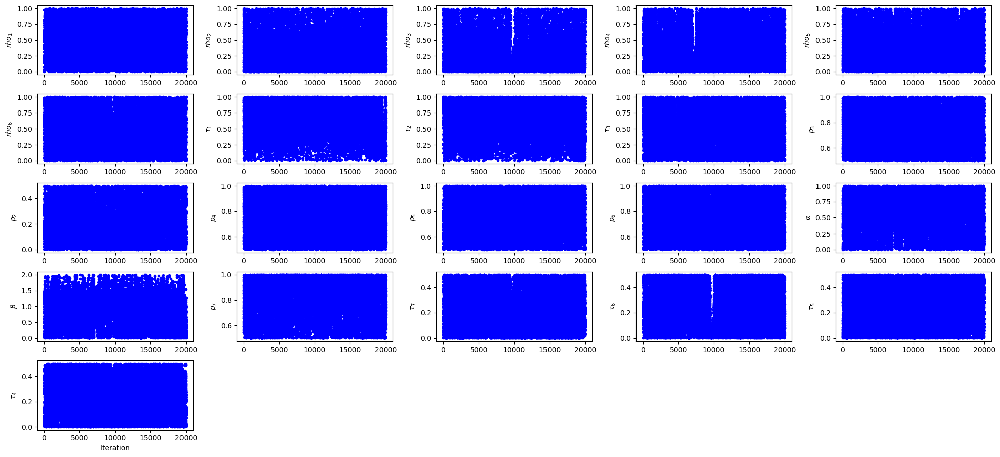

In [70]:
plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
plt.figure(facecolor="white")
settings = dict(
    fig=dict(figsize=(20, 10))
)
# Later make this authomatic!!!
NamesParamsParallelChains = [r'$rho_1$',r'$rho_2$',r'$rho_3$',r'$rho_4$',r'$rho_5$',r'$rho_6$',
                             r'$\tau_1$',r'$\tau_2$',r'$\tau_3$',r'$p_3$',r'$p_2$',r'$p_4$', r'$p_5$',r'$p_6$',r'$\alpha$',
                             r'$\beta$',r'$p_7$',r'$\tau_7$',r'$\tau_{6}$',
                             r'$\tau_{5}$',r'$\tau_{4}$']

mcp.plot_chain_panel(ConcatenatedExtractedChains,NamesParamsParallelChains, settings,maxpoints=1000000)
plt.savefig('./Results_Austria/Austria_Parallel8CutChains_1D_1stWave.png')
# One can save the figure directly on computer as a pdf (or any other format), just uncomment the following
# pdf quality is better, but reduce the number of points in plot (maxpoints above) 
# otherwise too heavy and slow to visualize!!!
# plt.savefig('./Results/MCMC_2ndWave/Chains_1D_2ndWave_2ndWave.pdf')

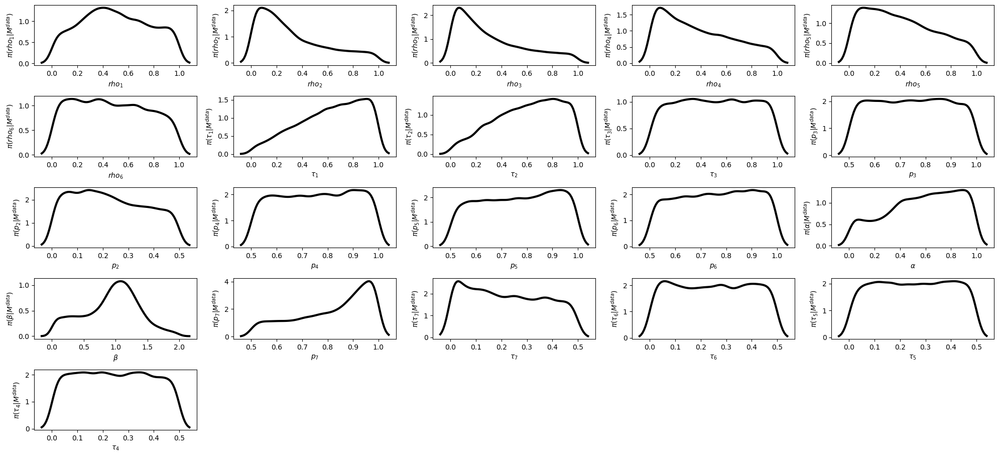

In [71]:
mcp.plot_density_panel(ConcatenatedExtractedChains,NamesParamsParallelChains, settings)
plt.savefig('./Results_Austria/Austria_Parallel8CutChains_Posteriors_1D_1stWave'+FileFormatOfFigures)

In [72]:
# We here need to define once and for all the function to make the nice colorful plot 
# of 2D posterior densities for all paramerters with blue and red colormap

# IF TOO SLOW, REDUCE THE NUMBER OF BINS, nbins = 20 IS ENOUGH AND GOES FASTER
# IF YOU WANT MORE RESOLUTION (NOT NEEDED), INCREASE THE NUMBER OF BINS, e.g. nbins = 50, NEGLIGIBLE IMPROVEMENT BUT SLOWER

def PlotDensityPosteriorWithContours(axes,My_chain,i,j): # ,MyNLevels):
    
    from scipy.stats import kde

    nbins = 30 # This can be changed to make more smooth or more granular densities
    # Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
    data = My_chain[:,[j,i]]
    x, y = data.T
    k = kde.gaussian_kde(data.T)
    xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))
    # Added to make Credible Intervals
    zi_Norm=zi/sum(zi)
    # Order zis
    zi_Norm_Sorted_Reverted = sorted(zi_Norm, reverse=True)
    # sum them up in decreasing order
    IntegralOverPosterior = 0
    CounterContours = 0
    for ThisZi in zi_Norm_Sorted_Reverted:
        IntegralOverPosterior = IntegralOverPosterior + ThisZi
        if CounterContours == 0 and IntegralOverPosterior >= 0.25: # 25%
            ContourValue25 = ThisZi
            CounterContours = 1
        elif CounterContours == 1 and IntegralOverPosterior >= 0.5: # 50%
            ContourValue50 = ThisZi
            CounterContours = 2
        elif CounterContours == 2 and IntegralOverPosterior >= 0.90: # 90%
            ContourValue90 = ThisZi
            CounterContours = 3
    
    im = axes[i,j].pcolormesh(xi, yi, zi_Norm.reshape(xi.shape), shading='gouraud', cmap='coolwarm')
    im = axes[i,j].contour(xi, yi, zi_Norm.reshape(xi.shape), colors='k',levels=[ContourValue90,ContourValue50,ContourValue25]) # MyNLevels
 
    
def Plot_Multiple_2D_Densities(My_chain,My_names,FileNameForSaving):
    
    MyMarkersSize = 16

    NumberOfParameters = len(My_names)
        
    plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
    plt.figure(facecolor="white")
    
    fig, axes = plt.subplots(nrows=NumberOfParameters, ncols=NumberOfParameters, subplot_kw=dict(facecolor='white'))
    
    for ax in axes.flat:
        # Hide all ticks and labels
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        # Set up ticks only on one side for the "edge" subplots...
        if ax.is_first_col():
            ax.yaxis.set_ticks_position('left')
        if ax.is_last_col():
            ax.yaxis.set_ticks_position('right')
            ax.yaxis.set_label_position('right')
        if ax.is_first_row():
            ax.xaxis.set_ticks_position('top')
            ax.xaxis.set_label_position('top')
        if ax.is_last_row():
            ax.xaxis.set_ticks_position('bottom')
    
    ListOfParametersNamesForLegend = My_names
    # NLevels = 3 # Number of (black) Contour Lines in each plot
    
    for i in range(NumberOfParameters):
        for j in range(NumberOfParameters):
            DotSize = 1#14
            if i>j:
                if (i % 2) != 0:
                    if (j % 2) != 0:
                        # im = axes[i,j].scatter(My_chain[:,j], My_chain[:,i])#, s=DotSize, c='b', edgecolor = '')#, cmap=plt.cm.rainbow_r)
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
                elif (i % 2) == 0:
                    if  (j % 2) == 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
            elif i<j:
                if (i % 2) != 0:
                    if (j % 2) == 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
                elif (i % 2) == 0:
                    if (j % 2) != 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
            elif i==j:
                # Label the diagonal subplots...
                axes[i,j].annotate(ListOfParametersNamesForLegend[i].split(" ", 1)[0], (0.5, 0.5), xycoords='axes fraction', ha='center', va='center',size=MyMarkersSize)
                #axes[i,j].scatter(ListOfOutputArrays[2+i], ListOfOutputArrays[0], s=8)               
    
            axes[i,j].set_xlim(min(My_chain[:,j]),max(My_chain[:,j]))
            axes[i,j].set_ylim(min(My_chain[:,i]),max(My_chain[:,i]))
            plt.setp(axes[i,j].get_xticklabels(), rotation=45, horizontalalignment='left')

    #cbar = fig.colorbar(im,ax=axes.ravel().tolist())
    #cbar.set_label('Marginal Posterior Probability')
    
    for k in range(round(NumberOfParameters/2)):
    
        axes[NumberOfParameters-1,2*k].xaxis.set_visible(True)
        axes[NumberOfParameters-1,2*k].locator_params(axis='x',nbins=5)
        plt.setp(axes[NumberOfParameters-1,2*k].get_xticklabels(), rotation=45, horizontalalignment='right')
        axes[NumberOfParameters-1,2*k].set_xlabel(ListOfParametersNamesForLegend[2*k],size=MyMarkersSize)
        axes[NumberOfParameters-1,2*k].get_xaxis().set_tick_params(direction='out')
    
        axes[2*k,0].yaxis.set_visible(True)
        axes[2*k,0].locator_params(axis='y',nbins=5)
        axes[2*k,0].set_ylabel(ListOfParametersNamesForLegend[2*k],size=MyMarkersSize)
        axes[2*k,0].get_yaxis().set_tick_params(direction='out')

    Remaining = NumberOfParameters % 2 
    
    if Remaining > 0: # then NumberOfParameters was an odd number
        
        for k in range(round(NumberOfParameters/2)-1):

            axes[0,2*k+1].xaxis.set_visible(True)
            axes[0,2*k+1].locator_params(axis='x',nbins=5)
            plt.setp(axes[0,2*k+1].get_xticklabels(), rotation=45, horizontalalignment='left')
            axes[0,2*k+1].set_xlabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[0,2*k+1].get_xaxis().set_tick_params(direction='out')

            axes[2*k+1,NumberOfParameters-1].yaxis.set_visible(True)
            axes[2*k+1,NumberOfParameters-1].locator_params(axis='y',nbins=5)
            axes[2*k+1,NumberOfParameters-1].set_ylabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[2*k+1,NumberOfParameters-1].get_yaxis().set_tick_params(direction='out')

    elif Remaining == 0: # then NumberOfParameters was an odd number

        for k in range(round(NumberOfParameters/2)):

            axes[0,2*k+1].xaxis.set_visible(True)
            axes[0,2*k+1].locator_params(axis='x',nbins=5)
            plt.setp(axes[0,2*k+1].get_xticklabels(), rotation=45, horizontalalignment='left')
            axes[0,2*k+1].set_xlabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[0,2*k+1].get_xaxis().set_tick_params(direction='out')

            axes[2*k+1,NumberOfParameters-1].yaxis.set_visible(True)
            axes[2*k+1,NumberOfParameters-1].locator_params(axis='y',nbins=5)
            axes[2*k+1,NumberOfParameters-1].set_ylabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[2*k+1,NumberOfParameters-1].get_yaxis().set_tick_params(direction='out')
    
    fig.set_figheight(25)
    fig.set_figwidth(25)
    plt.subplots_adjust(wspace=0, hspace=0)
               
    fig.savefig(FileNameForSaving)

    plt.show()
    

<Figure size 640x480 with 0 Axes>

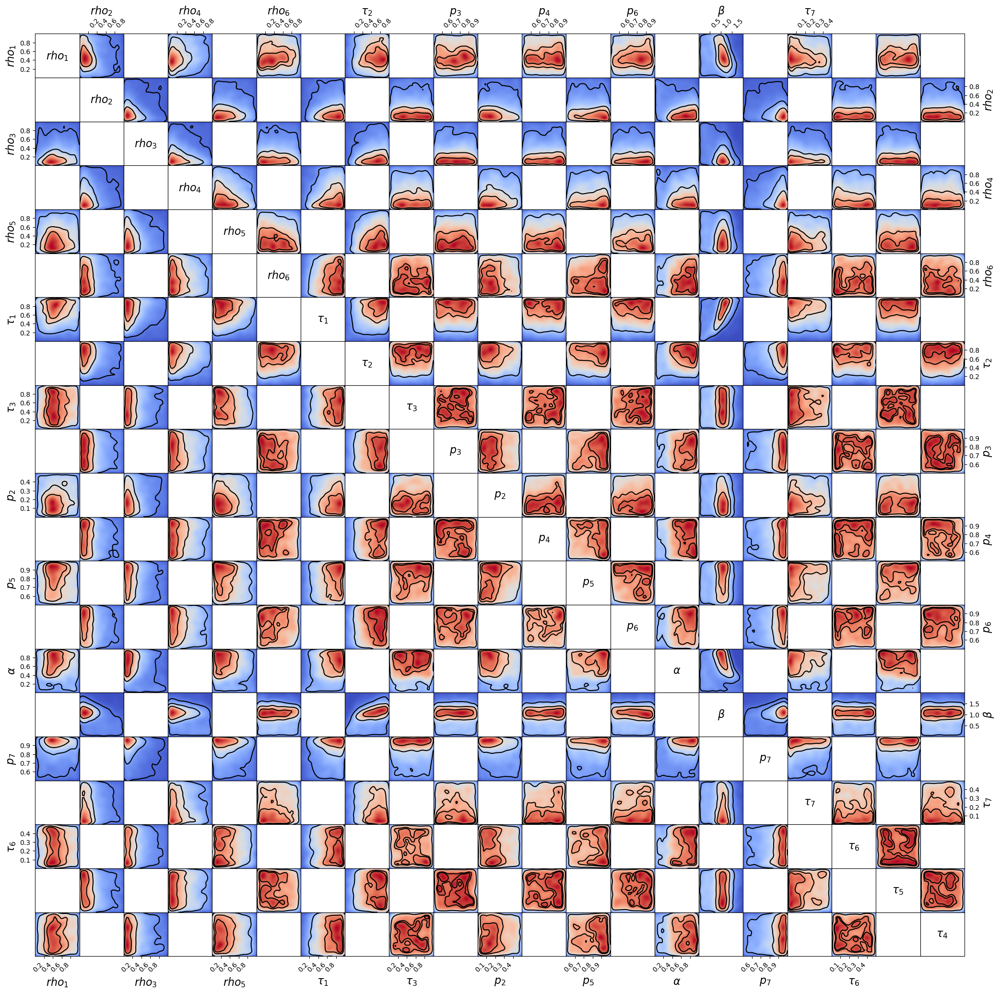

In [73]:
Plot_Multiple_2D_Densities(ConcatenatedExtractedChains, NamesParamsParallelChains, 
                           FileNameForSaving='./Results_Austria/Austria_Parallel8CutChains_Posteriors_2D_1stWave' + FileFormatOfFigures)

In [28]:
# SO LET'S PLOT ONLY A SUBSET OF THESE MULTIPLE CHAINS

if np.shape(chains)[1] <= 10000:
    OneStepEveryNinChains = 1
elif np.shape(chains)[1] > 10000 and np.shape(chains)[1] <= 100000:
    OneStepEveryNinChains = 10
elif np.shape(chains)[1] >= 100000:
    OneStepEveryNinChains = 100
    
Indexes1OutOf100_For2000000 = np.arange(0,8*np.shape(chains)[1],OneStepEveryNinChains) # np.arange(0,4000,1) # np.linspace(0,2000000,20001)[0:-1]
Indexes1OutOf100_For2000000 = Indexes1OutOf100_For2000000.astype(int)

combined_chains_CUT = combined_chains[Indexes1OutOf100_For2000000,:]
index = np.array(index)
index_CUT = index[Indexes1OutOf100_For2000000]

plt.savefig('./Results_Austria/ParallelChainsDensityPlots_1stWave_Luxembourg.png')

<Figure size 640x480 with 0 Axes>

In [ ]:
# VERY COOL, BUT CAN TAKE LONG TO RUN...!!!
# PLOT ONLY IF YOU CAN WAIT ONE HOUR!!!

# Please remember that this is an inbuilt function from pymcmcstat so no need to define anything above

settings = dict(
    pairgrid=dict(height=3.75, hue='index', despine=False),
    ld_type=sns.kdeplot,
    ld=dict(n_levels=5, shade=True, shade_lowest=False),
    md=dict(lw=3))
sns.set_context('talk')
fpg = mcp.plot_paired_density_matrix(
    chains=combined_chains_CUT,
    settings=settings,
    index=index_CUT)
tmp = fpg.add_legend()

In [47]:
##############################
### PARALLEL MCMC 2nd WAVE ###
##############################

In [56]:
# initialize MCMC object
MyNew_mcstat_2ndWave = MCMC(rngseed=123456789)

# initialize data structure 
MyNew_mcstat_2ndWave.data.add_data_set(x=df2['Date'],y=data1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho7', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho8', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho9', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho10', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho11', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho12', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho13', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho14', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho15', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho16', minimum=0, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau3prim', minimum=0, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p3prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p2prim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p4prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p5prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p6prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p7prim', minimum=0.5, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau7prim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau6prim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau6dieprim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau5prim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau5dieprim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau4sprim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau4dieprim', minimum=0, maximum=0.5)

# Define options
datestr = datetime.now().strftime('%Y%m%d_%H%M%S')
savedir = 'Saved_MCMC_Chains' + os.sep + str('{}_{}'.format(datestr, 'parallel_chains'))
MyNew_mcstat_2ndWave.simulation_options.define_simulation_options(nsimu=int(500e3), updatesigma=True, method='dram',
                                                         savedir=savedir, savesize=10000, save_to_json=True,
                                                          save_lightly=True, save_to_bin=True)
MyNew_mcstat_2ndWave.model_settings.define_model_settings(sos_function=errorxy12_2ndWave)


In [57]:
My_Parallel_MCMC_2ndWave = ParallelMCMC()
My_Parallel_MCMC_2ndWave.setup_parallel_simulation(MyNew_mcstat_2ndWave, initial_values=None, num_cores=8, num_chain=8)

In [ ]:
# DO NOT RE-RUN THIS UNLESS YOU WISH A NEW MCMC CHAIN (CAN TAKE 8 HOURS WITH 500000 ITERATIONS)
My_Parallel_MCMC_2ndWave.run_parallel_simulation()

Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_0Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_1Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_2Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_3
Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_5Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_4Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_6




Processing: Saved_MCMC_Chains/20201220_113212_parallel_chains/chain_7

Sampling these parameters:

In [40]:
My_Parallel_MCMC_2ndWave.display_individual_chain_statistics()


****************************************
Displaying results for chain 0
Files: Saved_MCMC_Chains/20201123_125008_parallel_chains/chain_0


------------------------------
name      :       mean        std     MC_err        tau     geweke
rho7      :     0.6309     0.0750     0.0234     5.6402     0.7240
rho8      :     0.6738     0.0631     0.0195    10.2999     0.6873
rho9      :     0.5173     0.0409     0.0122    13.2811     0.8946
rho10     :     0.4132     0.2656     0.0872    12.6282     0.0970
rho11     :     0.2039     0.0274     0.0086     7.9441     0.5992
rho12     :     0.5631     0.1717     0.0556    11.3451     0.3844
rho13     :     0.8716     0.0838     0.0243    11.1504     0.9440
rho14     :     0.1629     0.0149     0.0046    11.9649     0.7883
rho15     :     0.6913     0.0423     0.0118     6.1161     0.8926
tau3prim  :     0.7568     0.0560     0.0165    10.9575     0.8024
p3prim    :     0.8763     0.0858     0.0250     8.3438     0.8819
p2prim    :     0.4091   

In [51]:
DirectoryOfPreviousRunMCMC = 'Saved_MCMC_Chains/20201220_113212_parallel_chains'#20201123_125249_parallel_chains_2ndWave' # 8 chains, 500k each, narrower p par space

pres_2ndWave = CP.load_parallel_simulation_results(DirectoryOfPreviousRunMCMC)
combined_chains_2ndWave, index_2ndWave = CP.generate_combined_chain_with_index(pres_2ndWave)

print(np.shape(combined_chains_2ndWave))

(400, 21)


In [52]:
# NOW COMPUTE AN INDICATOR TO SEE IF THE MULTIPLE CHAINS HAVE CONVERGED TO THE SAME TARGET POSTERIOR DISTRIBUTION 
# OR IF YOU NEED LONGER CHAINS

# Gelman-Rubin Diagnostic (https://github.com/prmiles/pymcmcstat_examples/blob/master/Running_Parallel_Chains.ipynb)

chains_2ndWave = CP.generate_chain_list(pres_2ndWave)
psrf_2ndWave = CS.gelman_rubin(chains=chains_2ndWave, display=True)

# In general, R closer to 1 indicates your chains have converged.

Parameter: $p_{0}$
  R = 8.644387016938538
  B = 5.000142625206068
  W = 0.00152556183886229
  V = 0.11399825966922156
  neff = 9.119600636553717
Parameter: $p_{1}$
  R = 5.1888814072948115
  B = 3.290212405950527
  W = 0.0028533911591611463
  V = 0.07682610246986478
  neff = 9.339956573128303
Parameter: $p_{2}$
  R = 7.268496735794772
  B = 3.5656144090512174
  W = 0.0015472460490583164
  V = 0.08174262533172955
  neff = 9.17010264758052
Parameter: $p_{3}$
  R = 3.875634454450461
  B = 3.59636574729885
  W = 0.0057631839901634094
  V = 0.08656614962458425
  neff = 9.62818085892428
Parameter: $p_{4}$
  R = 5.238677390533734
  B = 1.4049851799824569
  W = 0.0011945464092177577
  V = 0.03278282203063868
  neff = 9.333286214747979
Parameter: $p_{5}$
  R = 3.7991567426182096
  B = 3.7378379170540272
  W = 0.006251219259149283
  V = 0.09022754800768192
  neff = 9.655587000818342
Parameter: $p_{6}$
  R = 4.487617641569776
  B = 2.8548136387054757
  W = 0.003352694405861015
  V = 0.0675189473

In [53]:
print(np.shape(chains_2ndWave))

## Prepare indexes to cut chains, only 1 point every 100

### CHANGE THE ABOVE WHEN YOU RUN A LONGER CHAIN!!! ###

if np.shape(chains_2ndWave)[1] <= 10000:
    OneStepEveryNinChains = 1
elif np.shape(chains_2ndWave)[1] > 10000 and np.shape(chains_2ndWave)[1] <= 100000:
    OneStepEveryNinChains = 10
elif np.shape(chains_2ndWave)[1] >= 100000:
    OneStepEveryNinChains = 100

Indexes1OutOf100 = np.arange(0,np.shape(chains_2ndWave)[1],OneStepEveryNinChains) 
Indexes1OutOf100 = Indexes1OutOf100.astype(int)

print(np.shape(chains_2ndWave[0][Indexes1OutOf100,:]))

# Cut chains and concatenate them
MyChain_2ndWave = chains_2ndWave[0][Indexes1OutOf100,:]
#MyChain_2ndWave = chains_2ndWave[0][:,:]
#MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[100::,:]
MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[:,:]
ConcatenatedExtractedChains_2ndWave = MyChain_BurninRemoved_2ndWave
print(np.shape(ConcatenatedExtractedChains_2ndWave))
for i in range(7):
    # Take out first 10000 of each chain i.e. 100 of the points left) for burnin
    MyChain_2ndWave = chains_2ndWave[i+1][Indexes1OutOf100,:]
    #MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[100::,:]
    #MyChain_2ndWave = chains_2ndWave[i+1][:,:]
    MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[:,:]
    
    # Than concatenate
    ConcatenatedExtractedChains_2ndWave = np.concatenate((ConcatenatedExtractedChains_2ndWave,MyChain_BurninRemoved_2ndWave),axis=0)
print(np.shape(ConcatenatedExtractedChains_2ndWave))


(8, 50, 21)
(50, 21)
(50, 21)
(400, 21)


<Figure size 640x480 with 0 Axes>

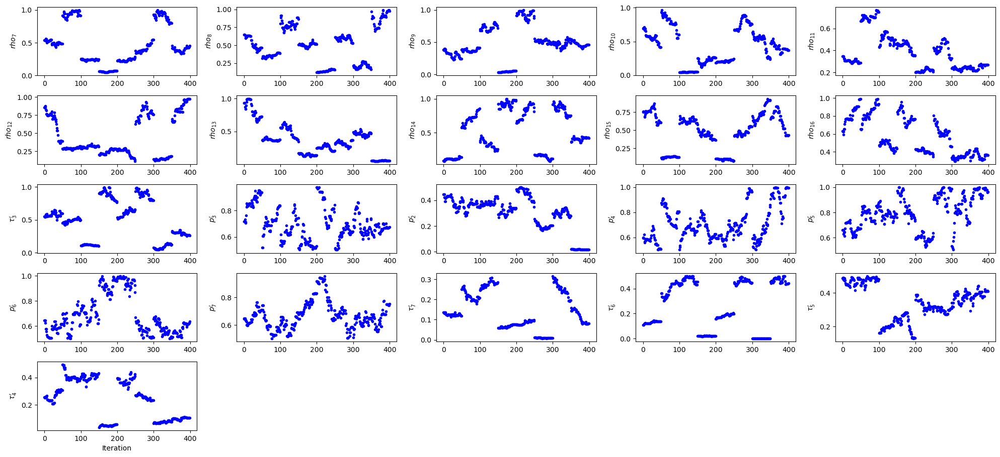

In [54]:
plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
plt.figure(facecolor="white")
settings = dict(
    fig=dict(figsize=(20, 10))
)
# Later make this authomatic!!!
NamesParamsParallelChains_2ndWave =[r'$rho_7$',r'$rho_8$',r'$rho_9$',r'$rho_{10}$',
                                    r'$rho_{11}$',r'$rho_{12}$',r'$rho_{13}$',r'$rho_{14}$',r'$rho_{15}$','$rho_{16}$',
                                    r"$\tau_3'$",r"$p_3'$",r"$p_2'$",r"$p_4'$",r"$p_5'$",
                                    r"$p_6'$",r"$p_7'$",r"$\tau_7'$",r"$\tau_{6}'$",
                                    r"$\tau_{5}'$",r"$\tau_{4}'$"]
    
mcp.plot_chain_panel(ConcatenatedExtractedChains_2ndWave,NamesParamsParallelChains_2ndWave, settings,maxpoints=2000000)
plt.savefig('./Results_Austria/Austria_Parallel8CutChains_1D_2ndWave.png')
# One can save the figure directly on computer as a pdf (or any other format), just uncomment the following
# pdf quality is better, but reduce the number of points in plot (maxpoints above) 
# otherwise too heavy and slow to visualize!!!
# plt.savefig('./Results/MCMC_2ndWave/Chains_1D_2ndWave_2ndWave.pdf')

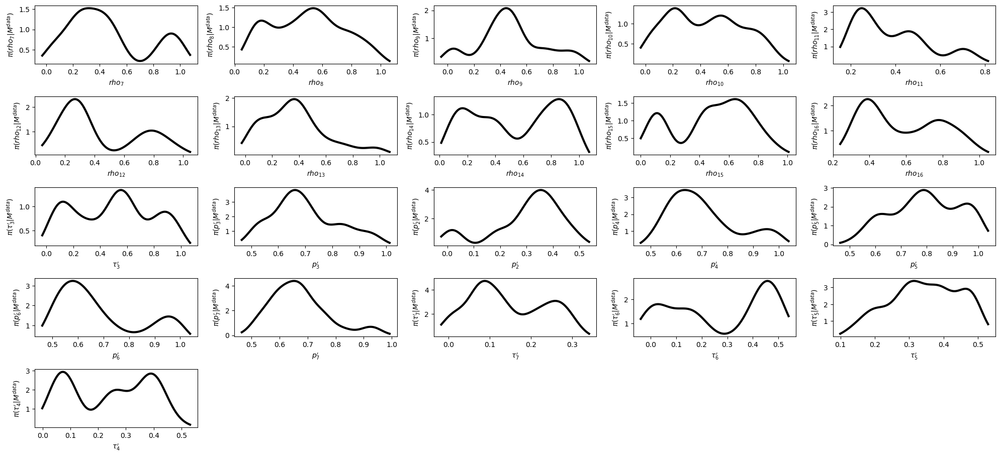

In [55]:
mcp.plot_density_panel(ConcatenatedExtractedChains_2ndWave,NamesParamsParallelChains_2ndWave, settings)
plt.savefig('./Results_Austria/Austria_Parallel8CutChains_Posteriors_1D_2ndWave'+FileFormatOfFigures)

<Figure size 640x480 with 0 Axes>

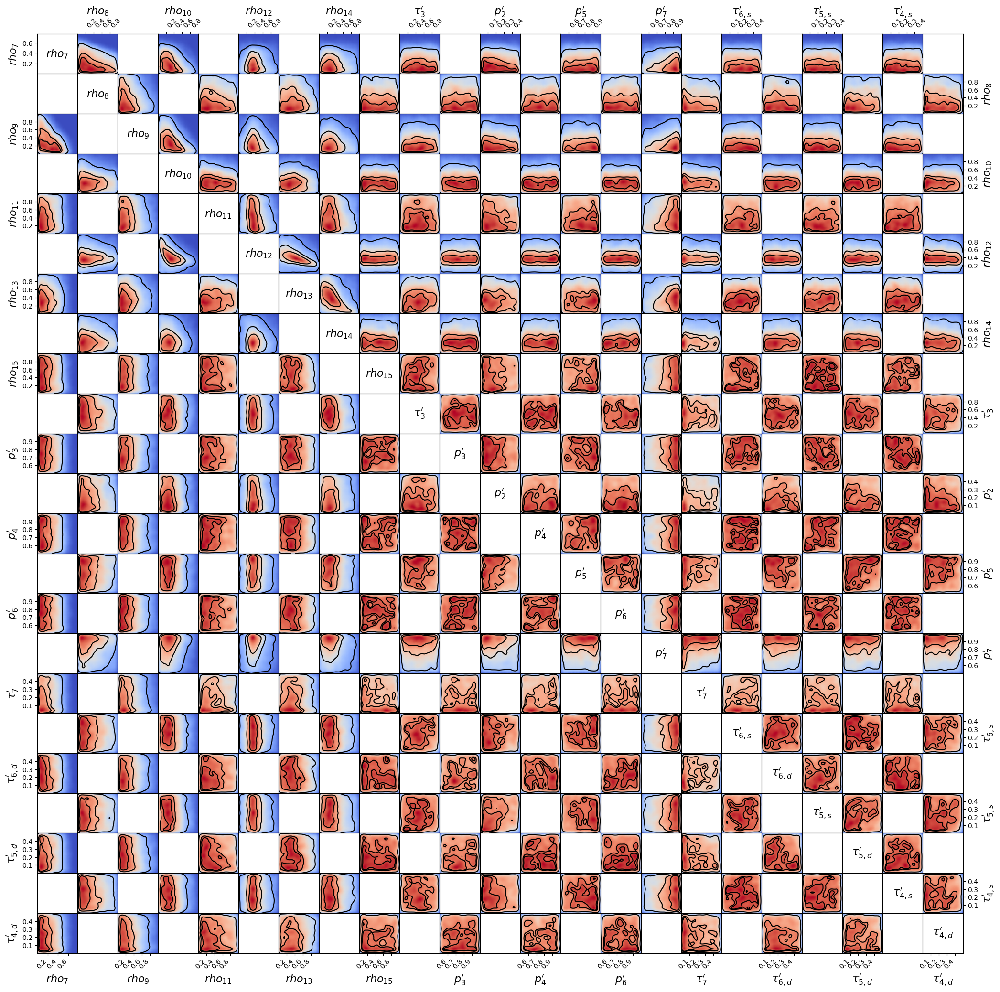

In [77]:
Plot_Multiple_2D_Densities(ConcatenatedExtractedChains_2ndWave, NamesParamsParallelChains_2ndWave, 
                           FileNameForSaving='./Results_Austria/Austria_Parallel8CutChains_Posteriors_2D_2ndWave' + FileFormatOfFigures)

In [33]:
# SO LET'S PLOT ONLY A SUBSET OF THESE MULTIPLE CHAINS

combined_chains_CUT_2ndWave = combined_chains_2ndWave[Indexes1OutOf100_For2000000,:]
index_2ndWave = np.array(index_2ndWave)
index_CUT_2ndWave = index_2ndWave[Indexes1OutOf100_For2000000]

In [ ]:
# VERY COOL, BUT CAN TAKE LONG TO RUN...!!! PERHAPS TOO LONG ACTUALLY... :P
# PLOT ONLY IF YOU CAN WAIT HALF AN HOUR!!!

settings = dict(
    pairgrid=dict(height=3.75, hue='index', despine=False),
    ld_type=sns.kdeplot,
    ld=dict(n_levels=5, shade=True, shade_lowest=False),
    md=dict(lw=3))
sns.set_context('talk')
fpg = mcp.plot_paired_density_matrix(
    chains=combined_chains_CUT_2ndWave,
    settings=settings,
    index=index_CUT_2ndWave)
tmp = fpg.add_legend()

plt.savefig('./Results_Austria/ParallelChainsDensityPlots_2ndWave_Luxembourg.png')

In [55]:

###################################################
### PLOT RHOs FROM MCMC WITH CREDIBLE INTERVALS ###
###################################################


Computing max of posteriors for each given parameter...
0.4003521118654874
0.12506938112034724
0.0634236023270498
0.09658760370418276
0.08765852985679803
0.06671804653073543
Computing max of posteriors for each given parameter...
0.05191552212626658
0.09205482108086288
0.08435432515835473
0.2653935758185703
0.11957787280506843
0.3508567322046801
0.28252824215731637
0.26933112700940376
0.099809168046707


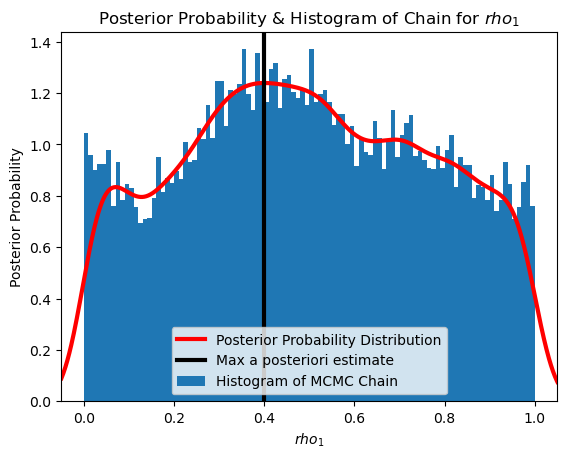

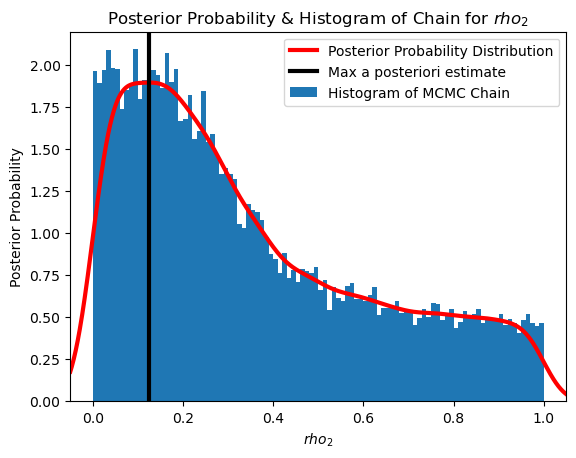

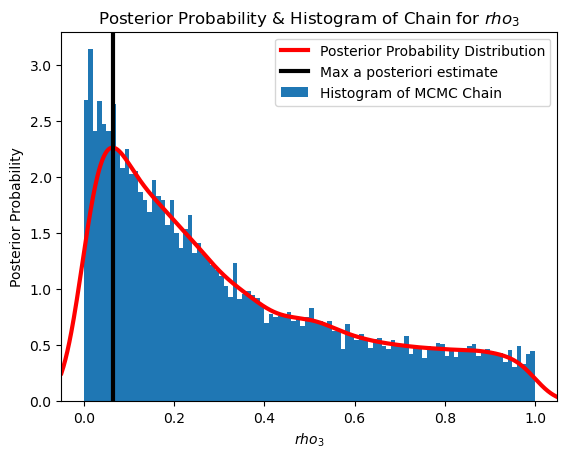

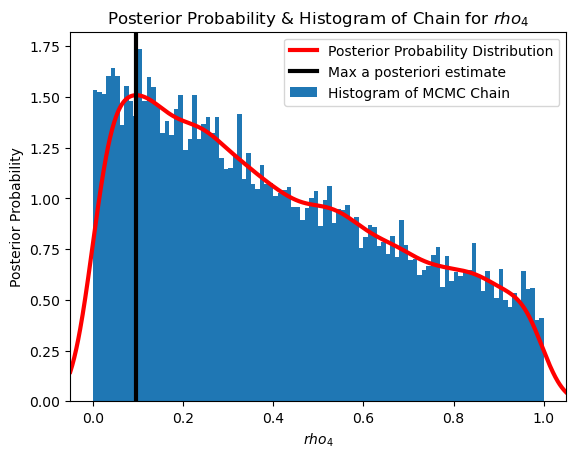

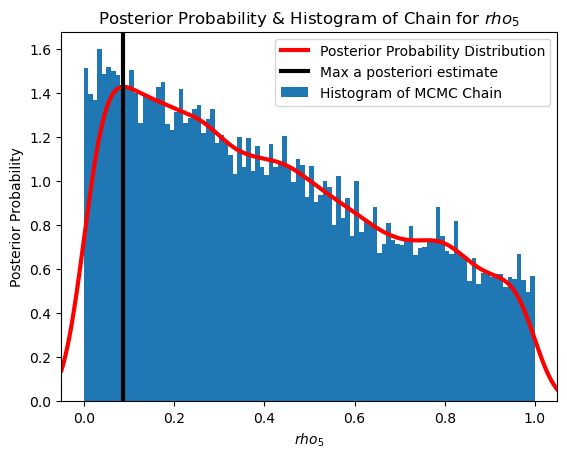

...

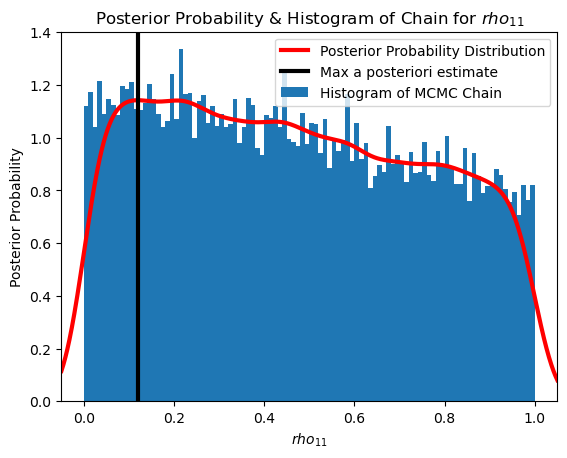

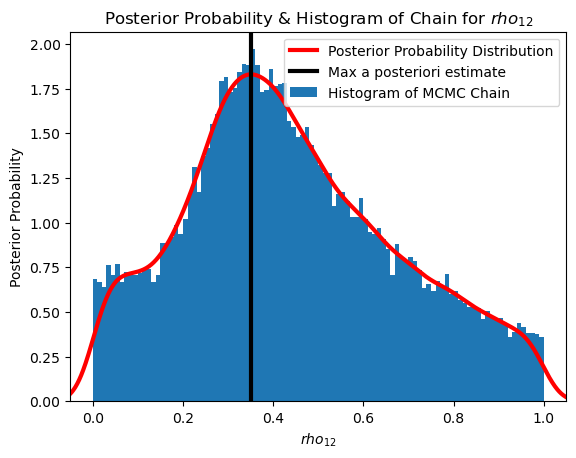

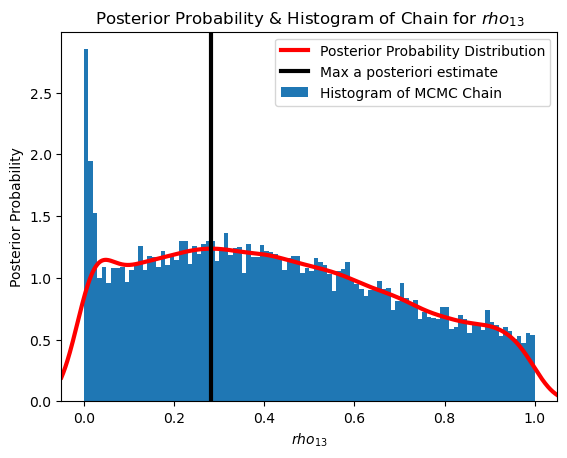

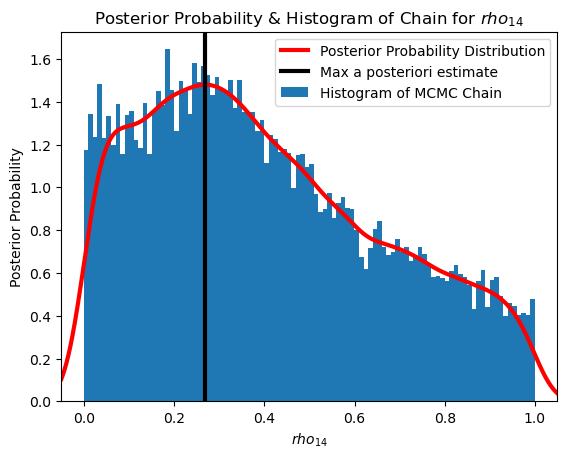

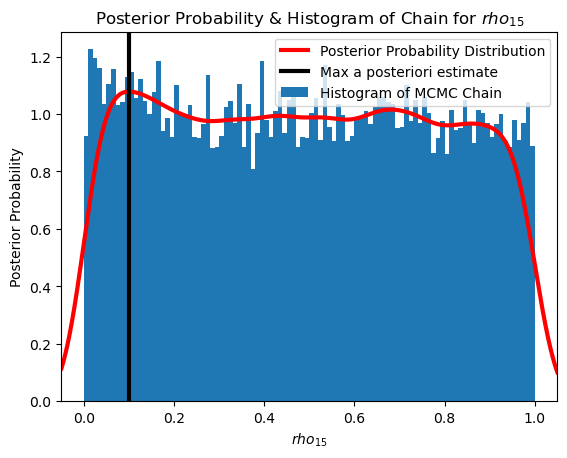

In [81]:
######################################################################
##### LET'S GET MEAN VALUES OF RHOS FROM POSTERIOR DISTRIBUTIONS #####
######################################################################

def GetMeansPosteriorSelectedParams(ListOfRhosNames,Chains,Names):
    ListOfRhos_MCMC_Mean_ThisWave = []
    for name_this_rho in ListOfRhosNames:
        Index_this_rho = Names.index(name_this_rho)
        Chain_this_rho = Chains[:,Index_this_rho]
        Mean_this_chain = statistics.mean(Chain_this_rho)
        ListOfRhos_MCMC_Mean_ThisWave.append(Mean_this_chain)
    return ListOfRhos_MCMC_Mean_ThisWave
    
ListOfRhosNames_1stWave = [r'$rho_1$',r'$rho_2$',r'$rho_3$',r'$rho_4$',r'$rho_5$',r'$rho_6$']
ListOfRhosNames_2ndWave = ['$rho_7$','$rho_8$','$rho_9$','$rho_{10}$',
                           '$rho_{11}$','$rho_{12}$','$rho_{13}$','$rho_{14}$','$rho_{15}$']

ListOfMeansRhosMCMC_1stWave = GetMeansPosteriorSelectedParams(ListOfRhosNames_1stWave,
                                                              ConcatenatedExtractedChains,
                                                              NamesParamsParallelChains)
ListOfMeansRhosMCMC_2ndWave = GetMeansPosteriorSelectedParams(ListOfRhosNames_2ndWave,
                                                              ConcatenatedExtractedChains_2ndWave,
                                                              NamesParamsParallelChains_2ndWave)
    
# Put here the values of rho coming from Means of MCMC
ListOfRhos_MCMC_MeansPosteriors = [1] + ListOfMeansRhosMCMC_1stWave + ListOfMeansRhosMCMC_2ndWave
# [1,0.5655,0.1973,0.2287,0.1453,0.5082,0.5188,0.3115,0.2229,0.3760,0.3234,0.5433,0.2842]

############################################################################
##### NOW LET'S GET THE MAX VALUES OF DISTRIBUTIONS VIA A GAUSSIAN KDE #####
############################################################################

def PosteriorsWithMaxFromHisto(ListOfRhosNames,Chains,Names):

    ListIndexesOfParams = []
    for name_this_rho in ListOfRhosNames:
        Index_this_rho = Names.index(name_this_rho)
        ListIndexesOfParams.append(Index_this_rho)
    
    ListOfMaxPosteriorsValues = []
    ListOfKDEs = []
    ListOfPosteriorValuesOnGrid = []
    ListOfGrids = []
    
    print("Computing max of posteriors for each given parameter...")
    for i in ListIndexesOfParams:
        plt.figure(facecolor="white")
        plt.hist(Chains[:,i], density=True, bins=100, label="Histogram of MCMC Chain")
        mn, mx = plt.xlim()
        plt.xlim(mn, mx)
        kde_xs = np.linspace(mn, mx, 1000)
        kde = st.gaussian_kde(Chains[:,i])
        plt.plot(kde_xs,kde.pdf(kde_xs),label="Posterior Probability Distribution",linewidth=3,color='red')
        plt.ylabel('Posterior Probability')
        plt.xlabel(Names[i])
        plt.title("Posterior Probability & Histogram of Chain for " + str(Names[i]));
        posterior=list(kde.pdf(kde_xs))
        a=posterior.index(max(posterior))
        plt.axvline(x=kde_xs[a],linewidth=3,color='black',label='Max a posteriori estimate')
        plt.legend(loc="best")
        print(kde_xs[a])
        ListOfMaxPosteriorsValues.append(kde_xs[a])
        ListOfKDEs.append(kde)
        ListOfPosteriorValuesOnGrid.append(posterior)
        ListOfGrids.append(kde_xs)

    return ListOfMaxPosteriorsValues, ListOfKDEs, ListOfPosteriorValuesOnGrid, ListOfGrids

ListOfMaxPosteriorsValues_1stWave, ListOfKDEs_1stWave,ListOfPosteriorValuesOnGrid_1stWave, ListOfGrids_1stWave = PosteriorsWithMaxFromHisto(ListOfRhosNames_1stWave,
                                                                                   ConcatenatedExtractedChains,
                                                                                   NamesParamsParallelChains)
ListOfMaxPosteriorsValues_2ndWave, ListOfKDEs_2ndWave,ListOfPosteriorValuesOnGrid_2ndWave, ListOfGrids_2ndWave = PosteriorsWithMaxFromHisto(ListOfRhosNames_2ndWave,
                                                                                   ConcatenatedExtractedChains_2ndWave,
                                                                                   NamesParamsParallelChains_2ndWave)

# Put here the values of rho coming from Max of MCMC Posterior
ListOfRhos_MCMC_MaxsPosterior = [1] + ListOfMaxPosteriorsValues_1stWave + ListOfMaxPosteriorsValues_2ndWave




In [82]:

#############################################################
#####  NOW LET'S GET THE 50% and 90% CONFIDENCE BANDS   #####
#############################################################

    # IF TOO SLOW, REDUCE THE NUMBER OF Y VALUES FROM 1000 TO 200 OR 100 OR SO, 
    # IT IS GOING TO BE SLIGHTLY LESS PRECISE BUT MUCH FASTER

def ExtractConfidenceIntervalsFromPosteriors(ListOfGrids, ListOfPosteriorValuesOnGrid, ListOfKDEs, Names):

    MyListOfRhos_MCMC_Lower50 = []
    MyListOfRhos_MCMC_Upper50 = []
    MyListOfRhos_MCMC_Lower90 = []
    MyListOfRhos_MCMC_Upper90 = []

    for IndexMain in np.arange(len(Names)):
        xGrid = ListOfGrids[IndexMain]
        # Create y grid
        MyPosterior = ListOfPosteriorValuesOnGrid[IndexMain]
        yGrid = np.linspace(max(MyPosterior), 0, 1000)
        Found50Perc = False
        Found90Perc = False
        for this_y in yGrid:
            IndexesOfPeak = [MyPosterior >= this_y]
            XsOfPeak = xGrid[IndexesOfPeak[0]]
            xMin = min(XsOfPeak)
            xMax = max(XsOfPeak)
            Integral = ListOfKDEs[IndexMain].integrate_box_1d(xMin, xMax)
            if Found50Perc == False:
                if Integral >= 0.5:
                    print("50% Interval found!!!")
                    Found50Perc = True
                    xMin_50 = xMin
                    xMax_50 = xMax
            elif Found50Perc == True and Found90Perc == False:
                if Integral >= 0.9:
                    print("90% Interval found!!!")
                    Found90Perc = True
                    xMin_90 = xMin
                    xMax_90 = xMax
                    break      
        print()
        print("Min and Max of parameter " + Names[IndexMain] + " for 50% Confidence Interval are: ")
        print(xMin_50)
        print(xMax_50)
        print("Min and Max of parameter " + Names[IndexMain] + " for 90% Confidence Interval are: ")
        print(xMin_90)
        print(xMax_90)
        print()

        MyListOfRhos_MCMC_Lower50.append(xMin_50)
        MyListOfRhos_MCMC_Upper50.append(xMax_50)
        MyListOfRhos_MCMC_Lower90.append(xMin_90)
        MyListOfRhos_MCMC_Upper90.append(xMax_90)
    
    return MyListOfRhos_MCMC_Lower50, MyListOfRhos_MCMC_Upper50, MyListOfRhos_MCMC_Lower90, MyListOfRhos_MCMC_Upper90

ListOfRhos_MCMC_Lower50_1stWave, ListOfRhos_MCMC_Upper50_1stWave, ListOfRhos_MCMC_Lower90_1stWave, ListOfRhos_MCMC_Upper90_1stWave = ExtractConfidenceIntervalsFromPosteriors(ListOfGrids_1stWave,
ListOfPosteriorValuesOnGrid_1stWave,
ListOfKDEs_1stWave,
ListOfRhosNames_1stWave)

ListOfRhos_MCMC_Lower50_2ndWave, ListOfRhos_MCMC_Upper50_2ndWave, ListOfRhos_MCMC_Lower90_2ndWave, ListOfRhos_MCMC_Upper90_2ndWave = ExtractConfidenceIntervalsFromPosteriors(ListOfGrids_2ndWave,
ListOfPosteriorValuesOnGrid_2ndWave,
ListOfKDEs_2ndWave,
ListOfRhosNames_2ndWave)

ListOfRhos_MCMC_Lower50 = [1] + ListOfRhos_MCMC_Lower50_1stWave + ListOfRhos_MCMC_Lower50_2ndWave
ListOfRhos_MCMC_Upper50 = [1] + ListOfRhos_MCMC_Upper50_1stWave + ListOfRhos_MCMC_Upper50_2ndWave

ListOfRhos_MCMC_Lower90 = [1] + ListOfRhos_MCMC_Lower90_1stWave + ListOfRhos_MCMC_Lower90_2ndWave
ListOfRhos_MCMC_Upper90 = [1] + ListOfRhos_MCMC_Upper90_1stWave + ListOfRhos_MCMC_Upper90_2ndWave

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_1$ for 50% Confidence Interval are: 
0.2528119299251298
0.6943314296123194
Min and Max of parameter $rho_1$ for 90% Confidence Interval are: 
0.043613164487309196
0.9321573945311049

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_2$ for 50% Confidence Interval are: 
0.01606836505707932
0.3089397819543446
Min and Max of parameter $rho_2$ for 90% Confidence Interval are: 
-0.02356836805683628
0.8176111902495949

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_3$ for 50% Confidence Interval are: 
-0.0015165433847484575
0.2758549264351356
Min and Max of parameter $rho_3$ for 90% Confidence Interval are: 
-0.03453695645854418
0.7942754116937285

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_4$ for 50% Confidence Interval are: 
0.019529094354393102
0.39601495432050826
Min and Max of parameter $rho_4$ for 90% Confidence Interval are: 
-

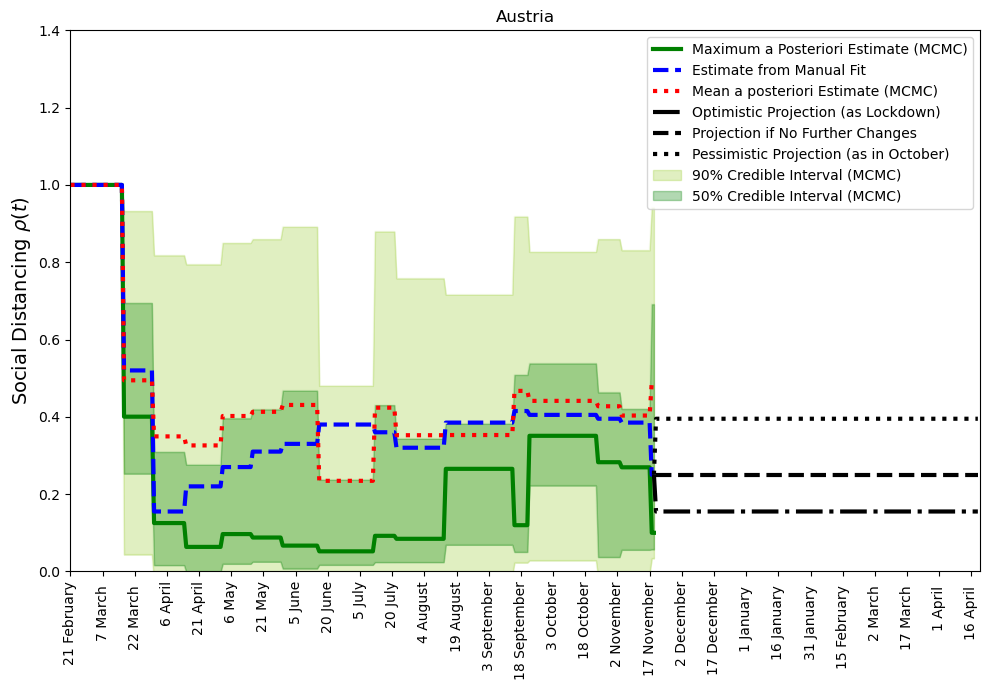

In [84]:
###############################
#####  NOW LET'S PLOT IT  #####
###############################

plt.figure(figsize=(10, 7),facecolor="white")

stop = NumberDaysData # Remember to stop this at the data points used for mcmc

#times=np.arange(0,endofplot+1,1) 
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Upper90)[0:stop],'-',color='yellowgreen', alpha=0.05)#,label='Data')
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Lower90)[0:stop],'-',color='yellowgreen', alpha=0.05)#,label='Data')
plt.fill_between(times[0:stop], rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Upper90)[0:stop], 
                 rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Lower90)[0:stop],color='yellowgreen', alpha=0.3,label=r'90% Credible Interval (MCMC)')
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Upper50)[0:stop],'-',color='green', alpha=0.05)#,label='Data')
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Lower50)[0:stop],'-',color='green', alpha=0.05)#,label='Data')
plt.fill_between(times[0:stop], rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Upper50)[0:stop], 
                 rhoAsFunctionforAustria(times,ListOfRhos_MCMC_Lower50)[0:stop],color='green', alpha=0.3,label='50% Credible Interval (MCMC)')
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_MaxsPosterior)[0:stop],'-',color='green',linewidth=3,label='Maximum a Posteriori Estimate (MCMC)')
ListOfRhosBestFit = ListOfRhos
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhosBestFit)[0:stop],'--',color='blue',linewidth=3,label='Estimate from Manual Fit')
plt.plot(times[0:stop],rhoAsFunctionforAustria(times,ListOfRhos_MCMC_MeansPosteriors)[0:stop],':',color='red',linewidth=3,label='Mean a posteriori Estimate (MCMC)')

ListOptimistic = Rho_BestScenario*np.ones(len(times))[stop:-1]
ListPessimistic = Rho_WorstScenario*np.ones(len(times))[stop:-1]

ListOptimistic = [ListOfRhos[-1]] + list(ListOptimistic)
ListPessimistic = [ListOfRhos[-1]] + list(ListPessimistic)

plt.plot(times[stop-1:-1],ListOptimistic,'-.',color='black',linewidth=3,label='Optimistic Projection (as Lockdown)')
plt.plot(times[stop:-1],rhoAsFunctionforAustria(times,ListOfRhosBestFit)[stop:-1],'--',color='black',linewidth=3,label='Projection if No Further Changes')
plt.plot(times[stop-1:-1],ListPessimistic,':',color='black',linewidth=3,label='Pessimistic Projection (as in October)')

plt.title('Austria')

#locs, labels = plt.xticks()
#times=np.arange(0,endofplot+1,1)
#only10thindex=np.arange(0,endofplot+1,10)
#plt.xticks(times[only10thindex])
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)

#plt.xlabel("Time(days)")
plt.ylabel(r"Social Distancing $\rho\left(t\right)$",size=14)

plt.ylim(0,1.4)
plt.xlim(0,endofplot)

plt.tight_layout()
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.savefig('./Results_Austria/ParallelMCMC_RHOsAllEstimates' + FileFormatOfFigures)

0
0.4003521118654874
0.49442256320221206
[0.2614 0.6968]
[8.3789e-05 8.7768e-01]
1
0.12506938112034724
0.34935100455932316
[0.0008 0.2717]
[3.4770e-06 7.9267e-01]
2
0.0634236023270498
0.3259793004171525
[6.4865e-05 2.4392e-01]
[3.4415e-05 7.7286e-01]
3
0.09658760370418276
0.40209339278561973
[0.0015 0.3586]
[1.6439e-04 8.2262e-01]
4
0.08765852985679803
0.4129706465101483
[3.4562e-04 3.7565e-01]
[1.5872e-04 8.2845e-01]
5
0.06671804653073543
0.43066443503946195
[3.0126e-06 4.0390e-01]
[3.0126e-06 8.5721e-01]
6
0.8661226911765102
0.6190985062196567
[0.6466 0.9982]
[0.2569 1.    ]
7
0.8484825677151471
0.594460306568807
[0.6181 0.9993]
[0.2221 1.    ]
8
0.21887677519336854
0.4974588649238591
[0.1161 0.6027]
[0.0531 0.9415]
9
0.9214919818387389
0.7535831932858342
[0.7542 0.9998]
[0.5456 0.9949]
10
0.05097891420981965
0.2290308770261873
[0.0007 0.2194]
[6.3219e-06 4.3703e-01]
11
0.7992721721399021
0.754986391779103
[0.6959 0.9355]
[0.5538 1.    ]
12
0.9280898871543883
0.7624176648088347
[0.75

/Users/stefano.magni/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


0.3262554867599369
0.256893638260501
[0.2399 0.4786]
[0.0483 0.4937]
21
0.04437382964125407
0.23047953451825054
[1.6713e-04 2.2040e-01]
[1.4913e-04 4.4064e-01]
22
0.39673162608405577
0.2539528005203332
[0.2455 0.4877]
[0.0408 0.4879]
23
0.04381458319059631
0.23480401816334764
[1.1367e-04 2.2827e-01]
[7.9471e-05 4.4118e-01]
0
0.05191552212626658
0.23434924619705913
[0.0005 0.2107]
[3.2621e-05 4.6328e-01]
1
0.09205482108086288
0.4236134856926828
[1.9590e-05 3.8753e-01]
[1.9590e-05 8.4773e-01]
2
0.08435432515835473
0.3523920044484573
[0.0007 0.305 ]
[4.0570e-05 7.3546e-01]
3
0.2653935758185703
0.3528387517554689
[0.0568 0.3664]
[8.2353e-06 6.9219e-01]
4
0.11957787280506843
0.4670945182562173
[0.0022 0.4513]
[0.0017 0.8778]
5
0.3508567322046801
0.4412619839422082
[0.22   0.5305]
[5.1473e-04 7.8803e-01]
6
0.28252824215731637
0.42731571204159224
[0.0005 0.4049]
[2.5754e-06 8.3026e-01]
7
0.26933112700940376
0.40327401206659397
[0.0149 0.3743]
[4.7116e-04 8.0443e-01]
8
0.099809168046707
0.4904

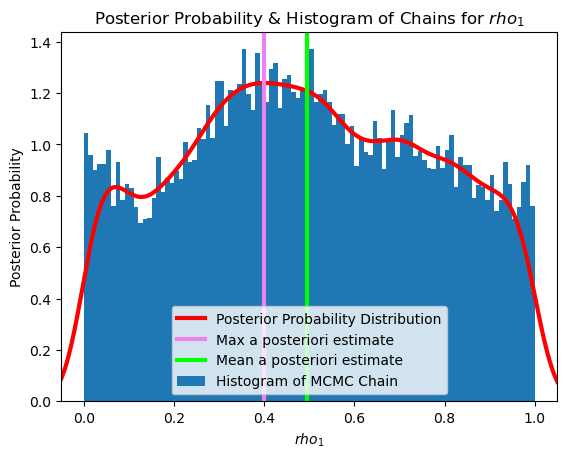

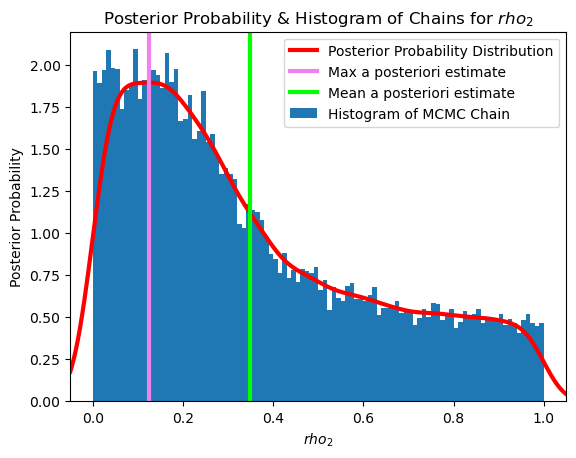

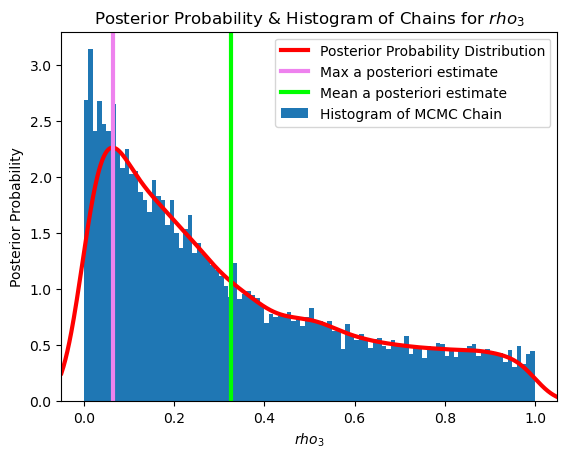

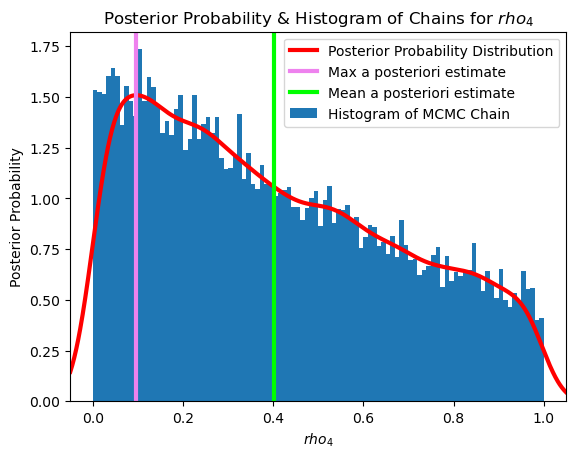

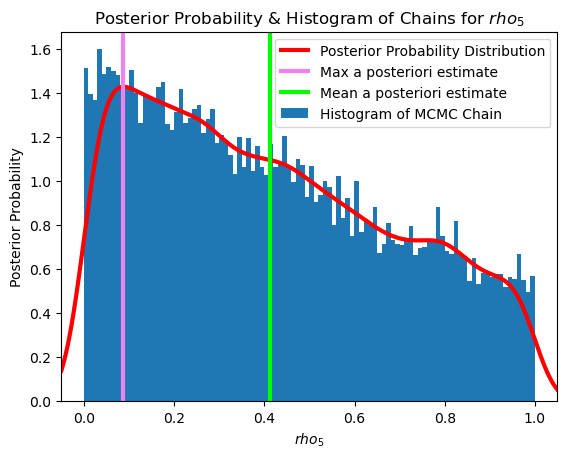

...

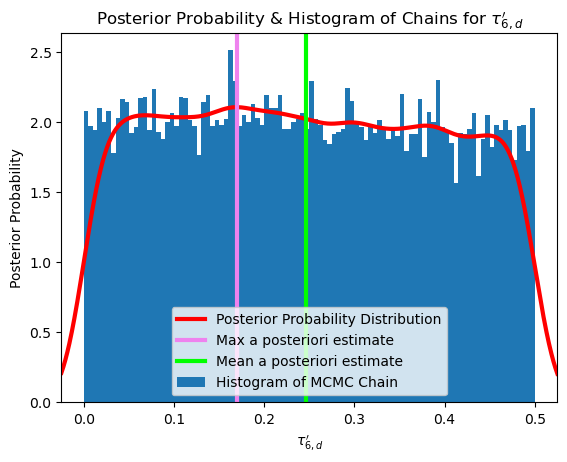

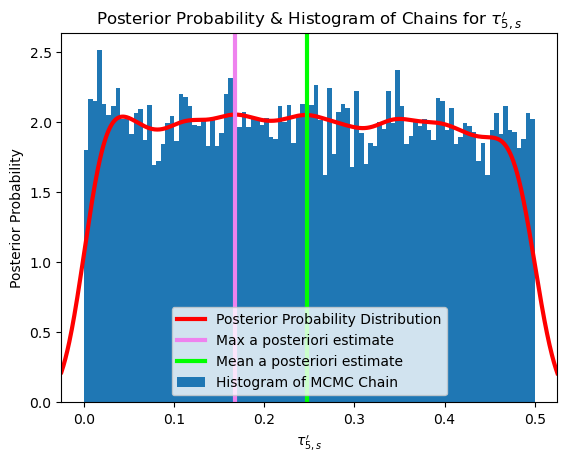

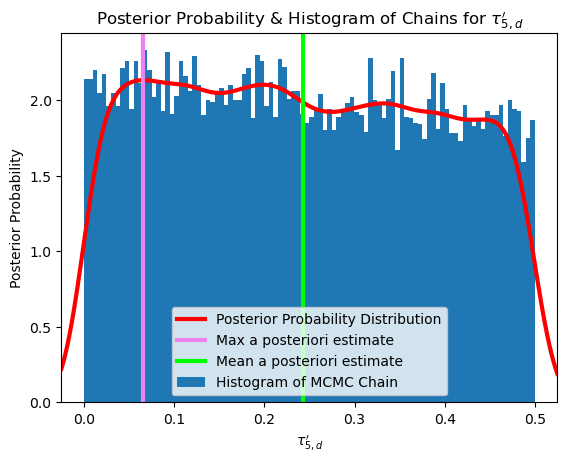

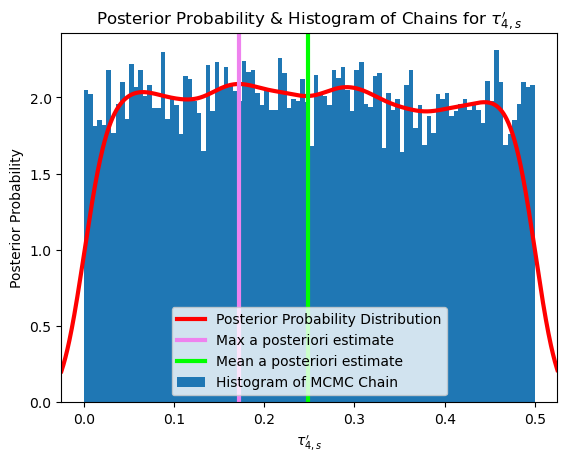

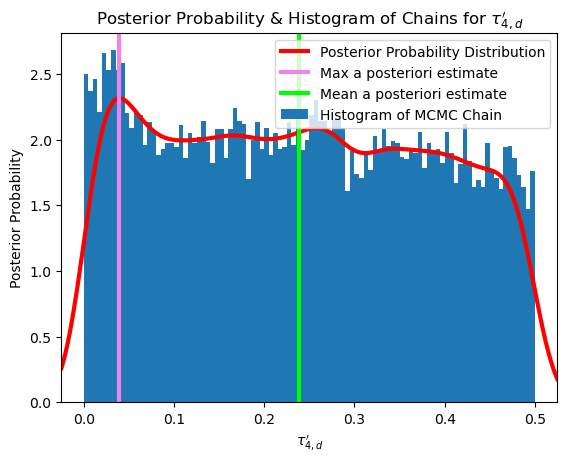

In [34]:
### 6) Plot Posterior Estimates of Parameters

# RUN THIS ONLY IF YOU DO NOT HAVE ALREADY IONSTALLED THE PYMC3 PYTHON PACKAGE
#import sys
#!conda install --yes --prefix {sys.prefix} pymc3

##### Example CREDIBLE INTERVAL 1D #####
#CredibleInterval_50 = pymc3.stats.hpd(MyChain,credible_interval=0.5)### 50% Credible Intervals ###
#CredibleInterval_90 = pymc3.stats.hpd(MyChain,credible_interval=0.9)### 90% Credible Intervals ###
#CredibleInterval_95 = pymc3.stats.hpd(MyChain,credible_interval=0.95)### 95% Credible Intervals ###
#CredibleInterval_99 = pymc3.stats.hpd(MyChain,credible_interval=0.99)### 99% Credible Intervals ###

### 1) Get Chains

AllWavesChains = [ConcatenatedExtractedChains, ConcatenatedExtractedChains_2ndWave]
AllWavesNames = [NamesParamsParallelChains, NamesParamsParallelChains_2ndWave]

ListOfListsOfMaxs = []
ListOfListsMeans = []
ListOfListsCredibleIntervals50 = []
ListOfListsCredibleIntervals90 = []

for i_Wave in [0,1]:

    MyChains = AllWavesChains[i_Wave]
    MyParNames = AllWavesNames[i_Wave]

    ### 2) Get Max and Mean a Posteriori Estimate of each parameter 

    ListOfMaxs = []
    ListOfMeans = []
    ListOfCredibleIntervals50 = []
    ListOfCredibleIntervals90 = []

    for i in np.arange(0,len(MyParNames),1):
        print(i)
        plt.figure(facecolor="white")
        Chains1Par = MyChains[:,i]
        Name1Par = MyParNames[i]

        plt.hist(Chains1Par, density=True, bins=100, label="Histogram of MCMC Chain")

        mn, mx = plt.xlim()
        plt.xlim(mn, mx)
        kde_xs = np.linspace(mn, mx, 1000)
        kde = st.gaussian_kde(Chains1Par)

        plt.plot(kde_xs,kde.pdf(kde_xs),label="Posterior Probability Distribution",linewidth=3,color='red')

        plt.xlabel(Name1Par)
        plt.ylabel('Posterior Probability')
        plt.title("Posterior Probability & Histogram of Chains for " + str(Name1Par))

        posterior=list(kde.pdf(kde_xs))
        a=posterior.index(max(posterior))

        plt.axvline(x=kde_xs[a],linewidth=3,color='violet',label='Max a posteriori estimate')
        plt.axvline(x=statistics.mean(Chains1Par),linewidth=3,color='lime',label='Mean a posteriori estimate')

        plt.legend(loc="best")

        # 2.1) Max a Posteriori Estimate
        MaxEstimate = kde_xs[a]
        print(MaxEstimate)

        # 2.2) Mean a Posteriori Estimate
        MeanEstimate = statistics.mean(Chains1Par)
        print(MeanEstimate)

        # 2.3) 50% Credible Interval
        CredibleInterval_50 = pymc3.stats.hpd(Chains1Par,credible_interval=0.5)
        print(CredibleInterval_50)

        # 2.4) 90% Credible Interval
        CredibleInterval_90 = pymc3.stats.hpd(Chains1Par,credible_interval=0.9)
        print(CredibleInterval_90)

        ListOfMaxs.append(MaxEstimate)
        ListOfMeans.append(MeanEstimate)
        ListOfCredibleIntervals50.append(CredibleInterval_50)
        ListOfCredibleIntervals90.append(CredibleInterval_90)

    ListOfListsOfMaxs.append(ListOfMaxs)
    ListOfListsMeans.append(ListOfMeans)
    ListOfListsCredibleIntervals50.append(ListOfCredibleIntervals50)
    ListOfListsCredibleIntervals90.append(ListOfCredibleIntervals90)



In [38]:

#########################################################
### PLOT PARAMETERS FROM MCMC WITH CREDIBLE INTERVALS ###
#########################################################



In [39]:

ListOfIndecesNewOrder = [10,11,12,4,3,5,6,7,0,1,8,19,17,18,15,16,13,14]
# We specify the order of eleements to take because we need to reorder the parameters as MCMC, in param set they were:
# 0 alpha, 
# 1 beta, 
# 2 p1, 
# 3 p2, 
# 4 p3, 
# 5 p4, 
# 6 p5, 
# 7 p6, 
# 8 p7, 
# 9 p9,
# 10 tau1,
# 11 tau2,
# 12 tau3,
# 13 tau4sur,
# 14 tau4die,
# 15 tau5sur,
# 16 tau5die,
# 17 tau6sur,
# 18 tau6die,
# 19 tau7,
# 20 tau8,
# 21 tau9,

ListOfIndecesNewOrder_2ndWave = [29,23,22,24,25,26,27,36,34,35,32,33,30,31]
# 22 p2prim,
# 23 p3prim,
# 24 p4prim,
# 25 p5prim,
# 26 p6prim,
# 27 p7prim,
# 28 p9prim,
# 29 tau3prim,
# 30 tau4surprim,
# 31 tau4dieprim,
# 32 tau5surprim,
# 33 tau5dieprim,
# 34 tau6surprim,
# 35 tau6dieprim,
# 36 tau7prim,
# 37 tau8prim,
# 38 tau9prim

Params1stWaveManual = np.array(list(ListOfRhos_ManualFit_1stWave[1:7]) 
                               + list(ListOfParametersfirstwave[ListOfIndecesNewOrder]))
            
Params2ndWaveManual = np.array(list(ListOfRhos_ManualFit_1stWave[7::]) 
                               + list(ListOfParametersfirstwave[ListOfIndecesNewOrder_2ndWave]))

#Params1stWaveAutomated = np.array(list(ListOfRhos_AutomatedFit_1stWave[1:7]) 
#                                + list(ListOfParametersfirstwavefit[ListOfIndecesNewOrder]))
            
#Params2ndWaveAutomated = np.array(list(ListOfRhos_AutomatedFit_1stWave[7::]) 
#                               + list(ListOfParametersfirstwavefit[ListOfIndecesNewOrder_2ndWave]))

ListParamsManual = [Params1stWaveManual,Params2ndWaveManual]
#ListParamsAutomated = [Params1stWaveAutomated,Params2ndWaveAutomated]

ListLow_1stW = np.array([0,0,0,0,0,0,0,0,0,0.5,0,0.5,0.5,0.5,0,0,0.5,0,0,0,0,0,0,0])
ListLowErr_1stW = ListLow_1stW - ListLow_1stW
ListHigh_1stW = np.array([1,1,1,1,1,1,1,1,1,1,0.5,1,1,1,1,2,1,0.5,0.5,0.5,0.5,0.5,0.5,0.5])
ListHighErr_1stW = ListHigh_1stW - ListLow_1stW
Priors_1stW = np.transpose(np.column_stack((ListLowErr_1stW,ListHighErr_1stW)))

ListLow_2ndW = np.array([0,0,0,0,0,0,0,0,0,0,0.5,0,0.5,0.5,0.5,0.5,0,0,0,0,0,0,0])
ListLowErr_2ndW = ListLow_2ndW - ListLow_2ndW
ListHigh_2ndW = np.array([1,1,1,1,1,1,1,1,1,1,1,0.5,1,1,1,1,0.5,0.5,0.5,0.5,0.5,0.5,0.5])
ListHighErr_2ndW = ListHigh_2ndW - ListLow_2ndW
Priors_2ndW = np.transpose(np.column_stack((ListLowErr_2ndW,ListHighErr_2ndW)))

ListListsLow = [ListLow_1stW,ListLow_2ndW]
ListPriors = [Priors_1stW,Priors_2ndW]

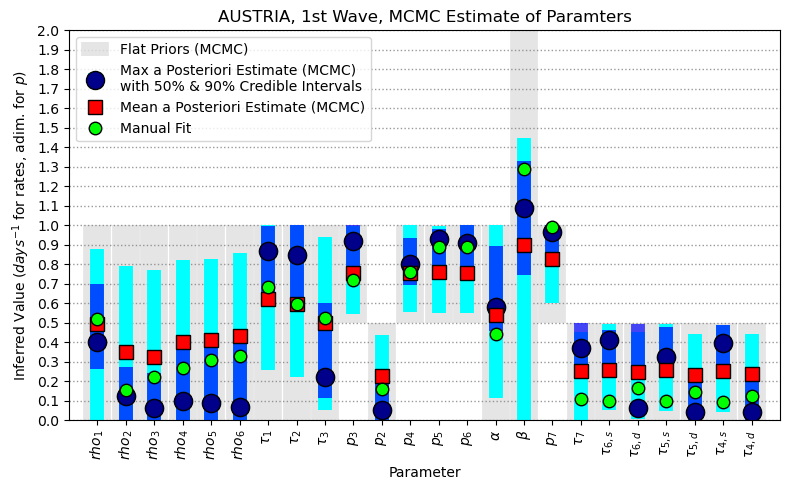

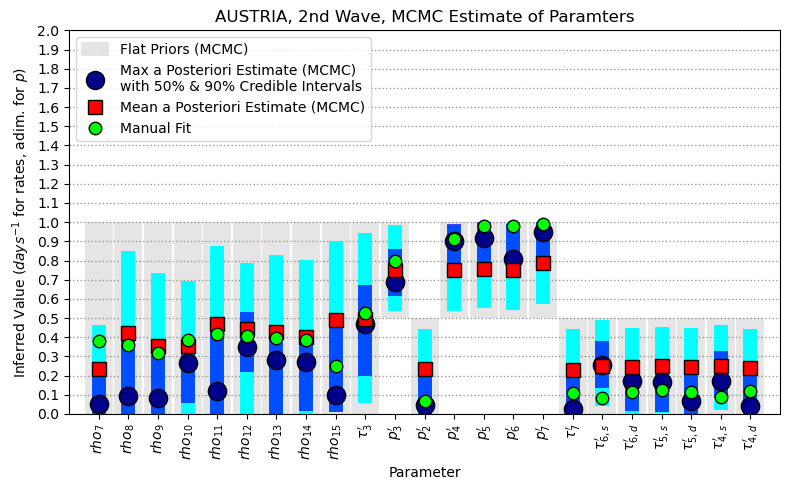

In [40]:
def ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals):
    
    TransposedCredInt = np.transpose(np.array(ListOfCredibleIntervals))
    TransposedCredInt_LowerBounds = TransposedCredInt[0,:]
    TransposedCredInt_UpperBounds = TransposedCredInt[1,:]
    ErrMinus = ListOfMaxs - TransposedCredInt_LowerBounds
    ErrPlus = TransposedCredInt_UpperBounds - ListOfMaxs
    errors = np.transpose(np.column_stack((ErrMinus,ErrPlus)))
    
    return errors

# Loop to iterate over waves (1st, 2nd)
for j in [0,1]:
    
    ListOfMaxs = ListOfListsOfMaxs[j]
    ListOfMeans = ListOfListsMeans[j]
    ListOfCredibleIntervals50 = ListOfListsCredibleIntervals50[j]
    ListOfCredibleIntervals90 = ListOfListsCredibleIntervals90[j]
    MyParNames = AllWavesNames[j]
    ParamsManual = ListParamsManual[j]
    #ParamsAutomated = ListParamsAutomated[j]
    Priors = ListPriors[j]
    ListLow = ListListsLow[j]

    if j==0:
        WhichWave = '1st' 
    elif j==1:
        WhichWave = '2nd'
        
    x = np.arange(1,len(ListOfMaxs)+1,1)
    y = ListOfMaxs

    errors50 = ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals50)
    errors90 = ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals90)

    plt.figure(figsize=(8, 5),facecolor="white")

    plt.errorbar(x, ListLow, yerr=Priors, fmt = 'o', ms = 0, color = 'gray', elinewidth = 20, alpha = 0.2, label='Flat Priors (MCMC)')
    plt.errorbar(x, y, yerr=errors90, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'cyan', elinewidth = 10,label='Max a Posteriori Estimate (MCMC)\nwith 50% & 90% Credible Intervals',markeredgecolor='k')
    plt.errorbar(x, y, yerr=errors50, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'blue', elinewidth = 10, alpha = 0.7,markeredgecolor='k')
    plt.errorbar(x, ListOfMeans, yerr=0, fmt = 's', ms=10, markerfacecolor = 'red',color='white',label='Mean a Posteriori Estimate (MCMC)',markeredgecolor='k')
    plt.errorbar(x, ParamsManual, yerr=0, fmt = 'o', ms=9, markerfacecolor = 'lime', color = 'white', label='Manual Fit',markeredgecolor='k')
    #plt.errorbar(x, ParamsAutomated, yerr=0, fmt = '*', ms=10, markerfacecolor = 'gold', color = 'white',label='Automated Fit (scipy.optimize.minimize)',markeredgecolor='k')

    plt.grid(axis='y', color='gray', linestyle=':', linewidth=1, alpha = 0.8)
    plt.title('AUSTRIA, ' + str(WhichWave) + ' Wave, MCMC Estimate of Paramters')
    plt.legend(loc='upper left', fancybox=True, numpoints=1)

    plt.xlim(0,len(ListOfMaxs)+1)
    plt.ylim(0,2)

    plt.xlabel('Parameter')
    plt.ylabel('Inferred Value ($days^{-1}$ for rates, adim. for $p$)')

    plt.xticks(x,MyParNames,rotation=90) 
    plt.yticks(np.arange(0,2.1,0.1)) 

    plt.tight_layout()
    plt.savefig('./Results_Austria/Austria_ParallelMCMC_ParameterEstimatesPosteriorsPriors_Wave' + str(j+1) + FileFormatOfFigures)
                

In [41]:
def ComputeFoldChange_WithStdError(Chain1ParA,Chain1ParB):
            MeanA = sum(Chain1ParA)/len(Chain1ParA)
            MeanB = sum(Chain1ParB)/len(Chain1ParB)
            StdDevA = np.std(Chain1ParA)
            StdDevB = np.std(Chain1ParB)
            StandardErrorOfTheMeanA = StdDevA / math.sqrt(len(Chain1ParA))
            StandardErrorOfTheMeanB = StdDevB / math.sqrt(len(Chain1ParB))
            RatioMutOnCtrl = MeanB / MeanA
            MyBase = 2
            if RatioMutOnCtrl != 0:
                FoldChangeCurrentParam = math.log(RatioMutOnCtrl, MyBase)
            else:
                FoldChangeCurrentParam = 0
            Temp1 = StandardErrorOfTheMeanA ** 2 / (MeanA ** 2 * math.log(2) ** 2)
            Temp2 = StandardErrorOfTheMeanB ** 2 / (MeanB ** 2 * math.log(2) ** 2)
            STDDEVofFoldChangeCurrentParam = math.sqrt(Temp1 + Temp2)
            return FoldChangeCurrentParam, STDDEVofFoldChangeCurrentParam
        
def ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave):
            RatioMutOnCtrl = ValueParam2ndWave / ValueParam1stWave
            MyBase = 2
            if RatioMutOnCtrl != 0:
                FoldChangeCurrentParam = math.log(RatioMutOnCtrl, MyBase)
            else:
                FoldChangeCurrentParam = 0
            return FoldChangeCurrentParam

In [330]:
# Indeces indicate the parameters as indicated by commented text above

ListOfIndecesNewOrderFC = [12,4,3,5,6,7,8,19,17,18,15,16,13,14]
ListOfIndecesNewOrder_2ndWaveFC = [29,23,22,24,25,26,27,36,34,35,32,33,30,31]

ParametersManualFit_1stWave_forFC = ListOfParametersfirstwave[ListOfIndecesNewOrderFC]
ParametersManualFit_2ndWave_forFC = ListOfParametersfirstwave[ListOfIndecesNewOrder_2ndWaveFC]

ListOfFCs_ManualFit = []
for k_param in np.arange(0,len(ParametersManualFit_1stWave_forFC),1):
    ValueParam1stWave = ParametersManualFit_1stWave_forFC[k_param]
    ValueParam2ndWave = ParametersManualFit_2ndWave_forFC[k_param]
    FoldChangeCurrentParam = ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave)
    ListOfFCs_ManualFit.append(FoldChangeCurrentParam)

NameError: name 'ComputeFoldChange' is not defined

In [46]:

#AllWavesChains = np.array(AllWavesChains)
#AllWavesNames = np.array(AllWavesNames)

j_ParamForFC_1stW = [8,9,10,11,12,13,16,17,18,19,20,21,22,23]
ChainsParameters_1stWave_forFC = np.array(AllWavesChains[0])[:,j_ParamForFC_1stW]
NamesParams1stWave = np.array(AllWavesNames[0])[j_ParamForFC_1stW]

j_ParamForFC_2ndW = np.array([8,9,10,11,12,13,14,15,16,17,18,19,20,21])+1
ChainsParameters_2ndWave_forFC = np.array(AllWavesChains[1])[:,j_ParamForFC_2ndW]
NamesParams2ndWave = np.array(AllWavesNames[1])[j_ParamForFC_2ndW]

ListOfFCs_Means = []
ListOfFCs_STDevs = []
for k_param in np.arange(0,len(j_ParamForFC_1stW),1):
    Chain1ParA = ChainsParameters_1stWave_forFC[:,k_param]
    Chain1ParB = ChainsParameters_2ndWave_forFC[:,k_param]
    FoldChangeCurrentParam, STDDEVofFoldChangeCurrentParam = ComputeFoldChange_WithStdError(Chain1ParA,Chain1ParB)
    ListOfFCs_Means.append(FoldChangeCurrentParam)
    ListOfFCs_STDevs.append(STDDEVofFoldChangeCurrentParam)

In [47]:
ParametersMaxes_1stWave_forFC = np.array(ListOfListsOfMaxs[0])[j_ParamForFC_1stW]
ParametersMaxes_2ndWave_forFC = np.array(ListOfListsOfMaxs[1])[j_ParamForFC_2ndW]

ListOfFCs_MaxEstimate = []
for k_param in np.arange(0,len(ParametersMaxes_1stWave_forFC),1):
    ValueParam1stWave = ParametersMaxes_1stWave_forFC[k_param]
    ValueParam2ndWave = ParametersMaxes_2ndWave_forFC[k_param]
    FoldChangeCurrentParam = ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave)
    ListOfFCs_MaxEstimate.append(FoldChangeCurrentParam)

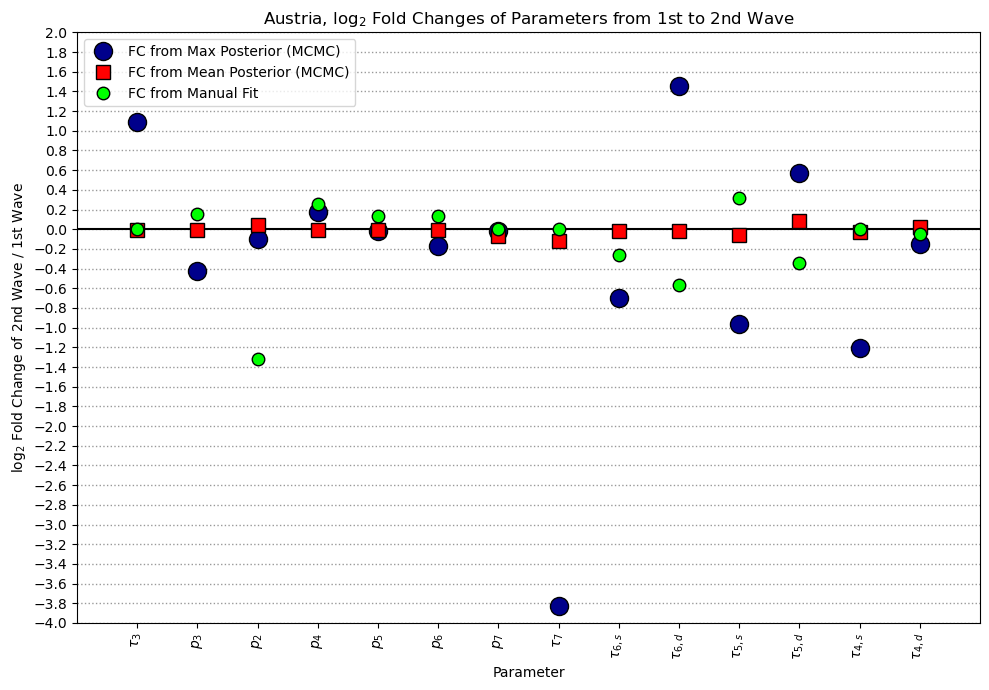

In [48]:
plt.figure(figsize=(10, 7),facecolor="white")

x = np.arange(1,len(NamesParams1stWave)+1,1)

plt.errorbar(x, ListOfFCs_MaxEstimate, yerr=0, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'white', elinewidth = 2,label='FC from Max Posterior (MCMC)',markeredgecolor='k')
plt.errorbar(x, ListOfFCs_Means, yerr=ListOfFCs_STDevs, fmt = 's', ms=10, markerfacecolor = 'red',color='k',label='FC from Mean Posterior (MCMC)',markeredgecolor='k')
plt.errorbar(x, ListOfFCs_ManualFit, yerr=0, fmt = 'o', ms=9, markerfacecolor = 'lime', color = 'white', label='FC from Manual Fit',markeredgecolor='k')

plt.title(r'Austria, $\log_2$ Fold Changes of Parameters from 1st to 2nd Wave')
plt.legend(loc='upper left')

plt.grid(axis='y', color='gray', linestyle=':', linewidth=1, alpha = 0.8)
plt.axhline(y=0, color='k')
  
plt.xlabel('Parameter')
plt.ylabel(r'$\log_2$ Fold Change of 2nd Wave / 1st Wave ')

plt.xticks(x,NamesParams1stWave,rotation=90) 
plt.yticks(np.arange(-5,5.1,0.2)) 

plt.xlim(0,len(NamesParams1stWave)+1)
plt.ylim(-4,2)

plt.tight_layout()
plt.savefig('./Results_Austria/Austria_ParallelMCMC_ParameterEstimatesFoldChanges' + FileFormatOfFigures)
                      

In [120]:
########## Vaccination #########

In [121]:
MyListOfDates = ['21 Feb.']
for Day in np.arange(22,30,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jan.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jan.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jan.'
    MyListOfDates.append(ThisDate)
MyListOfDates=np.array(MyListOfDates)

In [122]:
# rho values
rho1=0.52
rho2=0.155
rho3=0.22

rho4=0.27
rho5=0.31 
rho6=0.33 
rho7=0.38
rho8=0.36
rho9=0.32
rho10=0.385
rho11=0.415
rho12=0.405
rho13=0.395
rho14=0.385
rho15=0.27
rho16=0.34
ListOfRhos=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
ListOfRhos_ManualFit_1stWave=ListOfRhos



In [123]:
def model_SEIRICUHOS_vac(dt,v,t,MyListOfRhos,ListOfParameters):
    
    #model system
    #S, E, R ,II ,Q, NII, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
        
    alpha=ListOfParameters[0] 
    beta=ListOfParameters[1]
    p1=ListOfParameters[2]
    p2=ListOfParameters[3]
    p3=ListOfParameters[4]
    p4=ListOfParameters[5]
    p5=ListOfParameters[6]
    p6=ListOfParameters[7]
    p7=ListOfParameters[8]
    p9=ListOfParameters[9]
    tau1 = ListOfParameters[10]
    tau2 = ListOfParameters[11]
    tau3 = ListOfParameters[12]
    tau4 = ListOfParameters[13]
    #tau4die = ListOfParameters[14]
    #tau5sur = ListOfParameters[15]
    tau5 = ListOfParameters[14]
    tau6 = ListOfParameters[15]
    #tau6die = ListOfParameters[16]
    tau7 = ListOfParameters[16]
    tau8 = ListOfParameters[17]
    tau9 = ListOfParameters[18]
    p2prim=ListOfParameters[19]
    p3prim=ListOfParameters[20]
    p4prim=ListOfParameters[21]
    p5prim=ListOfParameters[22]
    p6prim=ListOfParameters[23]
    p7prim=ListOfParameters[24]
    p9prim=ListOfParameters[25]
    tau3prim=ListOfParameters[26]
    tau4prim=ListOfParameters[27]
    #tau4dieprim=ListOfParameters[31]
    #tau5surprim=ListOfParameters[32]
    tau5prim=ListOfParameters[28]
    tau6prim=ListOfParameters[29]
    #tau6dieprim=ListOfParameters[35]
    tau7prim=ListOfParameters[30]
    tau8prim=ListOfParameters[31]
    tau9prim=ListOfParameters[32]
    tvac=ListOfParameters[33]
            
    y=ODE_system_vac(dt,MyListOfRhos,alpha,beta,p1, p2,p3,p4,p5,p6,p7,p9, tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim, tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim,tvac, v,t)
    return y

In [124]:
def f(u,rho,alpha,beta,p1, p2,p3,p4,p5,p6,p7,p9, tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, t):
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    return np.array([(beta*(NII+II)*S*-rho), #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5*Hl*p5+tau6*AICU*p6+p7*tau7*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2)*tau2-p2*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8),#NII
            ((1-p6)*AICU*tau6+(1-p5)*Hl*tau5+(1-p4)*tau4*ICU),#
            (p2*Q*tau2-p3*H*tau3-(1-p3)*H*tau3),#H
            (p3*H*tau3-p5*Hl*tau5-(1-p5)*Hl*tau5),#Hl
            ( (1-p3)*H*tau3-tau4*ICU*p4-(1-p4)*ICU*tau4),#ICU
            (tau4*ICU*p4-AICU*tau6*p6-AICU*tau6*(1-p6)),#AICU
            (Q*(1-p2)*tau2-tau7*(1-p7)*NI-p7*tau7*NI),#NI
            (NII*tau8-tau9*(1-p9)*NI1-p9*tau9*NI1),#NI1
            (p9*NI1*tau9),#R1
            ((1-p9)*tau9*NI1),#D1
            ((1-p7)*NI*tau7),#
            0
                 ])

In [125]:
def f1(u,rho,alpha,beta,p1,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim,t):
   
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    return np.array([(beta*(NII+II)*S*-rho), #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5prim*Hl*p5prim+tau6prim*AICU*p6prim+p7prim*tau7prim*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2prim)*tau2-p2prim*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8prim),#NII
            ((1-p6prim)*AICU*tau6prim+(1-p5prim)*Hl*tau5prim+(1-p4prim)*tau4prim*ICU),#
            (p2prim*Q*tau2-p3prim*H*tau3prim-(1-p3prim)*H*tau3prim),#H
            (p3prim*H*tau3prim-p5prim*Hl*tau5prim-(1-p5prim)*Hl*tau5prim),#Hl
            ( (1-p3prim)*H*tau3prim-tau4prim*ICU*p4prim-(1-p4prim)*ICU*tau4prim),#ICU
            (tau4prim*ICU*p4prim-AICU*tau6prim*p6prim-AICU*tau6prim*(1-p6prim)),#AICU
            (Q*(1-p2prim)*tau2-tau7prim*(1-p7prim)*NI-p7prim*tau7prim*NI),#NI
            (NII*tau8prim-tau9prim*(1-p9prim)*NI1-p9prim*tau9prim*NI1),#NI1
            (p9prim*NI1*tau9prim),#R1
            ((1-p9prim)*tau9prim*NI1),
            ((1-p7prim)*NI*tau7prim),#
            0
                 ])

In [126]:
def f2(u,rho,alpha,beta,p1,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tvac,
    t):
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    #print("I am here!")
    return np.array([(beta*(NII+II)*S*-rho)-tvac, #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5prim*Hl*p5prim+tau6prim*AICU*p6prim+p7prim*tau7prim*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2prim)*tau2-p2prim*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8prim),#NII
            ((1-p6prim)*AICU*tau6prim+(1-p5prim)*Hl*tau5prim+(1-p4prim)*tau4prim*ICU),#
            (p2prim*Q*tau2-p3prim*H*tau3prim-(1-p3prim)*H*tau3prim),#H
            (p3prim*H*tau3prim-p5prim*Hl*tau5prim-(1-p5prim)*Hl*tau5prim),#Hl
            ( (1-p3prim)*H*tau3prim-tau4prim*ICU*p4prim-(1-p4prim)*ICU*tau4prim),#ICU
            (tau4prim*ICU*p4prim-AICU*tau6prim*p6prim-AICU*tau6prim*(1-p6prim)),#AICU
            (Q*(1-p2prim)*tau2-tau7prim*(1-p7prim)*NI-p7prim*tau7prim*NI),#NI
            (NII*tau8prim-tau9prim*(1-p9prim)*NI1-p9prim*tau9prim*NI1),#NI1
            (p9prim*NI1*tau9prim),#R1
            ((1-p9prim)*tau9prim*NI1),
            ((1-p7prim)*NI*tau7prim),#
            tvac
                 ])

In [127]:
def ODE_system_vac(dt,rholist,alpha,beta,p1, p2,p3,p4,p5,p6,p7,p9, tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim, tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim,tvac, v,ttt):

    N_t = int(round(float(ttt)/dt))
    print(N_t)
    # Ensure that any list/tuple returned from f_ is wrapped as array
    
    f_ = lambda u, tt, rho: np.asarray(f(u,rho,alpha,beta,p1, p2,p3,p4,p5,p6,p7,p9, tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, tt))
    f1_ = lambda u, tt,rho: np.asarray(f1(u,rho,alpha,beta,p1,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tt))
    f2_ = lambda u, tt,rho: np.asarray(f2(u,rho,alpha,beta,p1,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tvac,tt))
    U_0= [1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    u = np.zeros((N_t+1, len(U_0)))
    t = np.linspace(0, N_t*dt, len(u))
    
    RhoVsTimeList = rhoAsFunctionforAustria(t,rholist)
    print(rholist)
    plt.plot(RhoVsTimeList)
    u[0] = U_0
    for n in range(N_t):
        if (n<112/dt):
            u[n+1] = u[n] + dt*f_(u[n], t[n], RhoVsTimeList[n])
        elif (n>=112/dt) and(n<316/dt):
            u[n+1] = u[n] + dt*f1_(u[n], t[n], RhoVsTimeList[n])
        elif (n>=316/dt): 
            if u[n,0]<=0.0001:#0.00001: # 0.000002
                u[n+1] = u[n] + dt*f1_(u[n], t[n], RhoVsTimeList[n])
                if u[n,0] < 0:
                    u[n,0] = 0 
            else:     
                u[n+1] = u[n] + dt*f2_(u[n], t[n], RhoVsTimeList[n])
                if u[n,0] < 0:
                    u[n,0] = 0 
    return u

In [128]:
tvac=2/365

ListOfParametersfirstwave_vac=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac])

In [129]:
tvac1=1/365

ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac1])

In [130]:
tvac2=1/(365*1.5)

ListOfParametersfirstwave_vac2=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac2])

In [131]:
tvac3=0

ListOfParametersfirstwave_vac3=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac3])

In [132]:
tvac4=1/(365*1.46)

ListOfParametersfirstwave_vac4=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac4])

In [133]:
N=8901064
P3=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)

t_max=1000
dt=0.01
ValuesOnlyAtDays = np.arange(0,int(t_max/dt+1),int(1/dt))


100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34]


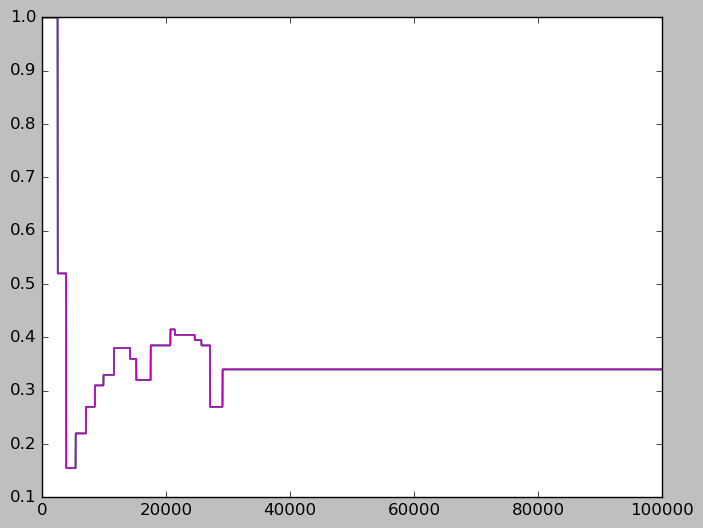

In [134]:
#from scipy.integrate import solve_ivp
#p=model_SEIRICUHOS_vac(P3,t,ListOfRhos,ListOfParametersfirstwave_vac)
#resultsseir_vac1=solve_ivp(p,P3,t,events=stop_condition)

resultsseir_vac1=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos,ListOfParametersfirstwave_vac)[ValuesOnlyAtDays]
resultsseir_vac2=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
resultsseir_vac3=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos,ListOfParametersfirstwave_vac2)[ValuesOnlyAtDays]
resultsseir_vac4=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos,ListOfParametersfirstwave_vac3)[ValuesOnlyAtDays]
resultsseir_vac5=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos,ListOfParametersfirstwave_vac4)[ValuesOnlyAtDays]





100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.395]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.395]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.395]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.395]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.395]


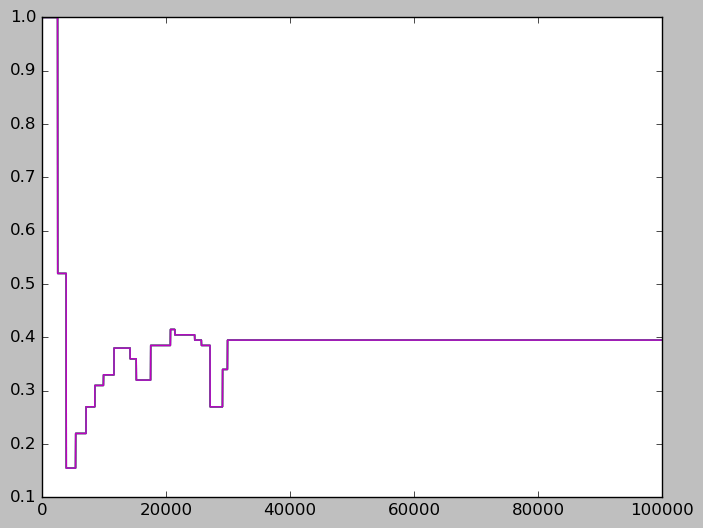

In [135]:
###Rho_BestScenario = min(ListOfRhos)
Rho_WorstScenario = ListOfRhos[13] # max(ListOfRhos[1:-1])

###List_Rho_BestScenario = list(ListOfRhos) + [Rho_BestScenario]
List_Rho_WorstScenario = list(ListOfRhos) + [Rho_WorstScenario]

###resultsseir_vac_Best=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_BestScenario,ListOfParametersfirstwave_vac)[ValuesOnlyAtDays]
###resultsseir_vac_Best1=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_BestScenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
###resultsseir_vac_Best2=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_BestScenario,ListOfParametersfirstwave_vac2)[ValuesOnlyAtDays]
#=model_SEIRICUHOS_vac(P3,t,ListOfRhos,ListOfParametersfirstwave_vac3)

resultsseir_vac_Worst=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac)[ValuesOnlyAtDays]
resultsseir_vac_Worst1=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
resultsseir_vac_Worst2=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac2)[ValuesOnlyAtDays]
resultsseir_vac_Worst3=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac3)[ValuesOnlyAtDays]
resultsseir_vac_Worst4=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac4)[ValuesOnlyAtDays]

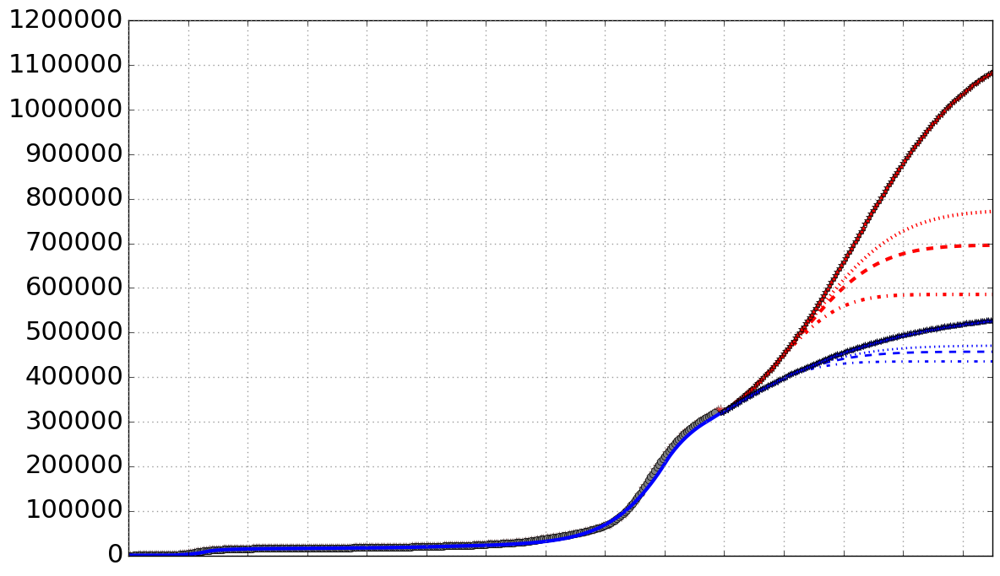

In [136]:
plt.figure(figsize=(12, 7),facecolor="white")

DI=df['new_cases_cum']
SevenDaysMovingAverage_TotalCases = ComputeSevenDaysMovingAverage(DI)
p =len(SevenDaysMovingAverage_TotalCases)
    
plt.plot(times[0:p],DI,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_TotalCases)-1]),alpha=0.4, markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_TotalCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
#plt.plot(t,(resultsseirfit[:,2]+resultsseirfit[:,3]+resultsseirfit[:,4]+resultsseirfit[:,6]+resultsseirfit[:,7]+resultsseirfit[:,8]+resultsseirfit[:,9]+resultsseirfit[:,10]+resultsseirfit[:,11])*N, label="Simulation automated fit", linewidth=2,color='red')
plt.plot(t[0:NumberDaysData],(resultsseir_vac4[:,2]+resultsseir_vac4[:,3]+resultsseir_vac4[:,4]+resultsseir_vac4[:,6]+resultsseir_vac4[:,7]+resultsseir_vac4[:,8]+resultsseir_vac4[:,9]+resultsseir_vac4[:,10]+resultsseir_vac4[:,11]+resultsseir_vac4[:,15])[0:NumberDaysData]*N, label="Simulation, Manual Fit", linewidth=3,color='blue')
#plt.plot(t[0:NumberDaysData],(resultsseir_vac1[:,2]+resultsseir_vac1[:,3]+resultsseir_vac1[:,4]+resultsseir_vac1[:,6]+resultsseir_vac1[:,7]+resultsseir_vac1[:,8]+resultsseir_vac1[:,9]+resultsseir_vac1[:,10]+resultsseir_vac1[:,11]+resultsseir_vac1[:,15])[0:NumberDaysData]*N,'*', label="Simulation, Manual Fit", linewidth=3,color='blue')
#plt.plot(t[0:NumberDaysData],(resultsseir_vac2[:,2]+resultsseir_vac2[:,3]+resultsseir_vac2[:,4]+resultsseir_vac2[:,6]+resultsseir_vac2[:,7]+resultsseir_vac2[:,8]+resultsseir_vac2[:,9]+resultsseir_vac2[:,10]+resultsseir_vac2[:,11]+resultsseir_vac2[:,15])[0:NumberDaysData]*N,':', label="Simulation, Manual Fit", linewidth=3,color='blue')

#Optimistic = resultsseir_vac_Best[:,2]+resultsseir_vac_Best[:,3]+resultsseir_vac_Best[:,4]+resultsseir_vac_Best[:,6]+resultsseir_vac_Best[:,7]+resultsseir_vac_Best[:,8]+resultsseir_vac_Best[:,9]+resultsseir_vac_Best[:,10]+resultsseir_vac_Best[:,11]+resultsseir_vac_Best[:,15]
#Optimistic1 = resultsseir_vac_Best1[:,2]+resultsseir_vac_Best1[:,3]+resultsseir_vac_Best1[:,4]+resultsseir_vac_Best1[:,6]+resultsseir_vac_Best1[:,7]+resultsseir_vac_Best1[:,8]+resultsseir_vac_Best1[:,9]+resultsseir_vac_Best1[:,10]+resultsseir_vac_Best1[:,11]+resultsseir_vac_Best1[:,15]
#Optimistic2 = resultsseir_vac_Best2[:,2]+resultsseir_vac_Best2[:,3]+resultsseir_vac_Best2[:,4]+resultsseir_vac_Best2[:,6]+resultsseir_vac_Best2[:,7]+resultsseir_vac_Best2[:,8]+resultsseir_vac_Best2[:,9]+resultsseir_vac_Best2[:,10]+resultsseir_vac_Best2[:,11]+resultsseir_vac_Best2[:,15]

Pessimistic = resultsseir_vac_Worst[:,2]+resultsseir_vac_Worst[:,3]+resultsseir_vac_Worst[:,4]+resultsseir_vac_Worst[:,6]+resultsseir_vac_Worst[:,7]+resultsseir_vac_Worst[:,8]+resultsseir_vac_Worst[:,9]+resultsseir_vac_Worst[:,10]+resultsseir_vac_Worst[:,11]+resultsseir_vac_Worst[:,15]
Pessimistic1 = resultsseir_vac_Worst1[:,2]+resultsseir_vac_Worst1[:,3]+resultsseir_vac_Worst1[:,4]+resultsseir_vac_Worst1[:,6]+resultsseir_vac_Worst1[:,7]+resultsseir_vac_Worst1[:,8]+resultsseir_vac_Worst1[:,9]+resultsseir_vac_Worst1[:,10]+resultsseir_vac_Worst1[:,11]+resultsseir_vac_Worst1[:,15]
Pessimistic2 = resultsseir_vac_Worst2[:,2]+resultsseir_vac_Worst2[:,3]+resultsseir_vac_Worst2[:,4]+resultsseir_vac_Worst2[:,6]+resultsseir_vac_Worst2[:,7]+resultsseir_vac_Worst2[:,8]+resultsseir_vac_Worst2[:,9]+resultsseir_vac_Worst2[:,10]+resultsseir_vac_Worst2[:,11]+resultsseir_vac_Worst2[:,15]
Pessimistic3 = resultsseir_vac_Worst3[:,2]+resultsseir_vac_Worst3[:,3]+resultsseir_vac_Worst3[:,4]+resultsseir_vac_Worst3[:,6]+resultsseir_vac_Worst3[:,7]+resultsseir_vac_Worst3[:,8]+resultsseir_vac_Worst3[:,9]+resultsseir_vac_Worst3[:,10]+resultsseir_vac_Worst3[:,11]+resultsseir_vac_Worst3[:,15]
Pessimistic4 = resultsseir_vac_Worst4[:,2]+resultsseir_vac_Worst4[:,3]+resultsseir_vac_Worst4[:,4]+resultsseir_vac_Worst4[:,6]+resultsseir_vac_Worst4[:,7]+resultsseir_vac_Worst4[:,8]+resultsseir_vac_Worst4[:,9]+resultsseir_vac_Worst4[:,10]+resultsseir_vac_Worst4[:,11]+resultsseir_vac_Worst4[:,15]


#plt.plot(t[NumberDaysData:-1],Optimistic[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown) 1st vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],Optimistic1[NumberDaysData:-1]*N,'--', label="Optimistic Projection (as lockdown) 2nd vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],Optimistic2[NumberDaysData:-1]*N,':', label="Optimistic Projection (as lockdown) 3rd vaccination strategy", linewidth=3,color='green')

plt.plot(t[NumberDaysData:-1],Pessimistic[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection (as October) + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic1[NumberDaysData:-1]*N,'--', label="Pessimistic Projection (as October) + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic2[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October) + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic3[NumberDaysData:-1]*N,'*', label="Pessimistic Projection (as October) + no vaccination strategy", linewidth=3,color='red')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,2]+resultsseir_vac1[:,3]+resultsseir_vac1[:,4]+resultsseir_vac1[:,6]+resultsseir_vac1[:,7]+resultsseir_vac1[:,8]+resultsseir_vac1[:,9]+resultsseir_vac1[:,10]+resultsseir_vac1[:,11]+resultsseir_vac1[:,15])[NumberDaysData:-1]*N,'-.', label="Projection if No Further Change + 1st vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,2]+resultsseir_vac2[:,3]+resultsseir_vac2[:,4]+resultsseir_vac2[:,6]+resultsseir_vac2[:,7]+resultsseir_vac2[:,8]+resultsseir_vac2[:,9]+resultsseir_vac2[:,10]+resultsseir_vac2[:,11]+resultsseir_vac2[:,15])[NumberDaysData:-1]*N,'--', label="Projection if No Further Change + 2nd vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,2]+resultsseir_vac3[:,3]+resultsseir_vac3[:,4]+resultsseir_vac3[:,6]+resultsseir_vac3[:,7]+resultsseir_vac3[:,8]+resultsseir_vac3[:,9]+resultsseir_vac3[:,10]+resultsseir_vac3[:,11]+resultsseir_vac3[:,15])[NumberDaysData:-1]*N,':', label="Projection if No Further Change + 3rd vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac4[:,2]+resultsseir_vac4[:,3]+resultsseir_vac4[:,4]+resultsseir_vac4[:,6]+resultsseir_vac4[:,7]+resultsseir_vac4[:,8]+resultsseir_vac4[:,9]+resultsseir_vac4[:,10]+resultsseir_vac4[:,11]+resultsseir_vac4[:,15])[NumberDaysData:-1]*N,'*', label="Projection if No Further Change + no vaccination strategy", linewidth=2,color='blue')

#plt.plot(t[0:NumberDaysData],(resultsseir_vac[:,12]+resultsseir_vac[:,13]+resultsseir_vac[:,14]+resultsseir_vac[:,5])[0:NumberDaysData]*N,'-.', label="Undetected Cases (No change scenario)", linewidth=2,color='magenta',alpha=0.7)

UpperY = 1200000#1300000  
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=18)
plt.xticks(times[only10thindex],'')


plt.yticks(np.arange(0,UpperY+1,100000),fontsize=22)

#plt.title("Austria")

#plt.legend(loc='upper left')
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Total Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.tight_layout()
plt.savefig('./Results_Austria/TotalCases_vac_SEIR-ICU_AUSTRIA'+ FileFormatOfFigures)


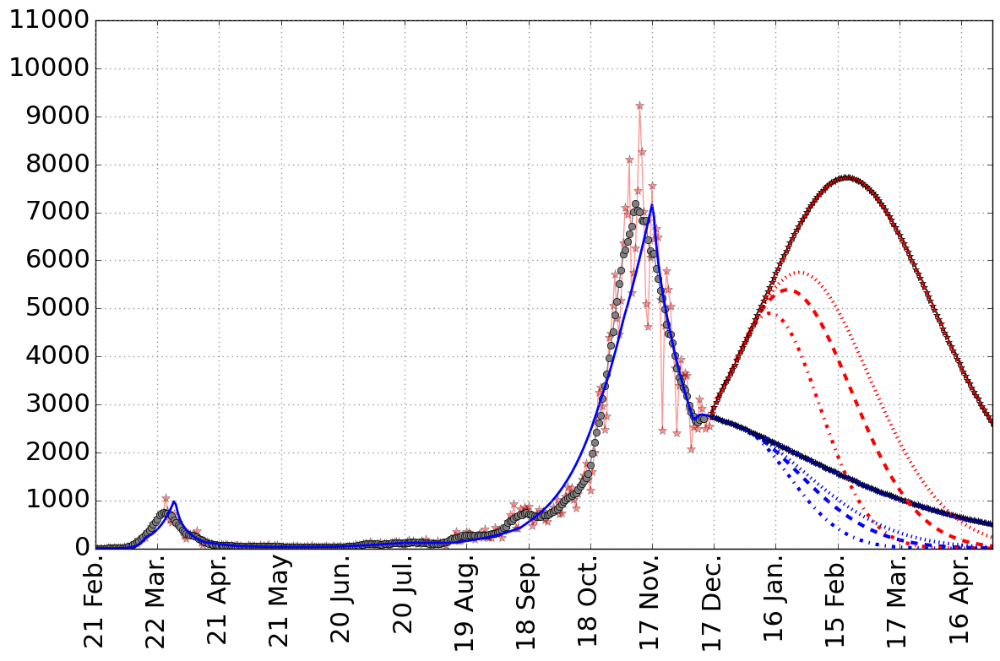

In [137]:
#plot daily new cases
plt.figure(figsize=(12, 8),facecolor="white")

DI1=df['new_cases']
SevenDaysMovingAverage_DailyCases = ComputeSevenDaysMovingAverage(DI1)
p =len(SevenDaysMovingAverage_DailyCases)
    
plt.plot(times[0:p],DI1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_DailyCases)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_DailyCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
yoo=(resultsseir_vac4[:,2]+resultsseir_vac4[:,3]+resultsseir_vac4[:,4]+resultsseir_vac4[:,6]+resultsseir_vac4[:,7]+resultsseir_vac4[:,8]+resultsseir_vac4[:,9]+resultsseir_vac4[:,10]+resultsseir_vac4[:,11]+resultsseir_vac4[:,15])*N

pp=len(yoo)

yuu=np.zeros(1001)
for ii in range(0,1000):
    yuu[ii]= yoo[ii+1]-yoo[ii]
plt.plot(t[0:NumberDaysData],yuu[0:NumberDaysData],label="Simulation, Manual Fit", linewidth=2,color='blue')


Optimistic4=(resultsseir_vac4[:,2]+resultsseir_vac4[:,3]+resultsseir_vac4[:,4]+resultsseir_vac4[:,6]+resultsseir_vac4[:,7]+resultsseir_vac4[:,8]+resultsseir_vac4[:,9]+resultsseir_vac4[:,10]+resultsseir_vac4[:,11]+resultsseir_vac4[:,15])
Optimistic1=(resultsseir_vac1[:,2]+resultsseir_vac1[:,3]+resultsseir_vac1[:,4]+resultsseir_vac1[:,6]+resultsseir_vac1[:,7]+resultsseir_vac1[:,8]+resultsseir_vac1[:,9]+resultsseir_vac1[:,10]+resultsseir_vac1[:,11]+resultsseir_vac1[:,15])
Optimistic2=(resultsseir_vac2[:,2]+resultsseir_vac2[:,3]+resultsseir_vac2[:,4]+resultsseir_vac2[:,6]+resultsseir_vac2[:,7]+resultsseir_vac2[:,8]+resultsseir_vac2[:,9]+resultsseir_vac2[:,10]+resultsseir_vac2[:,11]+resultsseir_vac2[:,15])
Optimistic3=(resultsseir_vac3[:,2]+resultsseir_vac3[:,3]+resultsseir_vac3[:,4]+resultsseir_vac3[:,6]+resultsseir_vac3[:,7]+resultsseir_vac3[:,8]+resultsseir_vac3[:,9]+resultsseir_vac3[:,10]+resultsseir_vac3[:,11]+resultsseir_vac3[:,15])



yooOptimistic4 = Optimistic4*N
yooOptimistic1 = Optimistic1*N
yooOptimistic2 = Optimistic2*N
yooOptimistic3 = Optimistic3*N


yuuOptimistic4=np.zeros(1001)
yuuOptimistic1=np.zeros(1001)
yuuOptimistic2=np.zeros(1001)
yuuOptimistic3=np.zeros(1001)
for ii in range(0,1000):
    yuuOptimistic4[ii]= yooOptimistic4[ii+1]-yooOptimistic4[ii]
    yuuOptimistic1[ii]= yooOptimistic1[ii+1]-yooOptimistic1[ii]
    yuuOptimistic2[ii]= yooOptimistic2[ii+1]-yooOptimistic2[ii]
    yuuOptimistic3[ii]= yooOptimistic3[ii+1]-yooOptimistic3[ii]
plt.plot(t[NumberDaysData:-1],yuuOptimistic1[NumberDaysData:-1],'-.', label="Optimistic Projection (as October) + 6 months vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic2[NumberDaysData:-1],'--', label="Optimistic Projection (as October) + 1 year vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic3[NumberDaysData:-1],':', label="Optimistic Projection (as October) + 1.5 years vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic4[NumberDaysData:-1],'*', label="Optimistic Projection (as October) + no vaccination", linewidth=3,color='blue')

Pessimistic = resultsseir_vac_Worst[:,2]+resultsseir_vac_Worst[:,3]+resultsseir_vac_Worst[:,4]+resultsseir_vac_Worst[:,6]+resultsseir_vac_Worst[:,7]+resultsseir_vac_Worst[:,8]+resultsseir_vac_Worst[:,9]+resultsseir_vac_Worst[:,10]+resultsseir_vac_Worst[:,11]+resultsseir_vac_Worst[:,15]
Pessimistic1 = resultsseir_vac_Worst1[:,2]+resultsseir_vac_Worst1[:,3]+resultsseir_vac_Worst1[:,4]+resultsseir_vac_Worst1[:,6]+resultsseir_vac_Worst1[:,7]+resultsseir_vac_Worst1[:,8]+resultsseir_vac_Worst1[:,9]+resultsseir_vac_Worst1[:,10]+resultsseir_vac_Worst1[:,11]+resultsseir_vac_Worst1[:,15]
Pessimistic2 = resultsseir_vac_Worst2[:,2]+resultsseir_vac_Worst2[:,3]+resultsseir_vac_Worst2[:,4]+resultsseir_vac_Worst2[:,6]+resultsseir_vac_Worst2[:,7]+resultsseir_vac_Worst2[:,8]+resultsseir_vac_Worst2[:,9]+resultsseir_vac_Worst2[:,10]+resultsseir_vac_Worst2[:,11]+resultsseir_vac_Worst2[:,15]
Pessimistic3 = resultsseir_vac_Worst3[:,2]+resultsseir_vac_Worst3[:,3]+resultsseir_vac_Worst3[:,4]+resultsseir_vac_Worst3[:,6]+resultsseir_vac_Worst3[:,7]+resultsseir_vac_Worst3[:,8]+resultsseir_vac_Worst3[:,9]+resultsseir_vac_Worst3[:,10]+resultsseir_vac_Worst3[:,11]+resultsseir_vac_Worst3[:,15]

yooPessimistic = Pessimistic*N
yooPessimistic1 = Pessimistic1*N
yooPessimistic2 = Pessimistic2*N
yooPessimistic3 = Pessimistic3*N

    
yuuPessimistic=np.zeros(1001)
yuuPessimistic1=np.zeros(1001)
yuuPessimistic2=np.zeros(1001)
yuuPessimistic3=np.zeros(1001)
for ii in range(0,1000):
    yuuPessimistic[ii]= yooPessimistic[ii+1]-yooPessimistic[ii]
    yuuPessimistic1[ii]= yooPessimistic1[ii+1]-yooPessimistic1[ii]
    yuuPessimistic2[ii]= yooPessimistic2[ii+1]-yooPessimistic2[ii]
    yuuPessimistic3[ii]= yooPessimistic3[ii+1]-yooPessimistic3[ii]
plt.plot(t[NumberDaysData:-1],yuuPessimistic[NumberDaysData:-1],'-.', label="Pessimistic Projection (as October) + 6 months vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic1[NumberDaysData:-1],'--', label="Pessimistic Projection (as October) + 1 year vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic2[NumberDaysData:-1],':', label="Pessimistic Projection (as October) + 1.5 years vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic3[NumberDaysData:-1],'*', label="Pessimistic Projection (as October) + no vaccination", linewidth=3,color='red')


#plt.plot(np.arange(0,1001,1)[0:pp+1],yuu,'--', label="Projection if No Further Change", linewidth=3)

UpperY1 = 11000
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=22)
#plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY1+1,1000),fontsize=22)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Daily New Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY1)

plt.tight_layout()
plt.savefig('./Results_Austria/DailyNewCases_vac_SEIR-ICU_Austria' + FileFormatOfFigures)


Text(28.39999999999999, 0.5, 'Susceptible People')

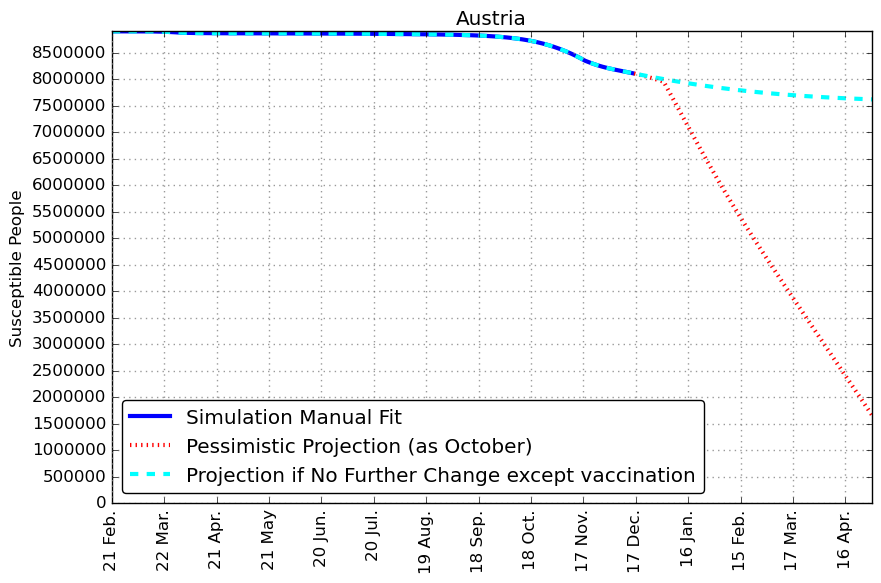

In [138]:
plt.figure(figsize=(9, 6),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir_vac4[:,0])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

#plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Best[:,0])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst[:,0])[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir_vac4[:,0])*N,'--', label="Projection if No Further Change except vaccination", linewidth=3,color='cyan')
#plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')



UpperY3 = N
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,UpperY3+1,500000))

plt.title("Austria")

plt.legend(loc='lower left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
plt.ylabel("Susceptible People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/Susceptible_vac_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)
#plt.xlabel("Time")
plt.ylabel("Susceptible People",size=12)


In [139]:
LengthOfForecast=546
endofplot=NumberDaysData+LengthOfForecast
#only10thindex=np.arange(0,endofplot+1,15)
only10thindex=np.arange(0,endofplot+1,30)
times=np.arange(0,endofplot+1,1)

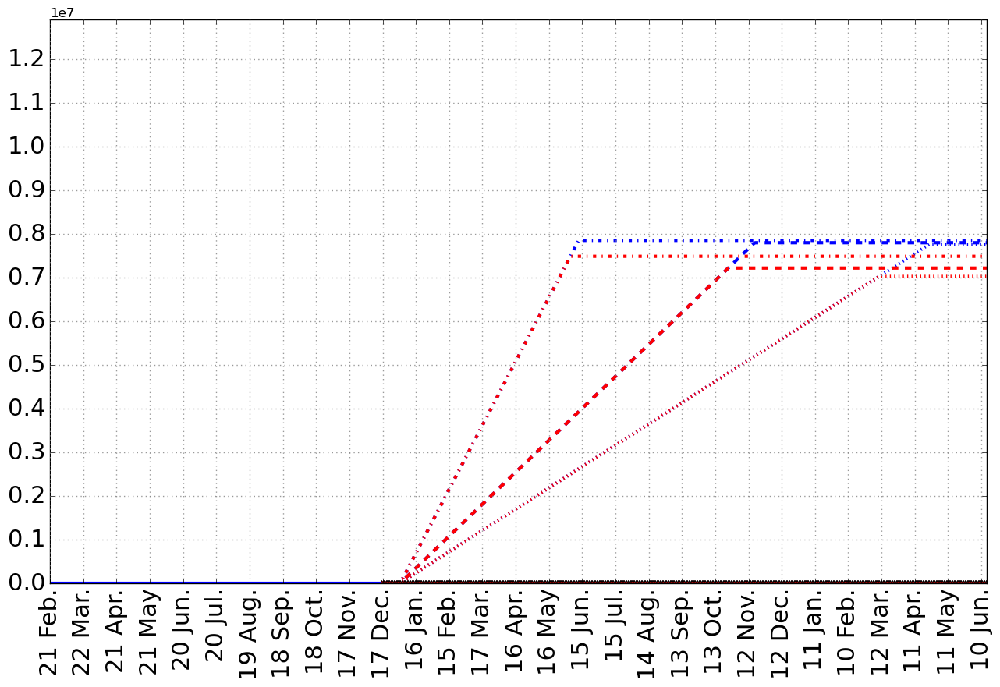

In [140]:
plt.figure(figsize=(13, 9),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir_vac4[:,16])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,16])[NumberDaysData:-1]*N, '-.',label="Projection If No Further Changes + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,16])[NumberDaysData:-1]*N,'--', label="Projection If No Further Changes + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,16])[NumberDaysData:-1]*N,':', label="Projection If No Further Changes + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac4[:,16])[NumberDaysData:-1]*N,'*', label="Projection If No Further Changes + no vaccination strategy", linewidth=3,color='blue')

#plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Best[:,16])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown) 1st vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Best1[:,16])[NumberDaysData:-1]*N,'--', label="Optimistic Projection (as lockdown) 2nd vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Best2[:,16])[NumberDaysData:-1]*N,':', label="Optimistic Projection (as lockdown) 3rd vaccination strategy", linewidth=3,color='green')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst[:,16])[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst1[:,16])[NumberDaysData:-1]*N,'--', label="Pessimistic Projection + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst2[:,16])[NumberDaysData:-1]*N,':', label="Pessimistic Projection + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst3[:,16])[NumberDaysData:-1]*N,'*', label="Pessimistic Projection + no vaccination strategy", linewidth=3,color='red')

#plt.plot(t,(resultsseir_vac[:,16])*N,'--', label="Projection if No Further Change except vaccination", linewidth=3,color='cyan')
#plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = N+4000000
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=22)
plt.yticks(np.arange(0,UpperY3+1,1000000),fontsize=22)

#plt.title("Austria")

#plt.legend(loc='upper left', fancybox=True, numpoints=1,fontsize=13)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Vaccinated People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/Vaccinated_vac_SEIR-ICU_AUSTRIA' + FileFormatOfFigures)
#plt.xlabel("Time")


In [141]:
cases_sim=(resultsseir_vac1[:,0])*N
cases_sim1=(resultsseir_vac2[:,0])*N
cases_sim2=(resultsseir_vac3[:,0])*N
cases_sim3=(resultsseir_vac4[:,0])*N
#cases_sim_Optimistic=(resultsseir_vac_Best[:,0])*N
#cases_sim_Optimistic1=(resultsseir_vac_Best1[:,0])*N
#cases_sim_Optimistic2=(resultsseir_vac_Best2[:,0])*N
cases_sim_Pessimistic=(resultsseir_vac_Worst[:,0])*N
cases_sim_Pessimistic1=(resultsseir_vac_Worst1[:,0])*N
cases_sim_Pessimistic2=(resultsseir_vac_Worst2[:,0])*N
cases_sim_Pessimistic3=(resultsseir_vac_Worst3[:,0])*N


In [142]:
# Some Plotting Variables shared by all Plots

LenghtOfForecast = 136 # 60 # This hold for all plots: by how many days you wish to show simulation, after end of data?
endofplot = NumberDaysData + LenghtOfForecast

#only10thindex=np.arange(0,endofplot+1,15)
only10thindex=np.arange(0,endofplot+1,30)
times=np.arange(0,endofplot+1,1)

plt.style.use('ggplot')
mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

FileFormatOfFigures = '.pdf' # Could be also '.pdf'

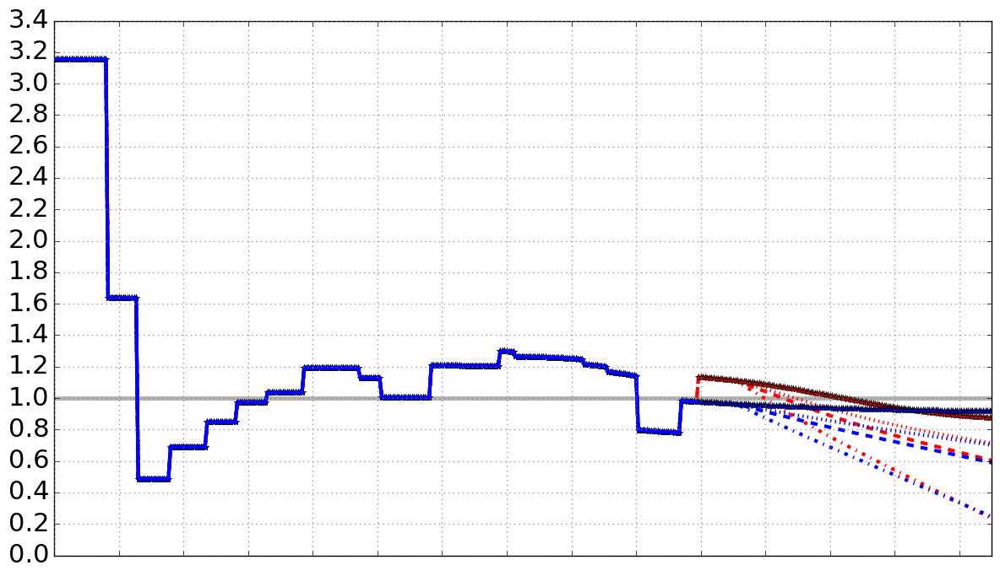

In [143]:
plt.figure(figsize=(12, 7),facecolor="white")
Reff = R_eff(times, cases_sim, ListOfRhos)
Reff1 = R_eff(times, cases_sim1, ListOfRhos)
Reff2 = R_eff(times, cases_sim2, ListOfRhos)
Reff3 = R_eff(times, cases_sim3, ListOfRhos)

#Reff_Opt = R_eff(times, cases_sim_Optimistic, List_Rho_BestScenario)
#Reff_Opt1 = R_eff(times, cases_sim_Optimistic1, List_Rho_BestScenario)
#Reff_Opt2 = R_eff(times, cases_sim_Optimistic2, List_Rho_BestScenario)

Reff_Pess = R_eff(times, cases_sim_Pessimistic, List_Rho_WorstScenario)
Reff_Pess1 = R_eff(times, cases_sim_Pessimistic1, List_Rho_WorstScenario)
Reff_Pess2 = R_eff(times, cases_sim_Pessimistic2, List_Rho_WorstScenario)
Reff_Pess3 = R_eff(times, cases_sim_Pessimistic3, List_Rho_WorstScenario)

plt.axhline(y=1,color='gray',linewidth=3.5, alpha = 0.6)

plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-', label="Simulation Manual Fit", linewidth=3,color='blue')
#plt.plot(times,Reff_Opt,'-.', label="Optimistic Projection (as lockdown) 1st vaccination strategy", linewidth=3,color='green')
#plt.plot(times,Reff_Opt1,'*', label="Optimistic Projection (as lockdown) 2nd vaccination strategy", linewidth=3,color='green')
#plt.plot(times,Reff_Opt2,':', label="Optimistic Projection (as lockdown) 3rd vaccination strategy", linewidth=3,color='green')

plt.plot(times,Reff_Pess,'-.', label="Pessimistic Projection (as October) + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess1,'--', label="Pessimistic Projection (as October) + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess2,':', label="Pessimistic Projection (as October) + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess3,'*', label="Pessimistic Projection (as October) + no vaccination strategy", linewidth=3,color='red')

#plt.plot(times,Reff,'--', label="Projection if No Further Change", linewidth=3,color='blue')

plt.plot(times,Reff,'-.', label="Projection if No Further Change + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff1,'--', label="Projection if No Further Change + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff2,':', label="Projection if No Further Change + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff3,'*', label="Projection if No Further Change + no vaccination strategy", linewidth=3,color='blue')

plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-',linewidth=3,color='blue')

UpperY3 = 3.4

#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY3+1,0.2),fontsize=22)

#plt.title('Austria')

#plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel(“Time”)
#plt.ylabel(r'$R_{eff}(t)$',size=18)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Austria/R_eff_vac_AUSTRIA' + FileFormatOfFigures)


In [78]:

#################################################################################################
### NOW WE INVESTIGATE SYSTEMATICALLY THE EFFECT OF COMBINATIONS OF RHO and TAU_VAC ON S(t),  ###
### i.e. what it takes to get to herd immunity or when we might get there                     ###
#################################################################################################


In [79]:
# Auxiliary function to compute S(rho,tau_vac)|April

def Auxiliary_f_Compute_S(x,y):
    tvac1=y
    ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
               p1,p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac1])
    List_Rho_Scenario = list(ListOfRhos) + [x]
    
    resultsseir_vac5=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_Scenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
    # odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_Scenario,ListOfParametersfirstwave_vac1))    
    return resultsseir_vac5[endofplot,0]*100


100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.0]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.0]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.0]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
100000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.

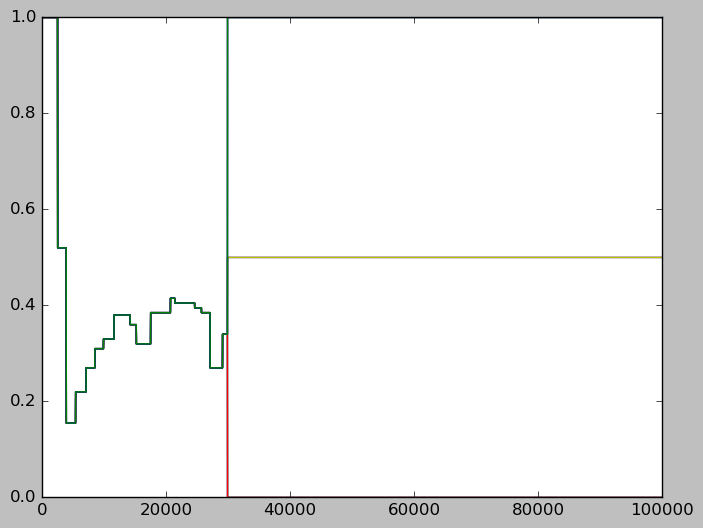

In [46]:
Min_rho = 0
Max_rho = 1
HowManyRhos = 3 # 21 # 21 # 11

Min_tvac = 0
Max_tvac = 0.01 # 0.0111 
HowManyTvacs = 3 # 21 # 20 # 10

#List_rho=np.linspace(0,1,11)
List_rho=np.linspace(Min_rho,Max_rho,HowManyRhos)
#List_tvac = np.linspace(0,0.0111,10)
List_tvac = np.linspace(Min_tvac,Max_tvac,HowManyTvacs)

MyArray = np.zeros(HowManyRhos*HowManyTvacs).reshape(HowManyRhos,HowManyTvacs)

X,Y = np.meshgrid(List_tvac,List_rho)

i=0
for rho in List_rho:
    j=0
    for tvac in List_tvac:
        #rho=List_rho[i]
        #tvac=List_tvac[j]
        MyArray[i,j]=Auxiliary_f_Compute_S(rho,tvac)
        #print(i)
        #print(j)
        #print()
        j=j+1
    i=i+1
print(np.shape(MyArray))


/Users/stefano.magni/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: The following kwargs were not used by contour: 'label'
  if __name__ == '__main__':


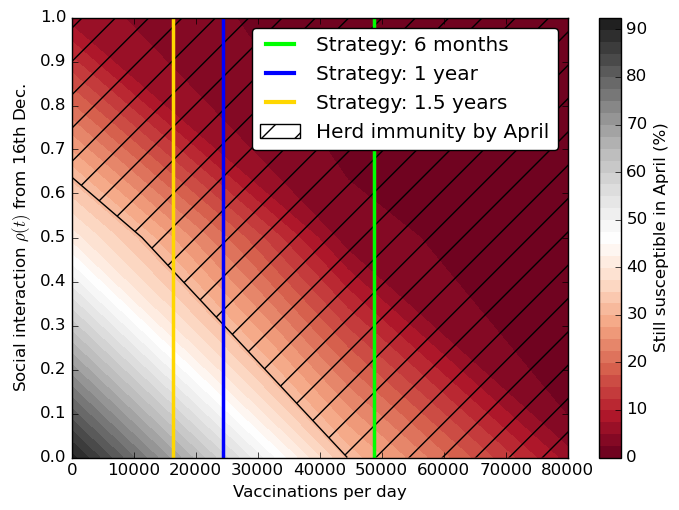

In [47]:
plt.figure(figsize=(8, 5.5),facecolor="white")
plt.contourf(X*N,Y, MyArray,40, cmap='RdGy')
#print(np.size(X))
cbar=plt.colorbar()
cbar.set_label('Still susceptible in April (%)', rotation=90)
n_levels=[0,(1-0.6835)*100]
plt.contour(X*N,Y, MyArray, n_levels, colors='black', linestyles='-')
cs=plt.contourf(X*N,Y, MyArray, n_levels, colors='none',
                  hatches=[ '/',None],label='herd immunity by April'
            )
artists, labels = cs.legend_elements()
My_patch = mpatches.Patch(fill=False,hatch='/')
from matplotlib.lines import Line2D
colors = ['lime', 'blue', 'gold']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors]
lines.append(My_patch)
labels = ['Strategy: 6 months', 'Strategy: 1 year', 'Strategy: 1.5 years','Herd immunity by April']

#plt.plot(N/365,ListOfRhos[-1],marker='o')
#plt.plot(N/365,ListOfRhos[-1],marker='o')
plt.axvline(x=N/(365*0.5),label='Strategy: 6 months',color='lime',linewidth=2.5)
plt.axvline(x=N/365,label='Strategy: 1 year',color='blue',linewidth=2.5)
plt.axvline(x=N/(365*1.5),label='Strategy: 1.5 years',color='gold',linewidth=2.5)
plt.xlabel('Vaccinations per day')
plt.ylabel(r'Social interaction $\rho(t)$ from 16th Dec.')
plt.xlim(0,80000)# 6000) # 6900)
plt.yticks(np.arange(0,1.1,0.1))
plt.legend(lines, labels,fancybox=True)
plt.savefig('./Results_Austria/HerdImmunityByApril_rho_tvac_Austria' + FileFormatOfFigures)

plt.show()


In [48]:
##################################################################################################
### NOW WE EVALUATE SYSTEMATICALLY THE WHEN WE'LL REACH HERD IMMUNITY BASED ON RHO and TAU_VAC ###
##################################################################################################



In [45]:
# Auxiliary function to compute S(rho,tau_vac)|April

def f_HerdImm_Time(x,y):
    tvac1=y
    ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
               p1, p2,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
               tau7prim,tau8prim,tau9prim,tvac1])
    List_Rho_Scenario = list(ListOfRhos) + [x]
    
    IndexOfJanuary1st = np.where(MyListOfDates=='1 January ')[0][0] # January 1st = 315 for Lux
    #Times2years = np.arange(0,IndexOfJanuary1st + 1*365, 1)
    Time2years = IndexOfJanuary1st + 1*365
    
    resultsseir_vac5=model_SEIRICUHOS_vac(dt,P3,Time2years,List_Rho_Scenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays[0:Time2years]]
    #resultsseir_vac5=odeint(model_SEIRICUHOS_vac,P3,Times2years,(List_Rho_Scenario,ListOfParametersfirstwave_vac1))  
    
    # This is the same as above, but now we need to find t_HI such that S(t_HI) == S_HI, 
    # i.e. S needed for Herd immunity
    # For Austria, based on Francoise's calculation S_HI = (1-0.6835)
    
    S_atHerdImm_Aus = 0.27#(1-0.6835)
    # WhenSbiggerSIH = resultsseir_vac5[:,0] <= S_atHerdImm_Lux
    SusceptibleTimeSeries = resultsseir_vac5[:,0]
    WhenSbiggerSIH = np.where(SusceptibleTimeSeries<=S_atHerdImm_Aus)[0]
        
    if WhenSbiggerSIH.size: # Do this only if WhenSbiggerSIH is not empty
        FirstDateAtWhichHerdImmReached = WhenSbiggerSIH[0]
        DaysAfterJan1stForHI = max(0, FirstDateAtWhichHerdImmReached - IndexOfJanuary1st) # Scale to days after Jan 1st, and if negative put 0 as means on Jan 1st we already have herd imm
    else:
        DaysAfterJan1stForHI = np.nan # float('inf') # 
    print(DaysAfterJan1stForHI)
    
    return DaysAfterJan1stForHI


68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2]
nan
68000
[1, 0.52, 0.155, 0.22, 0.2

nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.

67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.21250000000000002]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.225]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.225]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.225]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.225]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.225]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34

65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.3

70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.23750000000000002]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.25]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.25]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0

68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.25]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.25]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.25]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
nan
68000
[1, 0.52

66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.2625]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.275]
nan
68000
[1, 0.5

nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.

68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.28750000000000003]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0

74
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
73
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
72
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.30000000000000004]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

73
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3125]
64
68000
[1, 0.5

70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.325]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
nan
68000
[1, 0.52, 0

67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3375]
63
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
nan
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0

71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.35000000000000003]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

77
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
76
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
75
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
73
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
72
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.36250000000000004]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

75
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
74
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
72
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.375]
66
68000
[1, 0.52, 0.155

71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.3875]
63
68000
[1, 0.5

67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
63
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
62
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4]
60
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
nan
68000
[1, 0.52, 0.15

70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.41250000000000003]
63
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

75
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
73
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
72
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
67
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.42500000000000004]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

72
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
71
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
70
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
69
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
68
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4375]
63
68000
[1, 0.5

66
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
65
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
64
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
63
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
62
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
60
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.45]
59
68000
[1, 0.52, 0.155, 0.22, 

62
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
60
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
59
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
57
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
56
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.4625]
55
68000
[1, 0.5

62
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
60
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
59
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
57
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.47500000000000003]
56
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

62
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
61
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
60
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
59
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
57
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.48750000000000004]
56
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33

58
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
57
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
56
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
56
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
55
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
54
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
54
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
53
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5]
52
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.

53
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
52
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
52
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
51
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
51
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
50
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
49
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
49
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5125]
48
68000
[1, 0.5

49
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
48
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
48
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
47
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
47
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
46
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
46
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
45
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.525]
45
68000
[1, 0.52, 0.155

47
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
47
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
46
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
46
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
45
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
45
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
44
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5375000000000001]
44
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

43
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
43
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
43
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
42
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
42
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
41
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
41
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
41
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.55]
40
68000
[1, 0.52, 0.155, 0.22, 

40
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
39
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
39
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
39
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
38
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
38
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
38
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
38
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5625]
37
68000
[1, 0.5

[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
36
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
36
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
36
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
35
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
35
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
35
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
35
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.575]
34
68000
[1, 0.52, 0.155, 0.22, 0

34
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
33
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
33
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
33
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
33
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
33
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
32
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
32
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.5875]
32
68000
[1, 0.5

32
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
32
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
32
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
31
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
31
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
31
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
31
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6000000000000001]
31
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

30
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
30
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6125]
28
68000
[1, 0.5

[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
27
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.625]
26
68000
[1, 0.52, 0.155, 0.22, 0

26
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6375]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.65]
32
68000
[1, 0.52,

24
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.65]
24
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.65]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.65]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.65]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
29
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.

23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6625000000000001]
22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.675]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.675]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.675]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.675]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.675]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
25
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
25
68000
[1, 0.52, 0.

20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.6875]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7]
23
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7]
23
68000
[1, 0.52, 0.155, 0.22,

22
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
21
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

18
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
18
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7125000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
20
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7250000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7375]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.75]
18
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.75]
18
68000
[1, 0.52, 0

15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.75]
15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.75]
15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.75]
15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
17
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
17
68000
[1, 0.52, 0.1

14
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7625]
14
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
16
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32,

13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7750000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
15
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.7875000000000001]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
13
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
13
68000
[1, 0.52, 0.155, 0.22, 0.

11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8125]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.825]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.825]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.825]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.825]
12
68000
[1, 0.52, 0

11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.825]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
12
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 

10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8375000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
11
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8500000000000001]
10
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38,

9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8625]
9
68000
[1, 0.52, 0.155,

9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8875]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8875]
9
68000
[1, 0.52, 0.155, 0.22

8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8875]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.8875]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
9
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405

8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9000000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0

8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9125000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0

7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.925]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9375]
8
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9375]
7
68000
[1, 0.52, 0.155, 0.22,

7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9375]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9375]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9375]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.95]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.95]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.95]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.95]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.95]
7
68000
[1, 0.52, 0.155, 0.22, 0.2

7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
7
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0

6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9625000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0

6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9750000000000001]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9875]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9875]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405

5
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9875]
5
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9875]
5
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 0.9875]
5
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.31, 0.33, 0.38, 0.36, 0.32, 0.385, 0.415, 0.405, 0.395, 0.385, 0.27, 0.34, 1.0]
6
68000
[1, 0.52, 0.155, 0.22, 0.27, 0.

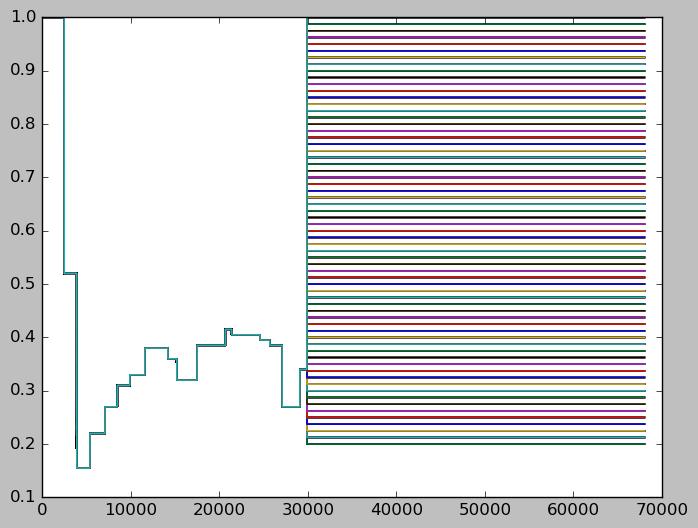

In [46]:
Min_rho = 0.2
Max_rho = 1
HowManyRhos = 65 # 33 # 21 # 21 # 11

Min_tvac = 0
Max_tvac = 0.01 # 0.0111 
HowManyTvacs = 65 # 33 # 21 # 20 # 10

#List_rho=np.linspace(0,1,11)
List_rho=np.linspace(Min_rho,Max_rho,HowManyRhos)
#List_tvac = np.linspace(0,0.0111,10)
List_tvac = np.linspace(Min_tvac,Max_tvac,HowManyTvacs)

MyArray = np.zeros(HowManyRhos*HowManyTvacs).reshape(HowManyRhos,HowManyTvacs)

X,Y = np.meshgrid(List_tvac,List_rho)

i=0
for rho in List_rho:
    j=0
    for tvac in List_tvac:
        #rho=List_rho[i]
        #tvac=List_tvac[j]
        MyArray[i,j]=f_HerdImm_Time(rho,tvac)
        #print(i)
        #print(j)
        #print()
        j=j+1
    i=i+1
print(np.shape(MyArray))


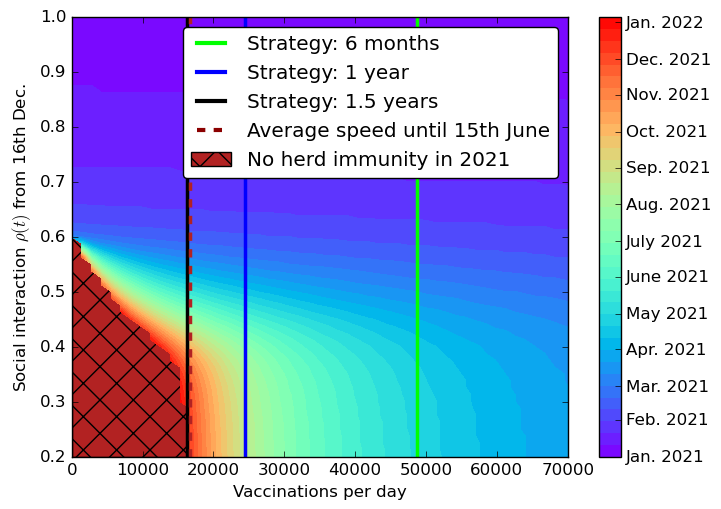

In [62]:
fig = plt.figure(figsize=(8, 5.5),facecolor="white")
ax = fig.add_subplot(111)

plt.contourf(X*N,Y, MyArray,40, cmap='rainbow')#cmap='RdGy')

#cbar=plt.colorbar()
#cbar.set_label('Time to Herd Immunity since Jan 1st', rotation=90)

cbar = plt.colorbar()
cbar.set_ticks([0,
                31,
                31+28,
                31+28+31,
                31+28+31+30,
                31+28+31+30+31,
                31+28+31+30+31+30,
                31+28+31+30+31+30+31,
                31+28+31+30+31+30+31+31,
                31+28+31+30+31+30+31+31+30,
                31+28+31+30+31+30+31+31+30+31,
                31+28+31+30+31+30+31+31+30+31+30,
                31+28+31+30+31+30+31+31+30+31+30+31
               ])

cbar.set_ticklabels(['Jan. 2021', 
                     'Feb. 2021', 
                     'Mar. 2021', 
                     'Apr. 2021',
                     'May 2021', 
                     'June 2021', 
                     'July 2021',
                     'Aug. 2021', 
                     'Sep. 2021', 
                     'Oct. 2021',
                     'Nov. 2021', 
                     'Dec. 2021', 
                     'Jan. 2022'
                    ])

#n_levels=[0,100,200,300,400]#,float('inf')]
#plt.contour(X*N,Y, MyArray, n_levels, colors='black', linestyles='-')
#cs=plt.contourf(X*N,Y, MyArray, n_levels, colors='none',hatches=['\\','\\\\','*'])

import matplotlib.patches as patches
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()
xy = (xmin,ymin)
width = xmax - xmin
height = ymax - ymin
GrayBackground = patches.Rectangle(xy, width, height,color='firebrick',zorder=-10)
BlackHatches = patches.Rectangle(xy, width, height,hatch='x', fill=None, zorder=-9)
ax.add_patch(GrayBackground)
ax.add_patch(BlackHatches)

# artists, labels = cs.legend_elements()
My_patch = mpatches.Patch(hatch='x',facecolor='firebrick',)
from matplotlib.lines import Line2D
colors = ['lime', 'blue','k','darkred']
LineStyles = ['-','-','-','--']
lines = [Line2D([0], [0], color=colors[i], linewidth=3, linestyle=LineStyles[i]) for i in [0,1,2,3]]
lines.append(My_patch)
labels = ['Strategy: 6 months', 'Strategy: 1 year','Strategy: 1.5 years','Average speed until 15th July','No herd immunity in 2021']

#plt.title('When Herd Immunity is reached - Austria')
                
plt.axvline(x=N/(365*0.5),label='Strategy: 6 months',color='lime',linewidth=2.5)
plt.axvline(x=N/365,label='Strategy: 1 year',color='blue',linewidth=2.5)
plt.axvline(x=N/(365*1.5),label='Strategy: 1.5 years',color='k',linewidth=2.5)
plt.axvline(x=N/(365*1.46),label='Average speed until 15 July',color='firebrick',linewidth=2.5,linestyle='--')
plt.xlabel('Fully vaccinated per day')
plt.ylabel(r'Social interaction $\rho(t)$ from 16th Dec.')

plt.xlabel('Vaccinations per day')
plt.ylabel(r'Social interaction $\rho(t)$ from 16th Dec.')
plt.xlim(0,70000)
plt.yticks(np.arange(0.2,1.1,0.1))
plt.legend(lines, labels,fancybox=True)
#plt.legend()
plt.savefig('./Results_Austria/HerdImmunityTIME_rho_tvac_Austria' + FileFormatOfFigures)
plt.show()


In [80]:
### herd immu ity hreshold computational estimation ###

In [81]:
def rhoAsFunctionforAustria(time,ListOfRhos):
    
    rho0 = ListOfRhos[0]
    rho1 = ListOfRhos[1]
    rho2 = ListOfRhos[2]
    rho3 = ListOfRhos[3]
    rho4 = ListOfRhos[4]
    rho5 = ListOfRhos[5]
    rho6 = ListOfRhos[6]
    rho7 = ListOfRhos[7]
    rho8 = ListOfRhos[8]
    rho9 = ListOfRhos[9]
    rho10 = ListOfRhos[10]
    rho11 = ListOfRhos[11]
    rho12 = ListOfRhos[12]
    rho13 = ListOfRhos[13]
    rho14 = ListOfRhos[14]
    rho15 = ListOfRhos[15]
    rho16 = ListOfRhos[16]
         
    ListOfRhosOUTPUT = []
    for t in time:
        if (t<25):
            rho=1
        elif (t>=25)and (t<39):
            rho=rho1
        elif (t>=39)and (t<54):
            rho=rho2
        elif (t>=54)and (t<71):
            rho=rho3
        elif (t>=71)and (t<85):  
            rho=rho4
        elif (t>=85)and(t<99):
            rho=rho5
        elif (t>=99) and (t<116):
            rho=rho6
        elif (t>=116) and (t<142):
            rho=rho7
        elif(t>=142) and (t<152):
            rho=rho8
        elif(t>=152)and (t<175):
            rho=rho9
        elif(t>=175) and (t<207):
            rho=rho10
        elif(t>=207) and (t<214):
            rho=rho11  
        elif(t>=214) and (t<246):
            rho=rho12
        elif(t>=246) and (t<257):
            rho=rho13
        elif(t>=257) and(t<271) :
            rho=rho14
        elif(t>=271)and(t<291):
            rho=rho15
        elif(t>=291)and(t<NumberDaysData):
            rho=rho16
        
        elif t >= NumberDaysData:
            if len(ListOfRhos) < 18:
                rho=1
            elif len(ListOfRhos) >= 18:
                rho=ListOfRhos[17]
            
        ListOfRhosOUTPUT.append(rho)
    return np.array(ListOfRhosOUTPUT)



In [82]:
# rho values
rho1=0.52
rho2=0.155
rho3=0.22

rho4=0.27
rho5=0.31 
rho6=0.33 
rho7=0.38
rho8=0.36
rho9=0.32
rho10=0.385
rho11=0.415
rho12=0.405
rho13=0.395
rho14=0.385
rho15=0.27
rho16=0.34
ListOfRhos=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
ListOfRhos_ManualFit_1stWave=ListOfRhos

In [83]:
# Run the model

N=8901064
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
dt = 0.001
t_max=10000
t = np.linspace(0, t_max, int(t_max/dt) + 1)
resultsseir=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos,ListOfParametersfirstwave))

In [84]:
# rho values
rho1=1
rho2=1
rho3=1

rho4=1
rho5=1 
rho6=1
rho7=1
rho8=1
rho9=1
rho10=1
rho11=1
rho12=1
rho13=1
rho14=1
rho15=1
rho16=1
ListOfRhos1=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13,rho14,rho15,rho16]
ListOfRhos_ManualFit_1stWave=ListOfRhos1

In [85]:
# Run the model

N=8901064
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
t_max = 10000
dt = 0.001
t = np.linspace(0, t_max, int(t_max/dt) + 1)
# Run the model

N=8901064
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
t_max = 10000
dt = 0.001
t = np.linspace(0, t_max, int(t_max/dt) + 1)
resultsseir=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos,ListOfParametersfirstwave))
resultsseir1=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos1,ListOfParametersfirstwave))

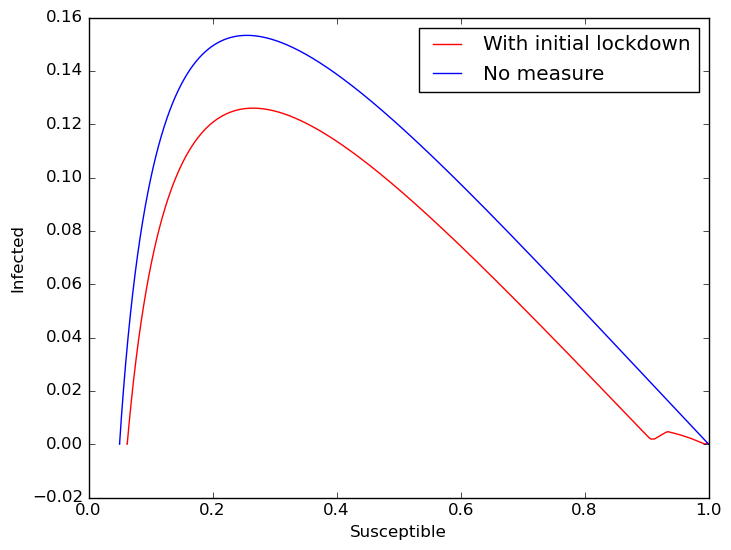

In [86]:
plt.figure(facecolor='white')
plt.plot(resultsseir[:,0], (resultsseir[:,3]+resultsseir[:,5]), color="red",label='With initial lockdown')
plt.plot(resultsseir1[:,0], (resultsseir1[:,3]+resultsseir1[:,5]), color="blue",label='No measure')


plt.xlabel("Susceptible")
plt.ylabel("Infected")  
plt.legend(loc='best')
#plt.title("Phase space")

In [87]:
print ("S max =", resultsseir[:,0][np.argmax(resultsseir[:,3]+resultsseir[:,5])])#maximum wavelength of emission, np.argmax(intensity373,axis=0)] is pulling the maximum value from the intensity array and then matching it to the corresponding wavelength in put to the calculation
#you can get the mu symbol by typing in the latex for it then pressing tab! so \mu tab!
print ("I max = ", np.amax(resultsseir[:,3]+resultsseir[:,5]))

S max = 0.2651916567008811
I max =  0.12600610773050686


In [88]:
print ("S max =", resultsseir1[:,0][np.argmax(resultsseir1[:,3]+resultsseir1[:,5])])#maximum wavelength of emission, np.argmax(intensity373,axis=0)] is pulling the maximum value from the intensity array and then matching it to the corresponding wavelength in put to the calculation
#you can get the mu symbol by typing in the latex for it then pressing tab! so \mu tab!
print ("I max = ", np.amax(resultsseir1[:,3]+resultsseir1[:,5]))

S max = 0.2553399766653955
I max =  0.15330119109016083


In [89]:
list_of_tuples=list(zip(resultsseir[:,0], (resultsseir[:,3]+resultsseir[:,5])))
df2=pd.DataFrame(list_of_tuples,columns=['S','I'])
df2.to_csv(r'dataframe_SIAustria.csv', index = False)